# Day 8–9 Notebook：Cartesian Swing — Step 1–9

本 notebook 對應 `day8-9/day8_9_cartesian_swing_planning_zh_TW.md` 的
**Step 1 — Freeze swing input / output contract**、
**Step 2 — Cartesian quintic Bezier generator** 與
**Step 3 — Terrain-aware apex / clearance construction** 與
**Step 4 — Generalized rim-point IK** 與
**Step 5 — Bezier path 轉 joint trajectory** 與
**Step 6 — 沿軌跡重用 Day 3–5 collision checker** 與
**Step 7 — Touchdown contact validation** 與
**Step 8 — Touchdown velocity validation** 與
**Step 9 — Different-height regression tests**。

Day 8–9 要做的不是「跨 20 mm / 40 mm 障礙物的特殊 gait」，而是一個通用的 swing primitive：

```text
ContactState A  --SWING-->  ContactState B
(p_A, rim_A, alpha_A)       (p_B, rim_B, alpha_B)
```

平地 swing 只是 `z_TD = 0` 的特例。Step 1 的工作是把這件事**變成可檢查的資料**，
還不產生任何軌跡：沒有 Bezier、沒有 IK、沒有 collision query。

| 這本 notebook 做什麼 | 這本 notebook 還不做什麼 |
| --- | --- |
| 凍結 `SwingRequest2D` / `SwingResult2D` 的欄位 | 解 rim-point IK（Step 4–5） |
| 檢查一個 swing 問題是否 well-posed | 沿軌跡做 collision check（Step 6） |
| 建立 flat→flat / 不同高度的 test case | 判斷 touchdown 是否真的可達（Step 7–8） |
| 把 Day 6–7 的 roll-end 接成 swing start | 保證軌跡真的飛得過去 |
| 生成 Cartesian quintic Bezier 與速度 | trajectory optimization |
| 依 corridor 內的障礙物抬高 apex | 保證 collision-free（那是 Step 6） |
| 解 `(p, rim, alpha) -> (theta, beta)` 並回報收斂/殘差 | 驗證 touchdown 狀態（Step 7） |
| 沿整條軌跡解 IK，檢查 limits 與 joint 連續性 | 驗證 touchdown 速度（Step 8） |
| 對每個姿態重建完整腿部幾何做 collision check | 驗證 touchdown 速度（Step 8） |
| 在最後一幀重新做 contact query，比對 rim / alpha / surface | ROLL / SWING 選擇（Day 10–11） |
| 分解 touchdown 速度並依 threshold 判定 | four-leg gait timing、support polygon |

**完成標準**（來自規劃）：

- Step 1：可以建立一個合法的 flat-to-flat test case 並通過 data validation。
- Step 2：所有 case 使用同一個 generator，且 endpoint / duration 正確。
- Step 3：中間存在 obstacle 時，Bezier path 會自動提高，而不是只看 target z。
- Step 4：指定數個已知 FK 產生的 `(p, rim, alpha)`，IK 可以重建對應 configuration，且 residual 在 tolerance 內。
- Step 5：flat-to-flat 與不同 target height case 都可以輸出連續 joint trajectory。
- Step 6：可以建立一條「contact point 看起來跨得過，但 leg-wheel body 會撞 vertical face」的反例，並正確判 invalid。
- Step 7：只有真正落到指定 ContactState 的 trajectory 才回傳 success。
- Step 8：輸出 touchdown Cartesian velocity 與 normal / tangential 分量，並可依 threshold 判斷 valid / invalid。
- Step 9：同一個 `generate_swing()` 只修改 `SwingTarget`，即可產生不同 touchdown height 的 collision-free、IK-feasible swing。

In [1]:
from pathlib import Path
import sys
from dataclasses import fields, replace

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from IPython.display import HTML, display

search_root = Path.cwd().resolve()
project_root = next(
    (p for p in (search_root, *search_root.parents) if (p / 'legwheel').is_dir()), None
)
if project_root is None:
    raise RuntimeError('找不到 LegWheel project root；請從專案內啟動此 notebook。')
if str(project_root) not in sys.path:
    sys.path.insert(0, str(project_root))

from legwheel.planners.hybrid import HipPose2D, RimId, plot_terrain_profile_2d

from hybrid_note.scripts.experiments.cartesian_swing_contract_2d import (
    HipTrajectory2D,
    SwingConstraints2D,
    SwingFailure,
    SwingRequest2D,
    SwingResult2D,
    SwingSample2D,
    SwingStartState2D,
    SwingTarget2D,
    active_contact_candidate_2d,
    build_leg_on_surface_scene_2d,
    build_swing_request_2d,
    day6_7_roll_end_swing_start_2d,
    flat_to_flat_swing_request_2d,
    pending_swing_result_2d,
    rim_alpha_limits_rad,
    swing_request_rows,
    swing_target_from_scene_2d,
    swing_result_frame_rows,
    swing_result_summary_row,
    validate_swing_request_2d,
    write_swing_result_csv,
)
from hybrid_note.scripts.experiments.cartesian_swing_path_2d import (
    DEFAULT_MID_FRACTIONS,
    generate_swing_path_2d,
    quintic_swing_control_points_2d,
    swing_apex_height_m,
    swing_path_endpoint_report,
)
from hybrid_note.scripts.experiments.single_leg_rolling_scene_2d import (
    build_single_leg_rolling_scene_2d,
)
from hybrid_note.scripts.experiments.cartesian_swing_trajectory_2d import (
    joint_trajectory_report_2d,
    solve_swing_joint_trajectory_2d,
)
from hybrid_note.scripts.experiments.cartesian_swing_planner_2d import (
    animate_swing_2d,
    animate_step_swing_2d,
    swing_onto_step_2d,
    swing_off_step_2d,
    minimum_duration_for_touchdown_drop_s,
    repair_swing_2d,
    swing_io_rows,
    feasible_regression_cases_2d,
    generate_swing_2d,
    regression_row,
    rejected_regression_cases_2d,
)
from hybrid_note.scripts.experiments.cartesian_swing_velocity_2d import (
    validate_swing_touchdown_velocity_2d,
)
from hybrid_note.scripts.experiments.cartesian_swing_touchdown_2d import (
    validate_swing_touchdown_2d,
)
from hybrid_note.scripts.experiments.cartesian_swing_collision_2d import (
    check_swing_trajectory_collisions_2d,
    collision_frame_rows,
    swing_sample_scene_2d,
)
from hybrid_note.scripts.experiments.single_leg_rolling_scene_2d import (
    plot_single_leg_rolling_scene_2d,
)
from hybrid_note.scripts.experiments.cartesian_swing_ik_2d import (
    THETA_MAX_RAD,
    THETA_MIN_RAD,
    rim_arc_2d,
    rim_contact_point_hip_xz_m,
    rim_contact_point_world_xz_m,
    rim_point_model_gap_2d,
    solve_contact_ik_2d,
)
from legwheel.visualization.plot_leg import PlotLeg
from legwheel.planners.hybrid.geometry_2d import legacy_rim_sample_alpha_rad
from hybrid_note.scripts.kinematics.ground_contact_single_pose import (
    sample_contact_geometry_points,
)
from hybrid_note.scripts.experiments.cartesian_swing_contract_2d import (
    rim_alpha_limits_rad,
    rim_for_alpha_rad,
)
from hybrid_note.scripts.experiments.cartesian_swing_path_2d import (
    corridor_obstacle_top_surfaces_2d,
    generate_terrain_aware_swing_path_2d,
    path_point_clearance_report_2d,
    path_point_clearance_samples_2d,
    terrain_aware_apex_2d,
)

day6_7_dir = project_root / 'hybrid_note/notes/day6-7'
day8_9_dir = project_root / 'hybrid_note/notes/day8-9'
print(f'Project root: {project_root}')

Project root: /home/chang/corgi_ws/icra hybrid/LegWheel


## 1. 為什麼 Step 1 先只做契約

Day 6–7 的教訓是：rolling 之所以能一路推到 full traversal，是因為 `ContactState`、rim/alpha、terrain surface
這幾個東西**在第一天就被定義成明確型別**，後面每個 stage 才能互相接。

Swing 這邊更需要，因為它同時牽涉四層資料：

```text
world 幾何   :  contact point、terrain surface
rim 幾何     :  rim id、alpha
關節         :  theta / beta / gamma
時間         :  swing duration、每個 sample 的 t 與 velocity
```

如果先寫 Bezier，這四層就會被埋在函式參數裡，Step 6 想加 collision check 時得回頭改介面。
所以 Step 1 只回答一個問題：

> **一個 swing 問題「問得好不好」，怎麼用程式判斷？**

這裡的 well-posed **不等於** feasible。契約只保證問題本身自洽（兩端都落在真實 terrain surface 上、
alpha 屬於它自己的 rim 弧、起始姿態沒超出 joint limit）；能不能實際飛過去，是 Step 2–8 的事。

## 2. 契約總覽

```text
輸入                                    輸出
────────────────────────────────        ────────────────────────────
SwingStartState2D   起點 contact +      SwingResult2D
                    theta/beta/gamma      ├─ samples: SwingSample2D[]
SwingTarget2D       落點 contact +       ├─ valid / failure
                    clearance             ├─ minimum_terrain_clearance
TerrainProfile2D    地形                 ├─ final_contact_error
HipTrajectory2D     swing 期間 hip 走法   ├─ final_alpha_error
SwingConstraints2D  所有 tolerance/limit  └─ touchdown normal / tangential speed
swing_duration_s, sample_count
        │
        └──► SwingRequest2D ──► validate_swing_request_2d() ──► ()  代表 well-posed
```

兩個刻意的設計決策：

**(a) 不改 Day 1 的 `ContactState`。**
`legwheel.planners.hybrid.types.ContactState` 是 Day 1 凍結的世界座標契約（rim / alpha / point / surface），
Day 3–7 全部依賴它。Swing 額外需要「實現這個接觸的關節角」，因為 Step 5 要拿它當第一個 IK 初始猜測、
Step 6 要用它重建整條腿的幾何。所以這裡用 `SwingStartState2D` **組合**兩者，而不是把 theta/beta 塞進 Day 1 型別；
需要純 contact 資料時呼叫 `.as_contact_state()` 換回去。

**(b) 沒算過的欄位一律是 `None`，不是 0。**
`SwingSample2D` 的 `theta_rad`、`ik_residual_m`、`collision_free` 等欄位在 Step 2 還不存在，
留 `None` 讓「還沒檢查」和「檢查過是 0」在資料上分得開。

In [2]:
def field_table(dataclass_type):
    rows = []
    for item in fields(dataclass_type):
        rows.append({
            'field': item.name,
            'type': item.type if isinstance(item.type, str) else getattr(item.type, '__name__', str(item.type)),
        })
    return pd.DataFrame(rows)

for cls in (SwingStartState2D, SwingTarget2D, SwingSample2D):
    print(f'--- {cls.__name__} ---')
    display(field_table(cls))

--- SwingStartState2D ---


,field,type
0,contact_point_world_xz_m,NDArray[np.float64]
1,rim,RimId
2,alpha_rad,float
3,terrain_surface_id,str
4,theta_rad,float
5,beta_rad,float
6,hip_pose,HipPose2D
7,gamma_rad,float


--- SwingTarget2D ---


,field,type
0,target_point_world_xz_m,NDArray[np.float64]
1,target_rim,RimId
2,target_alpha_rad,float
3,target_terrain_surface_id,str
4,clearance_m,float


--- SwingSample2D ---


,field,type
0,index,int
1,time_s,float
2,position_world_xz_m,NDArray[np.float64]
3,velocity_world_xz_mps,NDArray[np.float64]
4,alpha_rad,float
5,rim,RimId
6,theta_rad,float | None
7,beta_rad,float | None
8,gamma_rad,float | None
9,ik_converged,bool | None


## 3. Start state 從哪裡來：Day 6–7 的 roll-end

規劃 §7.1 說得很清楚：Day 8–9 最理想的 start state 就是 Day 6–7 輸出的 roll-end contact。
這裡直接讀 Day 6–7 的 canonical cache `day6_7_roll_up_end_state.json`，
用**同一套** terrain query 把它重建成 `SwingStartState2D`——不是把快取裡的接觸點抄過來，
而是重新跑一次 query 再跟快取比對，差超過 contact tolerance 就直接報錯。

In [3]:
day8_9_roll_end_scene, day8_9_roll_end_start = day6_7_roll_end_swing_start_2d(
    day6_7_dir / 'day6_7_roll_up_end_state.json'
)
display(pd.DataFrame([day8_9_roll_end_start.as_dict()]).T.rename(columns={0: 'value'}))
print('Day 1 ContactState 視角：', day8_9_roll_end_start.as_contact_state())

,value
contact_x_m,0.120496
contact_z_m,0.1
rim,right_rim
alpha_deg,94.833333
terrain_surface_id,day6_7_step4_5_obstacle_top
theta_deg,60.0
beta_deg,-69.0
gamma_deg,0.0
hip_x_m,0.135531
hip_z_m,0.269609


Day 1 ContactState 視角： ContactState(rim=<RimId.RIGHT: 'right_rim'>, alpha_rad=1.655153907307956, point_world_m=array([0.12049648, 0.        , 0.1       ]), terrain_surface_id='day6_7_step4_5_obstacle_top')


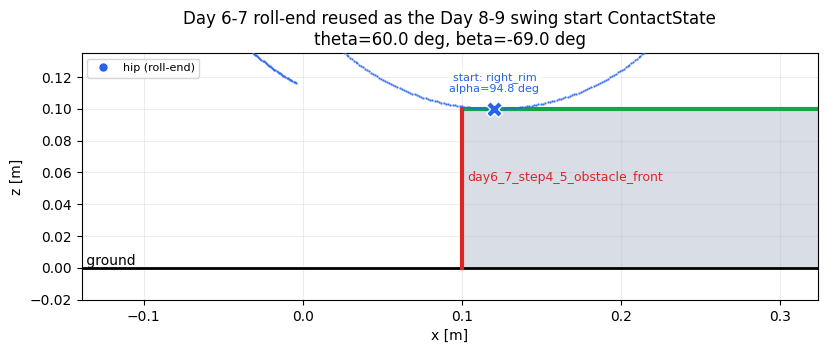

In [4]:
def draw_leg(ax, scene, color, label, alpha=1.0, linewidth=1.4):
    # 畫一個 scene 的 linkage + rim 取樣點；幾何全部來自既有的 SampledLegGeometry2D
    for segment in scene.geometry.link_segments_world_xz_m:
        ax.plot(segment[:, 0], segment[:, 1], color=color, lw=linewidth, alpha=alpha, zorder=4)
    points = scene.geometry.points_world_xz_m
    ax.plot(points[:, 0], points[:, 1], '.', ms=1.5, color=color, alpha=alpha * 0.75, zorder=3)
    hip = scene.hip_pose.position_world_xz_m
    ax.plot(hip[0], hip[1], 'o', ms=5, color=color, alpha=alpha, label=label, zorder=6)


def mark_contact(ax, point, color, text, dy=12):
    ax.plot(point[0], point[1], 'X', ms=11, color=color, mec='white', mew=1.0, zorder=9)
    ax.annotate(text, point, xytext=(0, dy), textcoords='offset points',
                ha='center', fontsize=8, color=color, zorder=9,
                bbox={'facecolor': 'white', 'alpha': 0.75, 'edgecolor': 'none', 'pad': 1.5})


def scene_x_limits(*scenes, pad=0.06):
    xs = np.concatenate([s.geometry.points_world_xz_m[:, 0] for s in scenes])
    return float(xs.min() - pad), float(xs.max() + pad)


fig, ax = plt.subplots(figsize=(9.5, 4.6))
plot_terrain_profile_2d(day8_9_roll_end_scene.terrain, ax=ax,
                        x_limits_m=scene_x_limits(day8_9_roll_end_scene))
draw_leg(ax, day8_9_roll_end_scene, '#2563eb', 'hip (roll-end)')
mark_contact(ax, day8_9_roll_end_start.contact_point_world_xz_m, '#2563eb',
             f'start: {day8_9_roll_end_start.rim.value}\n'
             f'alpha={day8_9_roll_end_start.alpha_deg:.1f} deg')
ax.set_aspect('equal', adjustable='box')
ax.grid(True, alpha=0.22)
ax.legend(fontsize=8, loc='upper left')
ax.set_xlabel('x [m]'); ax.set_ylabel('z [m]')
ax.set_title('Day 6-7 roll-end reused as the Day 8-9 swing start ContactState\n'
             f'theta={day8_9_roll_end_start.theta_deg:.1f} deg, '
             f'beta={day8_9_roll_end_start.beta_deg:.1f} deg')
plt.show()

### 讀圖

接觸點在 **right rim、alpha ≈ 94.8°、障礙物頂面**，不是腳尖。這正是規劃 §3 想強調的差別：
傳統 walk 的 swing 起點是一個 foothold，而 hybrid swing 的起點是一個 **contact configuration**。

同一顆接觸點若換成 `foot_rim` 或不同 alpha 抵達，後續可 roll 的範圍會完全不同，
所以契約必須把 `rim` 和 `alpha` 一路帶著走，不能只留世界座標。

（這裡的重建誤差是 0，因為 rebuild 用的是 Day 6–7 存下的 `active_sample_index`，
再由 terrain query 重新算接觸；快取只當索引用。）

## 4. Step 1 的參考案例：flat → flat

完成標準要求「一個合法的 flat-to-flat test case 通過 data validation」。

這裡兩端都不是手填數字，而是用 `build_leg_on_surface_scene_2d()` 把同一個姿態**放到地面上**
（只解 hip 高度，讓最低的 rim 取樣點剛好落在地面），再用 Day 3–5 的 `query_contact` 取出真正的接觸點。
好處是：target 一定對應一個實際存在的 configuration，之後 Step 4–5 的 IK 若解不出來，
那是 planner 的結果，而不是一開始就下了不可能的訂單。

In [5]:
day8_9_theta = np.deg2rad(60.0)
day8_9_beta = 0.0
day8_9_step_length_m = 0.15

flat_start_scene = build_leg_on_surface_scene_2d(day8_9_theta, day8_9_beta, 0.0, 0.0,
                                                 obstacle_x_start_m=None)
flat_target_scene = build_leg_on_surface_scene_2d(day8_9_theta, day8_9_beta,
                                                  day8_9_step_length_m, 0.0,
                                                  obstacle_x_start_m=None)
flat_request = build_swing_request_2d(flat_start_scene, flat_target_scene,
                                      clearance_m=0.03, swing_duration_s=0.6,
                                      sample_count=101)

flat_problems = validate_swing_request_2d(flat_request)
print('validate_swing_request_2d ->', flat_problems)
print('well-posed' if not flat_problems else 'NOT well-posed')
display(pd.DataFrame(swing_request_rows(flat_request)))

validate_swing_request_2d -> ()
well-posed


,section,field,value
0,start,contact_x_m,-0.0
1,start,contact_z_m,0.0
2,start,rim,foot_rim
3,start,alpha_deg,0.0
4,start,terrain_surface_id,ground
5,start,theta_deg,60.0
6,start,beta_deg,0.0
7,start,gamma_deg,0.0
8,start,hip_x_m,0.0
9,start,hip_z_m,0.219449


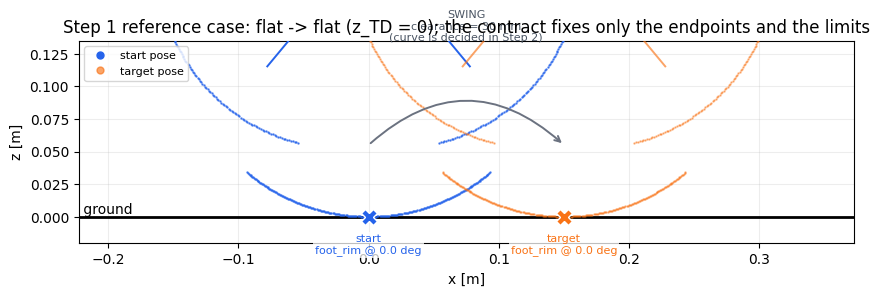

In [6]:
fig, ax = plt.subplots(figsize=(10, 4.4))
plot_terrain_profile_2d(flat_request.terrain, ax=ax,
                        x_limits_m=scene_x_limits(flat_start_scene, flat_target_scene))
draw_leg(ax, flat_start_scene, '#2563eb', 'start pose')
draw_leg(ax, flat_target_scene, '#f97316', 'target pose', alpha=0.65)
start_point = flat_request.start.contact_point_world_xz_m
target_point = flat_request.target.target_point_world_xz_m
mark_contact(ax, start_point, '#2563eb',
             f'start\n{flat_request.start.rim.value} @ {flat_request.start.alpha_deg:.1f} deg', dy=-26)
mark_contact(ax, target_point, '#f97316',
             f'target\n{flat_request.target.target_rim.value} @ '
             f'{flat_request.target.target_alpha_deg:.1f} deg', dy=-26)
ax.annotate('', target_point + np.array([0.0, 0.055]), start_point + np.array([0.0, 0.055]),
            arrowprops={'arrowstyle': '->', 'color': '#6b7280', 'lw': 1.4,
                        'connectionstyle': 'arc3,rad=-0.45'})
ax.text(0.5 * (start_point[0] + target_point[0]), 0.135,
        f'SWING\nclearance = {flat_request.target.clearance_m * 1e3:.0f} mm\n'
        '(curve is decided in Step 2)', ha='center', fontsize=8, color='#4b5563')
ax.set_aspect('equal', adjustable='box')
ax.grid(True, alpha=0.22)
ax.legend(fontsize=8, loc='upper left')
ax.set_xlabel('x [m]'); ax.set_ylabel('z [m]')
ax.set_title('Step 1 reference case: flat -> flat (z_TD = 0); '
             'the contract fixes only the endpoints and the limits')
plt.show()

### 這張圖裡「還沒有的東西」

灰色箭頭只是示意，**不是** trajectory。Step 1 沒有任何一條曲線是算出來的：
契約只固定了兩端的 contact state、clearance、duration 與 sample 數。
中間怎麼飛、飛得過飛不過，全部留給 Step 2（Bezier）、Step 3（terrain-aware apex）與 Step 6（collision）。

## 5. 同一個契約，五種 terrain case

規劃 §Step 9 列出的 regression case，這裡先確認**資料層**全部走同一條路：
只換 `SwingTarget2D`，不換任何 gait logic。

In [7]:
day8_9_obstacle = dict(obstacle_x_start_m=0.10, obstacle_width_m=0.35,
                       obstacle_height_m=0.04, obstacle_id='day8_9_obstacle')
day8_9_gap_obstacle = dict(obstacle_x_start_m=0.10, obstacle_width_m=0.15,
                           obstacle_height_m=0.04, obstacle_id='day8_9_obstacle')


def ground_scene(hip_x_m, support_z_m, **obstacle):
    return build_leg_on_surface_scene_2d(day8_9_theta, day8_9_beta, hip_x_m, support_z_m,
                                         **obstacle)


day8_9_cases = {}
day8_9_cases['A flat -> flat'] = (flat_start_scene, flat_target_scene)

for letter, height_m, label in (('B', 0.02, '20 mm'), ('C', 0.04, '40 mm')):
    obstacle = dict(day8_9_obstacle, obstacle_height_m=height_m)
    low = ground_scene(0.00, 0.00, **obstacle)
    high = ground_scene(0.20, height_m, **obstacle)
    day8_9_cases[f'{letter} flat -> {label} top'] = (low, high)
    if letter == 'C':
        day8_9_cases[f'D {label} top -> flat'] = (high, low)

day8_9_cases['E flat -> flat, obstacle between'] = (
    ground_scene(0.00, 0.00, **day8_9_gap_obstacle),
    ground_scene(0.40, 0.00, **day8_9_gap_obstacle),
)

day8_9_requests = {
    name: build_swing_request_2d(start_scene, target_scene, clearance_m=0.03)
    for name, (start_scene, target_scene) in day8_9_cases.items()
}

day8_9_case_table = pd.DataFrame([
    {
        'case': name,
        'start_surface': request.start.terrain_surface_id,
        'start_z_mm': round(request.start.contact_point_world_xz_m[1] * 1e3, 3),
        'start_rim': request.start.rim.value,
        'start_alpha_deg': request.start.alpha_deg,
        'target_surface': request.target.target_terrain_surface_id,
        'target_z_mm': round(request.target.touchdown_height_m * 1e3, 3),
        'target_rim': request.target.target_rim.value,
        'dz_mm': round(request.height_change_m * 1e3, 3),
        'span_mm': round(request.horizontal_span_m * 1e3, 3),
        'well_posed': not validate_swing_request_2d(request),
    }
    for name, request in day8_9_requests.items()
])
display(day8_9_case_table)

,case,start_surface,start_z_mm,start_rim,start_alpha_deg,target_surface,target_z_mm,target_rim,dz_mm,span_mm,well_posed
0,A flat -> flat,ground,0.0,foot_rim,0.0,ground,0.0,foot_rim,0.0,150.0,True
1,B flat -> 20 mm top,ground,0.0,foot_rim,0.0,day8_9_obstacle_top,20.0,foot_rim,20.0,200.0,True
2,C flat -> 40 mm top,ground,0.0,foot_rim,0.0,day8_9_obstacle_top,40.0,foot_rim,40.0,200.0,True
3,D 40 mm top -> flat,day8_9_obstacle_top,40.0,foot_rim,0.0,ground,0.0,foot_rim,-40.0,-200.0,True
4,"E flat -> flat, obstacle between",ground,0.0,foot_rim,0.0,ground,0.0,foot_rim,0.0,400.0,True


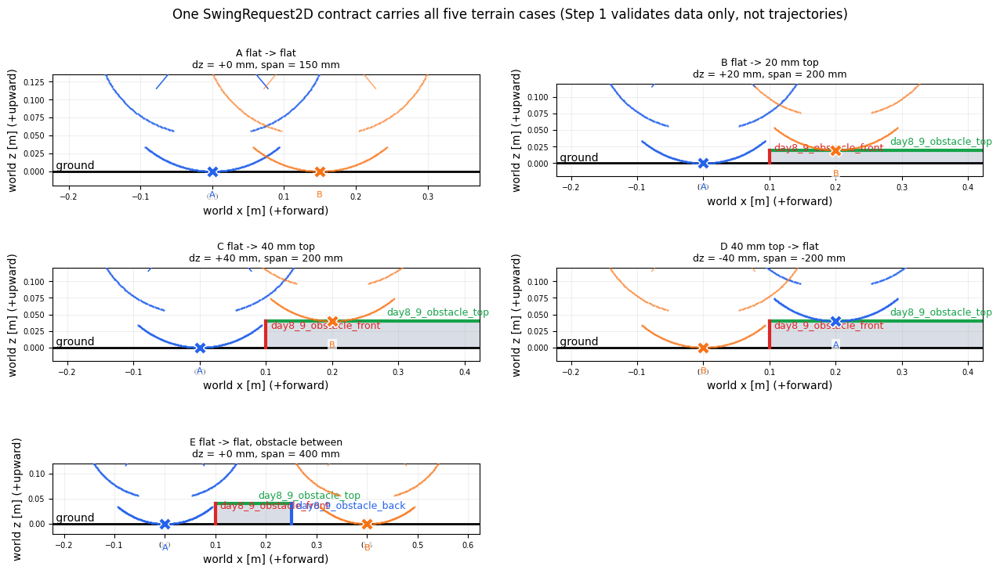

In [8]:
fig, axes = plt.subplots(3, 2, figsize=(13, 7.5))
for ax, (name, (start_scene, target_scene)) in zip(axes.ravel(), day8_9_cases.items()):
    request = day8_9_requests[name]
    plot_terrain_profile_2d(request.terrain, ax=ax,
                            x_limits_m=scene_x_limits(start_scene, target_scene))
    draw_leg(ax, start_scene, '#2563eb', 'start', linewidth=1.1)
    draw_leg(ax, target_scene, '#f97316', 'target', alpha=0.6, linewidth=1.1)
    mark_contact(ax, request.start.contact_point_world_xz_m, '#2563eb', 'A', dy=-24)
    mark_contact(ax, request.target.target_point_world_xz_m, '#f97316', 'B', dy=-24)
    ax.set_aspect('equal', adjustable='box')
    ax.grid(True, alpha=0.2)
    ax.set_title(f'{name}\ndz = {request.height_change_m * 1e3:+.0f} mm, '
                 f'span = {request.horizontal_span_m * 1e3:.0f} mm', fontsize=9)
    ax.tick_params(labelsize=7)
axes.ravel()[-1].axis('off')
fig.suptitle('One SwingRequest2D contract carries all five terrain cases '
             '(Step 1 validates data only, not trajectories)', y=0.995)
fig.tight_layout()
plt.show()

### 讀表

五個 case 走的是同一個 `build_swing_request_2d()`，差別只在 `SwingTarget2D` 的
`target_point / target_rim / target_alpha / target_terrain_surface_id`。
這就是規劃第 19 條設計決策的第 1、2 點在資料層的樣子：

```text
swing 是通用 primitive，不是特定障礙高度的 gait
平地 swing = z_TD = 0 的普通 case
```

注意 case C（40 mm → flat）不是把 case B 倒過來寫另一套程式，而是把同一組 scene 交換順序而已。

表中 `start_z_mm` 的 0.000 不是恰好 0，而是 0 + 1 nm：`build_leg_on_surface_scene_2d()`
沿用 Day 6–7 的 `surface_offset_m = 1e-9` 慣例，把腿抬離支撐面 1 奈米。
理由很實際——取樣點若「剛好」落在面上，contact 還是 penetration 就由 1e-17 的浮點誤差決定。

**這張表沒有證明的事**：`well_posed = True` 只代表問題自洽。
case E 的起點腿身其實離障礙物前緣很近，會不會在 swing 中途撞上，Step 6 才知道。

## 6. Validation 抓得到什麼

契約的價值在於**擋得住錯的輸入**。這裡故意造五種壞掉的 request，看訊息是否具體到能直接修。

In [9]:
bad_cases = {}

bad_cases['target 指到不存在的 surface'] = replace(
    flat_request, target=replace(flat_request.target, target_terrain_surface_id='not_a_surface'))

bad_cases['target z 不在它宣稱的 surface 上'] = replace(
    flat_request, target=replace(flat_request.target, target_point_world_xz_m=[0.15, 0.04]))

obstacle_request = day8_9_requests['C flat -> 40 mm top']
bad_cases['target 落在垂直面'] = replace(
    obstacle_request,
    target=replace(obstacle_request.target,
                   target_terrain_surface_id='day8_9_obstacle_front',
                   target_point_world_xz_m=[0.10, 0.02]))

bad_cases['start theta 超出 joint limit'] = replace(
    flat_request, start=replace(flat_request.start, theta_rad=np.deg2rad(170.0)))

bad_cases['start 與 target 是同一個 contact state'] = replace(
    flat_request,
    target=SwingTarget2D(flat_request.start.contact_point_world_xz_m,
                         flat_request.start.rim,
                         flat_request.start.alpha_rad,
                         flat_request.start.terrain_surface_id))

display(pd.DataFrame([
    {'bad input': name, 'validate_swing_request_2d() 回報': ' / '.join(validate_swing_request_2d(request))}
    for name, request in bad_cases.items()
]))

,bad input,validate_swing_request_2d() 回報
0,target 指到不存在的 surface,target contact names terrain surface 'not_a_su...
1,target z 不在它宣稱的 surface 上,target contact z=0.040000 m is 40.00 mm from s...
2,target 落在垂直面,target contact surface 'day8_9_obstacle_front'...
3,start theta 超出 joint limit,start theta=170.00 deg is outside the joint li...
4,start 與 target 是同一個 contact state,start and target describe the same contact sta...


In [10]:
# alpha 與 rim 不匹配這一類，連 request 都組不起來——型別在建構當下就拒絕。
foot_min_deg, foot_max_deg = np.rad2deg(rim_alpha_limits_rad(RimId.FOOT))
print(f'foot_rim 的 alpha 範圍：[{foot_min_deg:.0f}°, {foot_max_deg:.0f}°]')
try:
    SwingTarget2D([0.15, 0.0], RimId.FOOT, np.deg2rad(90.0), 'ground')
except ValueError as error:
    print('SwingTarget2D(foot_rim, alpha=90°) 被拒絕：', error)

foot_rim 的 alpha 範圍：[-40°, 40°]
SwingTarget2D(foot_rim, alpha=90°) 被拒絕： alpha_rad must lie within the selected rim arc.


### 為什麼 rim/alpha 不一致要在建構時就擋

`foot_rim` 只擁有 alpha ∈ [−40°, 40°] 這段弧，`upper_tyre_l` / `upper_tyre_r` 各自擁有另外兩段
（這組邊界來自既有的 `LEGACY_SURFACE_ALPHA_LIMITS_DEG`，不是這裡新定義的）。

`(rim=foot_rim, alpha=90°)` 不是「難達成的目標」，而是**指涉不存在的接觸點**。
這種錯若放到 Step 5 才由 IK 發現，會表現成「IK 不收斂」，看起來像 planner 能力不足；
在型別層擋掉，錯誤訊息才指向真正的原因。

同理，`validate_swing_request_2d()` 回傳的是**清單**不是布林值：一次把所有問題講完，
而不是修一個再跑一次才看到下一個。

## 7. 輸出契約：`SwingResult2D`

規劃 §Step 1 要求輸出至少包含 time / Cartesian / joint samples、valid flag、failure reason、
minimum clearance、final contact error、final alpha error。

Step 1 還沒有 planner，所以這裡用 `pending_swing_result_2d()` 產生「尚未求解」的結果物件，
把 schema 完整走一遍。三個刻意的約束：

1. `valid=True` 一定配 `failure=NONE`，反之亦然——型別會擋掉自相矛盾的結果；
2. 沒被評估過的欄位是 `None`，不是 0；
3. `SwingResult2D` 帶著整個 `request`，結果可以自我解釋，不必回頭比對是哪個輸入產生的。

In [11]:
flat_pending = pending_swing_result_2d(flat_request)
print('valid =', flat_pending.valid, '| failure =', flat_pending.failure.value,
      '| samples =', flat_pending.sample_count)

display(pd.DataFrame([swing_result_summary_row(flat_pending)]).T.rename(columns={0: 'value'}))

try:
    SwingResult2D(request=flat_request, valid=True, failure=SwingFailure.IK_NOT_CONVERGED)
except ValueError as error:
    print('自相矛盾的結果被拒絕：', error)

print('\nSwingFailure 詞彙表：')
print('\n'.join(f'  {item.value}' for item in SwingFailure))

valid = False | failure = NOT_EVALUATED | samples = 0


,value
valid,False
failure,NOT_EVALUATED
failure_sample_index,None
failure_detail,None
sample_count,101
apex_z_m,None
minimum_terrain_clearance_mm,None
final_contact_error_mm,None
final_alpha_error_deg,None
final_rim,None


自相矛盾的結果被拒絕： A valid swing must report SwingFailure.NONE.

SwingFailure 詞彙表：
  NOT_EVALUATED
  NONE
  INVALID_REQUEST
  IK_NOT_CONVERGED
  IK_RESIDUAL_TOO_LARGE
  JOINT_LIMIT_VIOLATION
  JOINT_DISCONTINUITY
  TERRAIN_COLLISION
  TOUCHDOWN_POSITION_ERROR
  TOUCHDOWN_RIM_MISMATCH
  TOUCHDOWN_ALPHA_ERROR
  TOUCHDOWN_SURFACE_MISMATCH
  TOUCHDOWN_VELOCITY_TOO_HIGH


In [12]:
# 一個「Step 5/6 已經填過欄位」的 sample 長什麼樣（數值是手填示意，不是解出來的）。
demo_sample = SwingSample2D(
    index=0,
    time_s=0.0,
    position_world_xz_m=flat_request.start.contact_point_world_xz_m,
    velocity_world_xz_mps=[0.0, 0.0],
    alpha_rad=flat_request.start.alpha_rad,
    rim=flat_request.start.rim,
    theta_rad=flat_request.start.theta_rad,
    beta_rad=flat_request.start.beta_rad,
    gamma_rad=0.0,
    ik_converged=True,
    ik_residual_m=2.0e-5,
    joint_limits_ok=True,
    collision_free=True,
    terrain_clearance_m=0.0,
)
display(pd.DataFrame([demo_sample.as_row()]))
print('未評估欄位（Step 2 產出的 sample）：joint_step_deg =', SwingSample2D(
    1, 0.006, [0.01, 0.02], [1.0, 0.5], 0.0, RimId.FOOT).as_row()['joint_step_deg'])

,index,time_s,x_m,z_m,vx_mps,vz_mps,speed_mps,rim,alpha_deg,theta_deg,beta_deg,gamma_deg,ik_converged,ik_residual_mm,joint_step_deg,joint_limits_ok,collision_free,terrain_clearance_mm
0,0,0.0,-2.787644e-17,1.000000e-09,0.0,0.0,0.0,foot_rim,0.0,60.0,0.0,0.0,True,0.02,None,True,True,0.0


未評估欄位（Step 2 產出的 sample）：joint_step_deg = None


In [13]:
day8_9_step1_frames_csv = day8_9_dir / 'day8_9_step1_flat_to_flat_frames.csv'
day8_9_step1_summary_csv = day8_9_dir / 'day8_9_step1_flat_to_flat_summary.csv'
day8_9_step1_cases_csv = day8_9_dir / 'day8_9_step1_case_contract.csv'

frames_path, summary_path = write_swing_result_csv(
    flat_pending, day8_9_step1_frames_csv, day8_9_step1_summary_csv
)
day8_9_case_table.to_csv(day8_9_step1_cases_csv, index=False)

for path in (frames_path, summary_path, day8_9_step1_cases_csv):
    print(f'{path.relative_to(project_root)}  ({path.stat().st_size} bytes)')
print('\nframes CSV 目前只有表頭——這是刻意的：Step 1 還沒有 sample，'
      '但欄位已經凍結，Step 2–8 只會往裡面填值，不會改欄位。')
print(open(frames_path).readline().strip())

hybrid_note/notes/day8-9/day8_9_step1_flat_to_flat_frames.csv  (184 bytes)
hybrid_note/notes/day8-9/day8_9_step1_flat_to_flat_summary.csv  (844 bytes)
hybrid_note/notes/day8-9/day8_9_step1_case_contract.csv  (571 bytes)

frames CSV 目前只有表頭——這是刻意的：Step 1 還沒有 sample，但欄位已經凍結，Step 2–8 只會往裡面填值，不會改欄位。
index,time_s,x_m,z_m,vx_mps,vz_mps,speed_mps,rim,alpha_deg,theta_deg,beta_deg,gamma_deg,ik_converged,ik_residual_mm,joint_step_deg,joint_limits_ok,collision_free,terrain_clearance_mm


## 8. Step 1 完成標準對照

| 規劃要求 | 狀態 | 證據 |
| --- | --- | --- |
| 凍結 input 契約（start / target / terrain / hip / duration / constraints） | 完成 | §2 欄位表、§4 request 表 |
| 凍結 output 契約（time / Cartesian / joint samples、valid、failure、clearance、final errors） | 完成 | §7 summary 與 sample schema |
| 建立合法的 flat-to-flat test case 並通過 data validation | 完成 | §4：`validate_swing_request_2d() -> ()` |
| 不同 touchdown height 走同一套資料路徑 | 完成 | §5 五個 case 全部 `well_posed = True` |
| Day 6–7 roll-end 可直接當 swing start | 完成 | §3 重建誤差 0，rim=right_rim、alpha≈94.8° |

契約凍結之後，Step 2 只能往 `samples` 裡填值，不能改欄位——以下就是。

## 9. Step 2 — Cartesian quintic Bezier

規劃 §8 指定的第一版曲線：

```text
P0 = start contact position
P1 = lift-off shaping        P'(0) = 5 (P1 - P0)
P2 = upper swing region
P3 = upper swing region
P4 = touchdown approach      P'(1) = 5 (P5 - P4)
P5 = target touchdown position
```

三個實作決定：

**(a) 曲線本身用既有的 `legwheel.bezier.Bezier`。**
它是通用 n 階 Bernstein 實作，quintic 只是丟 6 個控制點進去；這裡不再寫第二套 Bezier。

**(b) 第一版讓 `P1 = P0`、`P4 = P5`，端點速度剛好是 0。**
這正是 Step 8 要求的起點（near-zero touchdown velocity）。
`liftoff_fraction` / `touchdown_fraction` 兩個旋鈕已經接出來，之後要做 velocity matching 時不用改介面。

**(c) 速度用解析 hodograph，不是差分。**
`P'(s)` 本身是一條 4 階 Bezier（控制點 `5(P_{i+1} - P_i)`），除以 duration 就是 `v(t)`。
Step 8 要拿 touchdown 速度跟 threshold 比大小，端點速度不能是一個「取樣密度越高才越準」的數字。

In [14]:
step2_demo_request = day8_9_requests['C flat -> 40 mm top']
step2_demo_apex_m = swing_apex_height_m(step2_demo_request)
step2_demo_controls = quintic_swing_control_points_2d(
    step2_demo_request.start.contact_point_world_xz_m,
    step2_demo_request.target.target_point_world_xz_m,
    step2_demo_apex_m,
)
step2_demo_result = generate_swing_path_2d(step2_demo_request)

print(f'clearance = {step2_demo_request.target.clearance_m * 1e3:.0f} mm, '
      f'z_target = {step2_demo_request.target.touchdown_height_m * 1e3:.0f} mm '
      f'-> z_apex = {step2_demo_apex_m * 1e3:.0f} mm')
display(pd.DataFrame(step2_demo_controls, columns=['x_m', 'z_m'],
                     index=[f'P{i}' for i in range(6)]))

clearance = 30 mm, z_target = 40 mm -> z_apex = 70 mm


,x_m,z_m
P0,-2.787644e-17,1.000000e-09
P1,-2.787644e-17,1.000000e-09
P2,5.000000e-02,9.739380e-02
P3,1.500000e-01,9.739380e-02
P4,2.000000e-01,4.000000e-02
P5,2.000000e-01,4.000000e-02


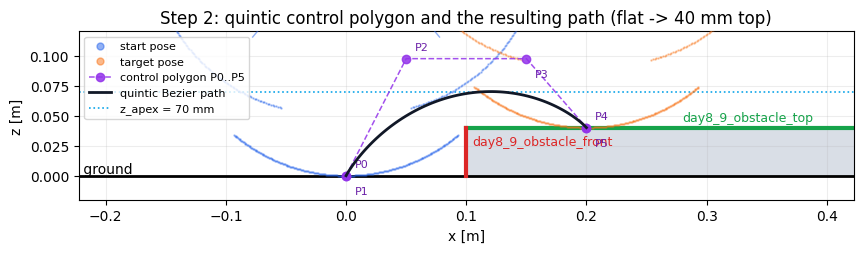

In [15]:
start_scene_c, target_scene_c = day8_9_cases['C flat -> 40 mm top']
path = step2_demo_result.positions_world_xz_m

fig, ax = plt.subplots(figsize=(10, 4.8))
plot_terrain_profile_2d(step2_demo_request.terrain, ax=ax,
                        x_limits_m=scene_x_limits(start_scene_c, target_scene_c))
draw_leg(ax, start_scene_c, '#2563eb', 'start pose', alpha=0.5, linewidth=1.0)
draw_leg(ax, target_scene_c, '#f97316', 'target pose', alpha=0.5, linewidth=1.0)

ax.plot(step2_demo_controls[:, 0], step2_demo_controls[:, 1], '--o', color='#9333ea',
        ms=6, lw=1.1, alpha=0.85, label='control polygon P0..P5', zorder=7)
for index, point in enumerate(step2_demo_controls):
    # P0/P1 and P4/P5 coincide by construction, so stagger their labels.
    offset = (6, 6) if index % 2 == 0 else (6, -13)
    ax.annotate(f'P{index}', point, xytext=offset, textcoords='offset points',
                fontsize=8, color='#6b21a8', zorder=8)
ax.plot(path[:, 0], path[:, 1], '-', color='#111827', lw=2.0, label='quintic Bezier path', zorder=8)
ax.axhline(step2_demo_apex_m, color='#0ea5e9', ls=':', lw=1.2,
           label=f'z_apex = {step2_demo_apex_m * 1e3:.0f} mm')
ax.set_aspect('equal', adjustable='box')
ax.grid(True, alpha=0.22)
ax.legend(fontsize=8, loc='upper left')
ax.set_xlabel('x [m]'); ax.set_ylabel('z [m]')
ax.set_title('Step 2: quintic control polygon and the resulting path (flat -> 40 mm top)')
plt.show()

### 讀圖：為什麼 P2 / P3 比 apex 還高

控制多邊形（紫色虛線）的 P2、P3 明顯高於藍色虛線的 `z_apex`。這不是畫錯：
Bezier 只**通過**兩個端點，對中間控制點是「接近」而不是「經過」。
如果直接把 P2、P3 的高度設成 `z_apex`，實際曲線最高點會低於需求。

所以 P2/P3 的高度是**解出來的**：固定 `z2 = z3 = h` 之後曲線高度對 `h` 是仿射的，
`max_s z(s; h) = z_apex` 可以直接一次求解，不需要疊代。
下一節的表會顯示 requested / achieved apex 的差是 1e-17 等級。

P0、P1 重疊在起點，P4、P5 重疊在落點——這就是端點速度為 0 的來源。

In [16]:
step2_results = {name: generate_swing_path_2d(request)
                 for name, request in day8_9_requests.items()}
step2_report = pd.DataFrame([
    dict(swing_path_endpoint_report(result), case=name)
    for name, result in step2_results.items()
]).set_index('case')

step2_view = step2_report[[
    'start_position_error_mm', 'target_position_error_mm', 't_last_s', 'duration_error_s',
    'liftoff_speed_mps', 'touchdown_speed_mps',
    'requested_apex_z_m', 'achieved_apex_z_m', 'apex_at_s', 'x_monotone',
]]
display(step2_view.T)
print('每個 case 都是同一個 generate_swing_path_2d()，只有 SwingRequest2D 不同。')

case,A flat -> flat,B flat -> 20 mm top,C flat -> 40 mm top,D 40 mm top -> flat,"E flat -> flat, obstacle between"
start_position_error_mm,0.0,0.0,0.0,0.0,0.0
target_position_error_mm,0.0,0.0,0.0,0.0,0.0
t_last_s,0.6,0.6,0.6,0.6,0.6
duration_error_s,0.0,0.0,0.0,0.0,0.0
liftoff_speed_mps,0.0,0.0,0.0,0.0,0.0
touchdown_speed_mps,0.0,0.0,0.0,0.0,0.0
requested_apex_z_m,0.03,0.05,0.07,0.07,0.03
achieved_apex_z_m,0.03,0.05,0.069993,0.069993,0.03
apex_at_s,0.5,0.54,0.57,0.43,0.5
x_monotone,True,True,True,True,True


每個 case 都是同一個 generate_swing_path_2d()，只有 SwingRequest2D 不同。


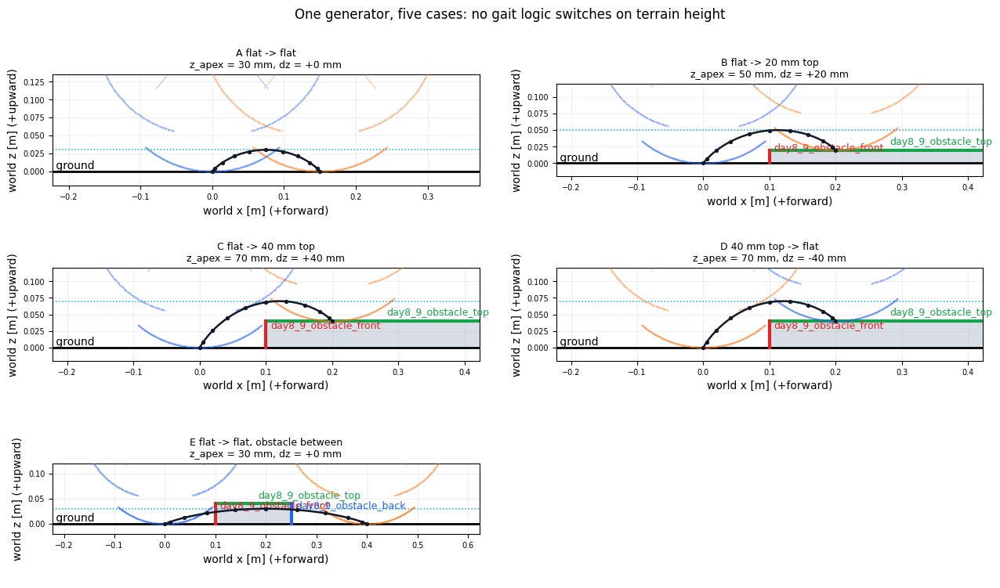

In [17]:
fig, axes = plt.subplots(3, 2, figsize=(13, 7.5))
for ax, (name, (start_scene, target_scene)) in zip(axes.ravel(), day8_9_cases.items()):
    request = day8_9_requests[name]
    result = step2_results[name]
    positions = result.positions_world_xz_m
    plot_terrain_profile_2d(request.terrain, ax=ax,
                            x_limits_m=scene_x_limits(start_scene, target_scene))
    draw_leg(ax, start_scene, '#2563eb', 'start', alpha=0.35, linewidth=0.9)
    draw_leg(ax, target_scene, '#f97316', 'target', alpha=0.35, linewidth=0.9)
    ax.plot(positions[:, 0], positions[:, 1], '-', color='#111827', lw=1.8, zorder=8)
    ax.scatter(positions[::10, 0], positions[::10, 1], s=8, color='#111827', zorder=8)
    apex_m = swing_apex_height_m(request)
    ax.axhline(apex_m, color='#0ea5e9', ls=':', lw=1.1)
    ax.set_aspect('equal', adjustable='box')
    ax.grid(True, alpha=0.2)
    ax.set_title(f'{name}\nz_apex = {apex_m * 1e3:.0f} mm, '
                 f'dz = {request.height_change_m * 1e3:+.0f} mm', fontsize=9)
    ax.tick_params(labelsize=7)
axes.ravel()[-1].axis('off')
fig.suptitle('One generator, five cases: no gait logic switches on terrain height', y=0.995)
fig.tight_layout()
plt.show()

### 讀圖：case E 已經看得出 Step 3 要補什麼

A–D 四個 case 的軌跡都合理，但 **case E（兩端同高、中間有障礙物）的曲線直接穿過障礙物**。

這不是 bug，是 Step 2 的定義使然：

```text
z_apex = max(z_start, z_target) + clearance
```

兩端都在地面，所以 `z_apex = 30 mm`，比 40 mm 的障礙物還低。
規劃 §9 的完整定義多了第三項：

```text
z_apex = max(z_start, z_target, z_obstacle along path) + h_clear
```

那是 Step 3 的工作。這裡刻意先讓它撞，因為「Step 2 的 apex 規則不足以避障」
是一個要被看見的結果，而不是被預先藏起來的細節。

即使 Step 3 把 apex 抬高了，也**不代表 collision-free**：leg-wheel 不是質點，
接觸點過得去不等於整條腿過得去，那是 Step 6 才有辦法回答的事。

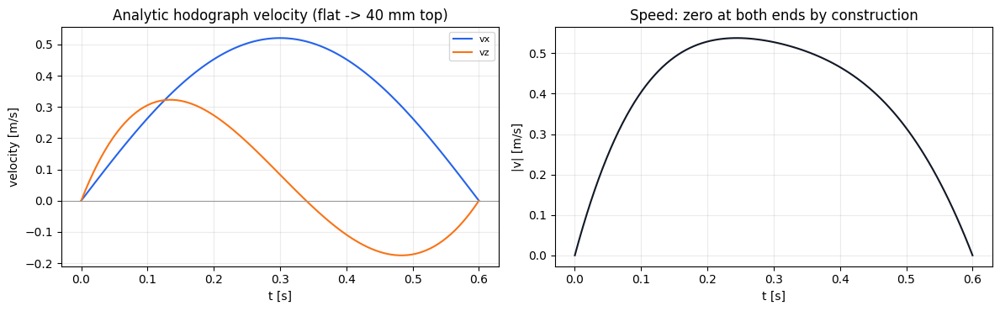

|v(0)| = 0.000e+00 m/s, |v(T)| = 0.000e+00 m/s, max |v| = 0.538 m/s


In [18]:
step2_velocity_result = step2_results['C flat -> 40 mm top']
times = step2_velocity_result.time_s
velocities = step2_velocity_result.velocities_world_xz_mps
speeds = np.linalg.norm(velocities, axis=1)

fig, axes = plt.subplots(1, 2, figsize=(12, 3.8))
axes[0].plot(times, velocities[:, 0], label='vx', color='#2563eb')
axes[0].plot(times, velocities[:, 1], label='vz', color='#f97316')
axes[0].axhline(0.0, color='0.6', lw=0.8)
axes[0].set_xlabel('t [s]'); axes[0].set_ylabel('velocity [m/s]')
axes[0].set_title('Analytic hodograph velocity (flat -> 40 mm top)')
axes[0].legend(fontsize=8); axes[0].grid(True, alpha=0.25)

axes[1].plot(times, speeds, color='#111827')
axes[1].set_xlabel('t [s]'); axes[1].set_ylabel('|v| [m/s]')
axes[1].set_title('Speed: zero at both ends by construction')
axes[1].grid(True, alpha=0.25)
fig.tight_layout()
plt.show()

print(f'|v(0)| = {speeds[0]:.3e} m/s, |v(T)| = {speeds[-1]:.3e} m/s, '
      f'max |v| = {speeds.max():.3f} m/s')

## 10. Alpha 沿著軌跡走：rim transition 需不需要特例

規劃 §3 說同一個 swing primitive 應該涵蓋：

```text
FootRim(alpha_A) -> FootRim(alpha_B)
FootRim(alpha_A) -> LowerRim(alpha_B)
LowerRim(alpha_A) -> FootRim(alpha_B)
```

實作上不需要為 rim transition 寫任何分支。alpha 是**單一全域參數**，
三段輪弧只是把 [−180°, 180°] 切成三段：

```text
upper_tyre_l : [-180, -40]
foot_rim     : [ -40,  40]
upper_tyre_r : [  40, 180]
```

所以 `alpha(s)` 從起點插值到終點時，rim 身分是**推導出來的**（`rim_for_alpha_rad()`），
不是另外排程的。下面用 Day 6–7 真實的 roll-end（right rim, alpha ≈ 94.8°）
swing 到障礙物頂面上的一個 foot rim 接觸點。

In [19]:
day6_7_obstacle = day8_9_roll_end_scene.terrain.obstacle
step2_transition_target_scene = build_leg_on_surface_scene_2d(
    day8_9_theta, day8_9_beta, 0.35, day6_7_obstacle.height_m,
    obstacle_x_start_m=day6_7_obstacle.x_min_m,
    obstacle_width_m=day6_7_obstacle.width_m,
    obstacle_height_m=day6_7_obstacle.height_m,
    obstacle_id=day6_7_obstacle.obstacle_id,
    arc_samples=241,
)
step2_transition_request = SwingRequest2D(
    start=day8_9_roll_end_start,
    target=swing_target_from_scene_2d(step2_transition_target_scene, clearance_m=0.03),
    terrain=day8_9_roll_end_scene.terrain,
    hip_trajectory=HipTrajectory2D(day8_9_roll_end_scene.hip_pose,
                                   step2_transition_target_scene.hip_pose),
    swing_duration_s=0.6,
    sample_count=101,
)
print('validate:', validate_swing_request_2d(step2_transition_request))

step2_transition_result = generate_swing_path_2d(step2_transition_request)
step2_transition_report = swing_path_endpoint_report(step2_transition_result)
display(pd.DataFrame([step2_transition_report]).T.rename(columns={0: 'value'}))

validate: ()


,value
start_position_error_mm,0.0
target_position_error_mm,0.0
t_first_s,0.0
t_last_s,0.6
duration_error_s,0.0
liftoff_speed_mps,0.0
touchdown_speed_mps,0.0
requested_apex_z_m,0.13
achieved_apex_z_m,0.13
apex_at_s,0.5


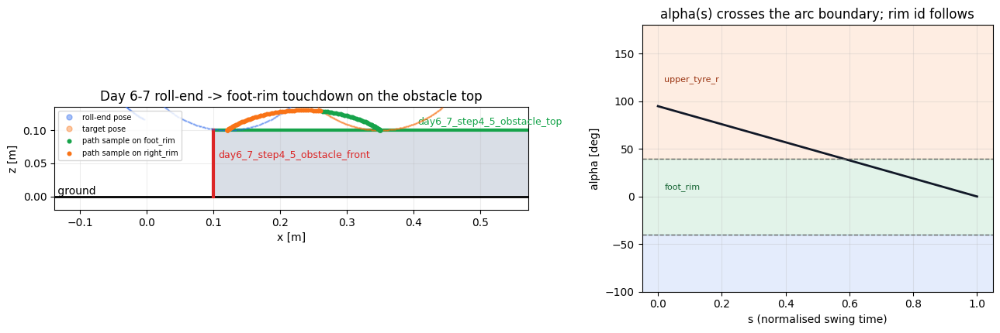

rim handover at sample 58 (s = 0.58, alpha = 39.8 deg): right_rim -> foot_rim


In [20]:
positions = step2_transition_result.positions_world_xz_m
alphas_deg = np.rad2deg([sample.alpha_rad for sample in step2_transition_result.samples])
rims = np.array([sample.rim.value for sample in step2_transition_result.samples])
s_values = step2_transition_result.time_s / step2_transition_request.swing_duration_s
rim_colors = {'foot_rim': '#16a34a', 'left_rim': '#2563eb', 'right_rim': '#f97316'}

fig, axes = plt.subplots(1, 2, figsize=(13, 4.4),
                         gridspec_kw={'width_ratios': [1.35, 1.0]})

plot_terrain_profile_2d(step2_transition_request.terrain, ax=axes[0],
                        x_limits_m=scene_x_limits(day8_9_roll_end_scene,
                                                  step2_transition_target_scene))
draw_leg(axes[0], day8_9_roll_end_scene, '#2563eb', 'roll-end pose', alpha=0.4, linewidth=0.9)
draw_leg(axes[0], step2_transition_target_scene, '#f97316', 'target pose', alpha=0.4, linewidth=0.9)
for rim_name, color in rim_colors.items():
    mask = rims == rim_name
    if mask.any():
        axes[0].scatter(positions[mask, 0], positions[mask, 1], s=11, color=color,
                        label=f'path sample on {rim_name}', zorder=8)
axes[0].set_aspect('equal', adjustable='box')
axes[0].grid(True, alpha=0.22)
axes[0].legend(fontsize=7, loc='upper left')
axes[0].set_xlabel('x [m]'); axes[0].set_ylabel('z [m]')
axes[0].set_title('Day 6-7 roll-end -> foot-rim touchdown on the obstacle top')

axes[1].axhspan(40, 180, color='#f97316', alpha=0.12)
axes[1].axhspan(-40, 40, color='#16a34a', alpha=0.12)
axes[1].axhspan(-180, -40, color='#2563eb', alpha=0.12)
axes[1].plot(s_values, alphas_deg, color='#111827', lw=2.0)
axes[1].axhline(40, color='0.4', ls='--', lw=1.0)
axes[1].axhline(-40, color='0.4', ls='--', lw=1.0)
axes[1].text(0.02, 120, 'upper_tyre_r', fontsize=8, color='#9a3412')
axes[1].text(0.02, 8, 'foot_rim', fontsize=8, color='#166534')
axes[1].set_ylim(-100, 180)
axes[1].set_xlabel('s (normalised swing time)'); axes[1].set_ylabel('alpha [deg]')
axes[1].set_title('alpha(s) crosses the arc boundary; rim id follows')
axes[1].grid(True, alpha=0.25)
fig.tight_layout()
plt.show()

handover = int(np.argmax(rims != rims[0]))
print(f'rim handover at sample {handover} (s = {s_values[handover]:.2f}, '
      f'alpha = {alphas_deg[handover]:.1f} deg): '
      f'{rims[0]} -> {rims[handover]}')

### 這裡有一個必須講清楚的語意選擇

傳統 walk swing 追蹤的是**一個材料點**（腳尖），整段擺動 alpha 不變。
但 contact-state-to-contact-state 的 swing，起點與落點如果 rim/alpha 不同，
就**不存在**一個同時滿足兩端的材料點。

這裡採用規劃 §10 的寫法 `(p_i, rim_i, alpha_i) -> q_i`：alpha 隨 s 從起點走到落點，
也就是「每個時刻要求擺到接觸位置的那個輪上點，是連續變化的」。
好處是 `P0 = start contact`、`P5 = target contact` 兩個端點條件同時成立，
而且 rim transition 不必特判。

代價是這條 Cartesian 曲線**不是**任何一個固定材料點的軌跡，
所以 Step 6 做 collision check 時一定要用完整 leg geometry，不能只檢查這條線。
（順帶一提：舊版 3D runtime planner 走的是另一條路——整段固定 `alpha_td`，
因為它只需要落點正確，不需要指定起點的接觸狀態。）

> **後記（Step 7 才發現，寫在這裡以免誤導）**
>
> 上面那句「rim transition 不需要特判」只對**參數**成立，對**幾何**不成立。
> α 是連續參數，但它索引的輪面不是連續的：三段輪弧之間有實體缺口，
> 跨過 α = ±40° 時接觸點會瞬移 **45 mm**，跨過 ±180° 更是 **162 mm**（§20 有量測）。
>
> 所以這一格示範的 `right_rim(94.8°) → foot_rim(0°)` swing，實際上**做不出來**：
> 把它送進 Step 5，會在 sample 58——正是 rim 交接那一格——以 24.8° 的關節跳躍被判
> `JOINT_DISCONTINUITY`。§20 有完整數據。
>
> 真正的結論應該是：**同一段輪弧內的 α 掃描不需要特判；跨 rim 是「重新抓握」，
> 不是平滑的 rim transition。** Day 6–7 的 rolling 那邊本來就有 `max_seam_bridge_m`
> 這個 seam guard，是同一件事的另一面。

In [21]:
day8_9_step2_frames_csv = day8_9_dir / 'day8_9_step2_flat_to_40mm_frames.csv'
day8_9_step2_summary_csv = day8_9_dir / 'day8_9_step2_flat_to_40mm_summary.csv'
day8_9_step2_report_csv = day8_9_dir / 'day8_9_step2_endpoint_report.csv'

frames_path, summary_path = write_swing_result_csv(
    step2_results['C flat -> 40 mm top'],
    day8_9_step2_frames_csv, day8_9_step2_summary_csv,
)
step2_report.to_csv(day8_9_step2_report_csv)
for path in (frames_path, summary_path, day8_9_step2_report_csv):
    print(f'{path.relative_to(project_root)}  ({path.stat().st_size} bytes)')

display(pd.DataFrame(swing_result_frame_rows(step2_results['C flat -> 40 mm top'])).head(4))
print('joint / collision 欄位仍然是 None——Step 2 只填了 Cartesian 的部分。')

hybrid_note/notes/day8-9/day8_9_step2_flat_to_40mm_frames.csv  (13215 bytes)
hybrid_note/notes/day8-9/day8_9_step2_flat_to_40mm_summary.csv  (933 bytes)
hybrid_note/notes/day8-9/day8_9_step2_endpoint_report.csv  (866 bytes)


,index,time_s,x_m,z_m,vx_mps,vz_mps,speed_mps,rim,alpha_deg,theta_deg,beta_deg,gamma_deg,ik_converged,ik_residual_mm,joint_step_deg,joint_limits_ok,collision_free,terrain_clearance_mm
0,0,0.000,-2.787644e-17,1.000000e-09,0.000000,0.000000,0.000000,foot_rim,0.0,None,None,None,None,None,None,None,None,None
1,1,0.006,4.999502e-05,9.545865e-05,0.016663,0.031498,0.035635,foot_rim,0.0,None,None,None,None,None,None,None,None,None
2,2,0.012,1.999206e-04,3.741805e-04,0.033307,0.061096,0.069585,foot_rim,0.0,None,None,None,None,None,None,None,None,None
3,3,0.018,4.495999e-04,8.248995e-04,0.049911,0.088839,0.101899,foot_rim,0.0,None,None,None,None,None,None,None,None,None


joint / collision 欄位仍然是 None——Step 2 只填了 Cartesian 的部分。


## 11. Step 2 完成標準對照

| 規劃要求 | 狀態 | 證據 |
| --- | --- | --- |
| 輸入 start / target / clearance / duration / sample count | 完成 | 全部來自 `SwingRequest2D`，generator 沒有額外必填參數 |
| 輸出 time / position / velocity | 完成 | §9 report 表、速度圖 |
| `P0 = start`、`P5 = target` | 完成 | endpoint error = 0.000 mm（五個 case） |
| apex 由 start / target + clearance 決定 | 完成 | requested vs achieved apex 差 ~1e-17 m |
| start / end velocity 先接近 0 | 完成 | `|v(0)| = |v(T)| = 0`（解析值，非差分） |
| 不做 optimization | 完成 | 沒有引入 nlopt；控制點是幾何構造 |
| 0→0 / 0→20 / 0→40 / 40→0 mm 使用同一個 generator | 完成 | §9 五個 case 同一個函式呼叫 |

唯一沒過的是 case E——它的軌跡穿過障礙物。這正是 Step 3 要處理的。

## 12. Step 3 — Terrain-aware apex

Step 2 的 apex 規則只看兩端：

```text
z_apex = max(z_start, z_target) + clearance
```

規劃 §9 的完整規則多了第三項：

```text
z_apex = max(z_start, z_target, z_obstacle along path) + h_clear
```

`along path` 定義成 **start–target 之間的 x corridor**：只要障礙物頂面的 x 範圍與 corridor 有重疊，
它的高度就要參與 `max`。兩個實作細節：

**只看 obstacle top，不看垂直面。**
垂直面的最高點就是它所屬的 top，所以把面也算進去不可能改變 `max` 的結果，只會讓程式碼看起來比較忙。

**記錄是誰決定了 apex。**
同一個 apex 數字可能來自三種完全不同的情況——落點高、起點高、或中間有障礙物——
只有第三種是 Step 3 新增的能力。所以 `ApexConstruction2D` 會回報 `governing_source`，
而不是只回傳一個高度。

In [22]:
step3_constructions = {name: terrain_aware_apex_2d(request)
                       for name, request in day8_9_requests.items()}
step3_apex_table = pd.DataFrame([
    dict(construction.as_dict(),
         case=name,
         step2_apex_mm=swing_apex_height_m(day8_9_requests[name]) * 1e3)
    for name, construction in step3_constructions.items()
]).set_index('case')

display(step3_apex_table[[
    'z_start_mm', 'z_target_mm', 'corridor_obstacle_tops', 'governing_source',
    'base_height_mm', 'clearance_mm', 'step2_apex_mm', 'apex_z_mm', 'obstacle_governs',
]].T)

case,A flat -> flat,B flat -> 20 mm top,C flat -> 40 mm top,D 40 mm top -> flat,"E flat -> flat, obstacle between"
z_start_mm,0.000001,0.000001,0.000001,40.000001,0.000001
z_target_mm,0.000001,20.000001,40.000001,0.000001,0.000001
corridor_obstacle_tops,,day8_9_obstacle_top=20mm,day8_9_obstacle_top=40mm,day8_9_obstacle_top=40mm,day8_9_obstacle_top=40mm
governing_source,start,target,target,start,day8_9_obstacle_top
base_height_mm,0.000001,20.000001,40.000001,40.000001,40.0
clearance_mm,30.0,30.0,30.0,30.0,30.0
step2_apex_mm,30.000001,50.000001,70.000001,70.000001,30.000001
apex_z_mm,30.000001,50.000001,70.000001,70.000001,70.0
obstacle_governs,False,False,False,False,True


### 讀表

A–D 四個 case 的 `governing_source` 都是 `start` 或 `target`，`step2_apex_mm == apex_z_mm`——
Step 3 對它們**沒有任何影響**。這是刻意的：terrain-aware 只在真的需要時才改變結果。

只有 case E 的 `governing_source` 是 `test`/`day8_9_obstacle_top`，apex 從 30 mm 抬到 70 mm。

值得注意 case B / D：障礙物頂面確實落在 corridor 內（`corridor_obstacle_tops` 有值），
但因為那個高度就是落點或起點自己的高度，`max` 不會被它改變。
換句話說「corridor 內有障礙物」不等於「apex 要抬高」。

In [23]:
step3_results = {name: generate_terrain_aware_swing_path_2d(request)
                 for name, request in day8_9_requests.items()}


def clearance_row(name):
    step2 = path_point_clearance_report_2d(step2_results[name])
    step3 = path_point_clearance_report_2d(step3_results[name])
    return {
        'case': name,
        'step2_penetrating': step2['penetrating_sample_count'],
        'step3_penetrating': step3['penetrating_sample_count'],
        'step2_min_obstacle_clearance_mm': round(step2['minimum_obstacle_clearance_mm'], 2),
        'step3_min_obstacle_clearance_mm': round(step3['minimum_obstacle_clearance_mm'], 2),
        'step3_worst_obstacle_x_m': round(step3['worst_obstacle_sample_x_m'], 3),
    }


step3_clearance_table = pd.DataFrame(
    [clearance_row(name) for name in day8_9_requests]
).set_index('case')
display(step3_clearance_table)
print('case A 的 obstacle clearance 是 inf，因為那個 terrain 根本沒有障礙物表面。')
print('注意：這整張表是「接觸點對地形」的量測，不是整條腿的 collision check。')

,step2_penetrating,step3_penetrating,step2_min_obstacle_clearance_mm,step3_min_obstacle_clearance_mm,step3_worst_obstacle_x_m
case,,,,,
A flat -> flat,0,0,inf,inf,-0.000
B flat -> 20 mm top,0,0,0.00,0.0,0.200
C flat -> 40 mm top,0,0,0.00,0.0,0.200
D 40 mm top -> flat,0,0,0.00,0.0,0.200
"E flat -> flat, obstacle between",25,0,-149.49,16.4,0.104


case A 的 obstacle clearance 是 inf，因為那個 terrain 根本沒有障礙物表面。
注意：這整張表是「接觸點對地形」的量測，不是整條腿的 collision check。


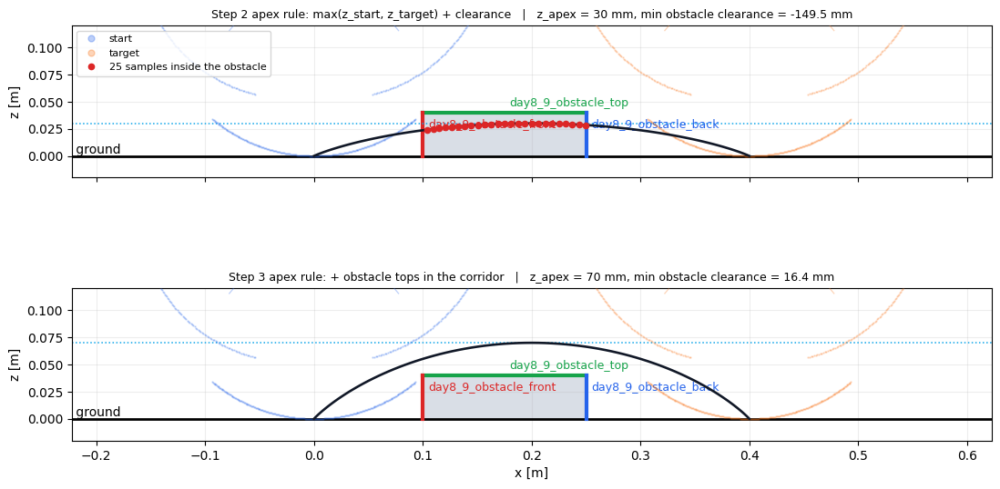

In [24]:
case_e_name = 'E flat -> flat, obstacle between'
case_e_request = day8_9_requests[case_e_name]
case_e_start_scene, case_e_target_scene = day8_9_cases[case_e_name]
case_e_limits = scene_x_limits(case_e_start_scene, case_e_target_scene)

fig, axes = plt.subplots(2, 1, figsize=(11, 6.6), sharex=True)
panels = (
    ('Step 2 apex rule: max(z_start, z_target) + clearance', step2_results[case_e_name]),
    ('Step 3 apex rule: + obstacle tops in the corridor', step3_results[case_e_name]),
)
for ax, (title, result) in zip(axes, panels):
    report = path_point_clearance_report_2d(result)
    clearance_m, _ = path_point_clearance_samples_2d(result)
    positions = result.positions_world_xz_m
    plot_terrain_profile_2d(case_e_request.terrain, ax=ax, x_limits_m=case_e_limits)
    draw_leg(ax, case_e_start_scene, '#2563eb', 'start', alpha=0.3, linewidth=0.9)
    draw_leg(ax, case_e_target_scene, '#f97316', 'target', alpha=0.3, linewidth=0.9)

    ax.plot(positions[:, 0], positions[:, 1], '-', color='#111827', lw=1.9, zorder=8)
    apex_m = float(np.max(positions[:, 1]))
    ax.axhline(apex_m, color='#0ea5e9', ls=':', lw=1.1)
    buried = clearance_m < 0.0
    if buried.any():
        ax.plot(positions[buried, 0], positions[buried, 1], 'o', ms=4.5, color='#dc2626',
                zorder=9, label=f'{int(buried.sum())} samples inside the obstacle')
        ax.legend(fontsize=8, loc='upper left')
    ax.set_aspect('equal', adjustable='box')
    ax.grid(True, alpha=0.22)
    ax.set_ylabel('z [m]')
    ax.set_title(f"{title}   |   z_apex = {apex_m * 1e3:.0f} mm, "
                 f"min obstacle clearance = {report['minimum_obstacle_clearance_mm']:.1f} mm",
                 fontsize=9)
axes[0].set_xlabel('')
axes[-1].set_xlabel('x [m]')
fig.tight_layout()
plt.show()

### 讀圖：抬高了，但「抬高」不等於「過得去」

上圖 25 個紅點是實際落在障礙物**內部**的軌跡取樣點；下圖 0 個。就 Step 3 的完成標準而言，
「中間存在 obstacle 時 Bezier path 會自動提高」已經成立。

但表裡有一個數字必須講清楚：

```text
requested clearance          = 30 mm
min obstacle clearance (E)   = 16.4 mm   at x = 0.10 m
```

`clearance = 30 mm` 只保證**最高點**離最高的障礙物頂面 30 mm。
軌跡在障礙物的前緣還在爬升，所以那裡的實際餘裕只有一半。
apex 是一個單點條件，不是整條 corridor 的下界——這是這個 heuristic 的固有限制，不是參數沒調好。

而且以上全部都是**接觸點**對地形的量測。leg-wheel 不是質點：
接觸點離障礙物 16.4 mm，不代表輪緣、連桿或另一側的 rim 也離得開。
規劃 §9 講得很直接——`z_apex` 只負責建立初始 swing curve，不能取代完整 collision check。
那要等 Step 6 用 Day 3–5 的 checker 沿整條軌跡重建完整腿部幾何才有答案。

In [25]:
# corridor 的邊界是硬的：障礙物差一點點沒進來，apex 就完全不會理它。
# corridor_margin_m 讓邊界可以放寬，但那同樣只是 heuristic，不是 collision check。
short_hop = replace(
    case_e_request,
    start=replace(case_e_request.start, contact_point_world_xz_m=[0.30, 1e-9]),
)
for margin_m in (0.0, 0.10):
    surfaces = corridor_obstacle_top_surfaces_2d(
        short_hop.terrain, 0.30, 0.40, margin_m=margin_m)
    construction = terrain_aware_apex_2d(short_hop, corridor_margin_m=margin_m)
    print(f'corridor [0.30, 0.40] m, margin = {margin_m * 1e3:>3.0f} mm -> '
          f'tops {[item.surface_id for item in surfaces]}, '
          f'apex {construction.apex_height_m * 1e3:.0f} mm '
          f'(governed by {construction.governing_source})')

corridor [0.30, 0.40] m, margin =   0 mm -> tops [], apex 30 mm (governed by start)
corridor [0.30, 0.40] m, margin = 100 mm -> tops ['day8_9_obstacle_top'], apex 70 mm (governed by day8_9_obstacle_top)


In [26]:
day8_9_step3_frames_csv = day8_9_dir / 'day8_9_step3_case_e_frames.csv'
day8_9_step3_summary_csv = day8_9_dir / 'day8_9_step3_case_e_summary.csv'
day8_9_step3_apex_csv = day8_9_dir / 'day8_9_step3_apex_construction.csv'

frames_path, summary_path = write_swing_result_csv(
    step3_results[case_e_name], day8_9_step3_frames_csv, day8_9_step3_summary_csv
)
step3_apex_table.join(step3_clearance_table).to_csv(day8_9_step3_apex_csv)
for path in (frames_path, summary_path, day8_9_step3_apex_csv):
    print(f'{path.relative_to(project_root)}  ({path.stat().st_size} bytes)')

hybrid_note/notes/day8-9/day8_9_step3_case_e_frames.csv  (13030 bytes)
hybrid_note/notes/day8-9/day8_9_step3_case_e_summary.csv  (891 bytes)
hybrid_note/notes/day8-9/day8_9_step3_apex_construction.csv  (1379 bytes)


## 13. Step 3 完成標準對照

| 規劃要求 | 狀態 | 證據 |
| --- | --- | --- |
| 找出 start–target corridor 內 relevant obstacle top | 完成 | §12 `corridor_obstacle_tops` 欄；corridor 外的障礙物不列入 |
| `z_apex = max(z_s, z_t, z_obs) + h_clear` | 完成 | case E：base 40 mm + clearance 30 mm = 70 mm |
| 中間有 obstacle 時 path 自動提高 | 完成 | case E 穿透取樣點 25 → 0 |
| 沒有 obstacle 影響時不改變 Step 2 結果 | 完成 | A–D 的 `step2_apex_mm == apex_z_mm` |
| 明確標示這只是 construction heuristic | 完成 | 最小障礙物餘裕 16.4 mm < 要求的 30 mm |

到這裡為止，軌跡都還只是世界座標裡的一條線。Step 4 開始問「腿做不做得到」。

## 14. Step 4 — Generalized rim-point IK

Step 4 要建立的介面是：

```text
(contact position, rim, alpha)  ->  (theta, beta)
```

跟一般的 foot-tip IK 不同——問的不是「把腳放到某處」，而是
**「把輪子上的這一點，放到世界上的那個位置」**。

在寫求解器之前，有一件事必須先確認，否則後面每一步都建在錯的假設上：
**2D 管線的 alpha 和 kinematics 模型的 alpha 是不是同一個東西。**

### 先講結論：這裡有兩套 rim 幾何，差 1.2 mm

repo 裡同時存在兩個 rim 參數化：

| | 半徑 | 誰在用 |
| --- | --- | --- |
| `LegModel.rim_point(alpha_deg, w)` | 三個 rim 都是 `WHEEL_RADIUS_OUTER = 0.145 m` | 物理模型、3D runtime planner |
| `PlotLeg.leg_shape` 的外弧 | foot rim 0.145 m，**兩個 upper tyre 0.1438 m** | `sample_contact_geometry_points` → Day 3–7 整個 contact / collision 管線 |

差的 1.2 mm 來自 `LegShape._update_geometry` 裡的 `c = 0.0012`——一個**繪圖用的 clearance**，
讓 upper tyre 的外弧不要和 upper rim 結構重疊。它從繪圖層洩漏進了接觸幾何。

**角度慣例兩邊完全一致**（foot rim 的 alpha ∈ [−40°, 40°] 繞 `G − O_r` 方向，
upper tyre 接上去到 ±180°），只有 upper rim 的半徑差這 1.2 mm，而且是常數。

**這裡選擇用繪圖弧（0.1438 m）建 FK/IK**，理由是 Step 6–7 會用 `query_contact` 對著
*那套幾何* 驗證 touchdown。如果 IK 打的是 0.145 m 的物理模型，upper rim 落地時就會留下
1.2 mm 的縫——比 contact tolerance 的 1 mm 還大——Step 7 會否決掉它自己的 IK 認為完全精確的 swing。

這是一個需要你決定的問題：正確的長期修法可能是把 `c` 從接觸幾何裡拿掉，
但那會改變 Day 3–7 已經算出來的所有 rolling feasibility 結果，遠超出 Step 4 的範圍。

In [27]:
ik_poses_deg = [(17.0, 0.0), (60.0, -37.0), (60.0, 0.0), (110.0, 95.0), (160.0, -5.0)]
rim_by_legacy_surface = {
    'foot_rim': RimId.FOOT, 'upper_tyre_l': RimId.LEFT, 'upper_tyre_r': RimId.RIGHT,
}

alpha_convention_rows = []
for theta_deg, beta_deg in ik_poses_deg:
    theta_rad, beta_rad = np.deg2rad(theta_deg), np.deg2rad(beta_deg)
    records = [r for r in sample_contact_geometry_points(theta_rad, beta_rad, arc_samples=241)
               if r['geometry_type'] == 'rim_arc']
    counts = {}
    for record in records:
        surface = record['surface_name']
        counts[surface] = max(counts.get(surface, 0), record['arc_sample_index'] + 1)
    worst = {}
    for record in records:
        surface = record['surface_name']
        alpha_rad = legacy_rim_sample_alpha_rad(surface, record['arc_sample_index'], counts[surface])
        point = rim_contact_point_hip_xz_m(theta_rad, beta_rad,
                                           rim_by_legacy_surface[surface], alpha_rad)
        error_m = float(np.linalg.norm(point - np.array([record['x_m'], record['y_m']])))
        worst[surface] = max(worst.get(surface, 0.0), error_m)
    alpha_convention_rows.append({
        'theta_deg': theta_deg, 'beta_deg': beta_deg,
        **{f'max_err_{k}_m': v for k, v in worst.items()},
    })

display(pd.DataFrame(alpha_convention_rows).set_index(['theta_deg', 'beta_deg']))
print('Step 4 FK 與既有 sampler 在所有姿態、所有 rim 上都是同一個點（1e-16 等級 = 浮點誤差）。')

max_err_foot_rim_m  max_err_upper_tyre_l_m  \
theta_deg beta_deg                                               
17.0       0.0            8.092071e-17            1.387779e-16   
60.0      -37.0           1.010318e-16            1.777224e-16   
           0.0            7.473417e-17            2.665836e-16   
110.0      95.0           1.570092e-16            1.583666e-16   
160.0     -5.0            1.494683e-16            1.387779e-16   

                    max_err_upper_tyre_r_m  
theta_deg beta_deg                          
17.0       0.0                1.083890e-16  
60.0      -37.0               1.010318e-16  
           0.0                1.373831e-16  
110.0      95.0               1.551584e-16  
160.0     -5.0                1.273812e-16

Step 4 FK 與既有 sampler 在所有姿態、所有 rim 上都是同一個點（1e-16 等級 = 浮點誤差）。


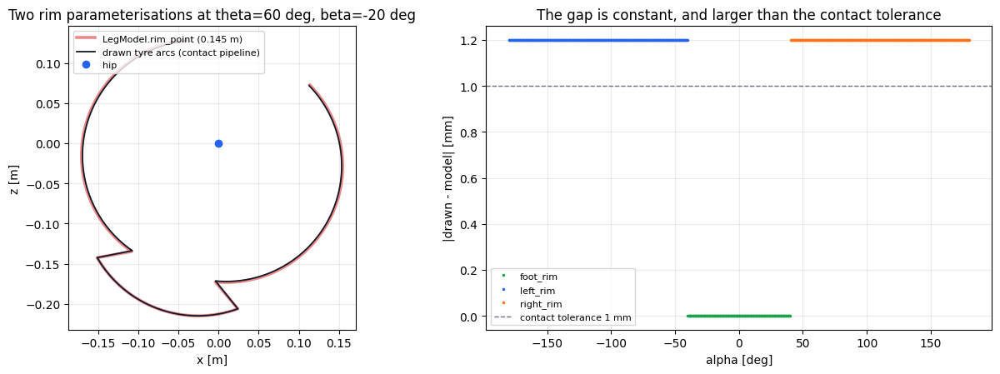

In [28]:
ik_demo_theta_rad, ik_demo_beta_rad = np.deg2rad(60.0), np.deg2rad(-20.0)
alpha_grid_rad = np.deg2rad(np.linspace(-179.9, 179.9, 721))

drawn = np.array([
    rim_contact_point_hip_xz_m(ik_demo_theta_rad, ik_demo_beta_rad,
                               rim_for_alpha_rad(a), a)
    for a in alpha_grid_rad
])
model_leg = PlotLeg()
model_leg.forward(ik_demo_theta_rad, ik_demo_beta_rad, vector=True)
model = np.array([
    np.asarray(model_leg.rim_point(float(np.rad2deg(a)), 0.0), dtype=float).ravel()[:2]
    for a in alpha_grid_rad
])
gap_mm = np.linalg.norm(drawn - model, axis=1) * 1e3

fig, axes = plt.subplots(1, 2, figsize=(13, 4.6), gridspec_kw={'width_ratios': [1.1, 1.0]})
axes[0].plot(model[:, 0], model[:, 1], '-', color='#dc2626', lw=2.6, alpha=0.55,
             label='LegModel.rim_point (0.145 m)')
axes[0].plot(drawn[:, 0], drawn[:, 1], '-', color='#111827', lw=1.3,
             label='drawn tyre arcs (contact pipeline)')
axes[0].plot(0.0, 0.0, 'o', ms=6, color='#2563eb', label='hip')
axes[0].set_aspect('equal', adjustable='box')
axes[0].grid(True, alpha=0.25)
axes[0].legend(fontsize=8, loc='upper left')
axes[0].set_xlabel('x [m]'); axes[0].set_ylabel('z [m]')
axes[0].set_title('Two rim parameterisations at theta=60 deg, beta=-20 deg')

for rim, color in (('foot_rim', '#16a34a'), ('left_rim', '#2563eb'), ('right_rim', '#f97316')):
    mask = np.array([rim_for_alpha_rad(a).value == rim for a in alpha_grid_rad])
    axes[1].plot(np.rad2deg(alpha_grid_rad[mask]), gap_mm[mask], '.', ms=3, color=color, label=rim)
axes[1].axhline(1.0, color='#6b7280', ls='--', lw=1.0, label='contact tolerance 1 mm')
axes[1].set_xlabel('alpha [deg]'); axes[1].set_ylabel('|drawn - model| [mm]')
axes[1].set_title('The gap is constant, and larger than the contact tolerance')
axes[1].legend(fontsize=8); axes[1].grid(True, alpha=0.25)
fig.tight_layout()
plt.show()

### 讀圖

左圖兩條線幾乎重合，因為 1.2 mm 在整條腿的尺度下看不出來——這正是它危險的地方。
右圖把差值畫出來：foot rim 恆為 0，兩個 upper tyre 恆為 1.2 mm，跨過了 1 mm 的 contact tolerance。

這種誤差不會讓任何一步「壞掉」，只會讓 Step 7 的 touchdown 檢查在 upper rim 落地時
莫名其妙地失敗——而且看起來像是 planner 的問題，不像是幾何定義的問題。
所以這裡把它量出來留在紀錄裡，而不是讓它被吸收進殘差。

### IK 求解器的三個設計決定

**(a) beta 是繞 hip 的純旋轉，所以 Jacobian 的 beta 那一欄是解析的。**
這在既有模型上驗證過（`FK(theta, beta) = R(beta) · FK(theta, 0)`，誤差 9e-17），
所以只有 theta 那一欄需要數值微分，而且 theta 相關的幾何可以被快取。

**(b) 不默默 clamp。**
`LegModel.forward` 內部會把 theta 直接 `np.clip` 到 [17°, 160°]——也就是說超出範圍的 FK
回傳的是**別的姿態**的結果。所以迭代刻意留在範圍內，並且用 `theta_at_limit` 回報卡在邊界；
不可達的目標會以「未收斂 + 真實殘差」回傳，而不是一個被悄悄夾住的「答案」。
`converged` 只講殘差，`joint_limits_ok` 分開講，兩者都 True 才是 `usable`。

**(c) trust region + backtracking line search。**
沒有步長上限時，接近奇異的 Jacobian 會把 beta 甩掉大半圈、落到另一個解支——
對 swing 來說那代表關節軌跡在半空中瞬移。

In [29]:
ik_roundtrip_rows = []
for theta_deg, beta_deg in ik_poses_deg:
    theta_rad, beta_rad = np.deg2rad(theta_deg), np.deg2rad(beta_deg)
    for rim in (RimId.FOOT, RimId.LEFT, RimId.RIGHT):
        alpha_min_rad, alpha_max_rad = rim_alpha_limits_rad(rim)
        for fraction in (0.1, 0.5, 0.9):
            alpha_rad = alpha_min_rad + fraction * (alpha_max_rad - alpha_min_rad)
            hip = HipPose2D([0.13, 0.27])
            target = rim_contact_point_world_xz_m(theta_rad, beta_rad, rim, alpha_rad, hip)
            solution = solve_contact_ik_2d(
                target, rim, alpha_rad, hip,
                np.array([theta_rad + np.deg2rad(3.0), beta_rad - np.deg2rad(3.0)]),
            )
            beta_error_rad = (solution.beta_rad - beta_rad + np.pi) % (2 * np.pi) - np.pi
            ik_roundtrip_rows.append({
                'rim': rim.value,
                'theta_deg': theta_deg, 'beta_deg': beta_deg,
                'alpha_deg': round(float(np.rad2deg(alpha_rad)), 1),
                'converged': solution.converged,
                'residual_um': solution.residual_m * 1e6,
                'theta_err_deg': abs(float(np.rad2deg(solution.theta_rad)) - theta_deg),
                'beta_err_deg': abs(float(np.rad2deg(beta_error_rad))),
                'iterations': solution.iterations,
            })

ik_roundtrip = pd.DataFrame(ik_roundtrip_rows)
display(ik_roundtrip.groupby('rim').agg(
    cases=('converged', 'size'),
    converged=('converged', 'sum'),
    max_residual_um=('residual_um', 'max'),
    max_theta_err_deg=('theta_err_deg', 'max'),
    max_beta_err_deg=('beta_err_deg', 'max'),
    max_iterations=('iterations', 'max'),
))
print(f"全部 {len(ik_roundtrip)} 個 case：converged {int(ik_roundtrip['converged'].sum())}，"
      f"最大殘差 {ik_roundtrip['residual_um'].max():.2f} um "
      f"(tolerance 10 um)")

,cases,converged,max_residual_um,max_theta_err_deg,max_beta_err_deg,max_iterations
rim,,,,,,
foot_rim,15,15,9.448421,0.011818,0.000183,3
left_rim,15,15,5.045112,0.168080,0.151283,4
right_rim,15,15,9.492516,0.256653,0.231016,6


全部 45 個 case：converged 45，最大殘差 9.49 um (tolerance 10 um)


In [30]:
ik_perturbation_rows = []
ik_sweep_hip = HipPose2D([0.13, 0.27])
for perturbation_deg in (1.0, 3.0, 6.0, 12.0, 25.0):
    total = converged = 0
    for theta_deg, beta_deg in [(20.0, -80.0), (25.0, 0.0), (60.0, -37.0),
                                (110.0, 95.0), (150.0, 45.0)]:
        theta_rad, beta_rad = np.deg2rad(theta_deg), np.deg2rad(beta_deg)
        for rim in (RimId.FOOT, RimId.LEFT, RimId.RIGHT):
            alpha_min_rad, alpha_max_rad = rim_alpha_limits_rad(rim)
            for fraction in (0.05, 0.35, 0.65, 0.95):
                alpha_rad = alpha_min_rad + fraction * (alpha_max_rad - alpha_min_rad)
                target = rim_contact_point_world_xz_m(
                    theta_rad, beta_rad, rim, alpha_rad, ik_sweep_hip)
                solution = solve_contact_ik_2d(
                    target, rim, alpha_rad, ik_sweep_hip,
                    np.array([theta_rad + np.deg2rad(perturbation_deg),
                              beta_rad - np.deg2rad(perturbation_deg)]),
                )
                total += 1
                converged += int(solution.converged)
    ik_perturbation_rows.append({
        'guess_perturbation_deg': perturbation_deg,
        'cases': total, 'converged': converged,
        'converged_pct': round(100.0 * converged / total, 1),
    })

display(pd.DataFrame(ik_perturbation_rows).set_index('guess_perturbation_deg'))
print('這就是規劃 §10 要求「用前一個 sample 的解當下一個初始猜測」的實測理由：')
print('相鄰 sample 的姿態差遠小於 1 度，落在 100% 收斂的區間裡。')

,cases,converged,converged_pct
guess_perturbation_deg,,,
1.0,60,60,100.0
3.0,60,60,100.0
6.0,60,58,96.7
12.0,60,58,96.7
25.0,60,56,93.3


這就是規劃 §10 要求「用前一個 sample 的解當下一個初始猜測」的實測理由：
相鄰 sample 的姿態差遠小於 1 度，落在 100% 收斂的區間裡。


In [31]:
unreachable_hip = HipPose2D([0.13, 0.27])
unreachable_alpha_rad = 0.0
unreachable_target = unreachable_hip.position_world_xz_m + np.array([1.5, 0.0])
unreachable = solve_contact_ik_2d(
    unreachable_target, RimId.FOOT, unreachable_alpha_rad, unreachable_hip,
    np.array([np.deg2rad(60.0), 0.0]),
)
display(pd.DataFrame([unreachable.as_dict()]).T.rename(columns={0: 'value'}))

achieved = rim_contact_point_world_xz_m(
    unreachable.theta_rad, unreachable.beta_rad, RimId.FOOT,
    unreachable_alpha_rad, unreachable_hip,
)
print(f'回報的 residual = {unreachable.residual_m:.6f} m')
print(f'回報的 (theta, beta) 實際擺到的位置與目標距離 = '
      f'{float(np.linalg.norm(unreachable_target - achieved)):.6f} m')
print('兩者相同：回報的關節角與回報的殘差描述的是同一個姿態，沒有被夾過的假答案。')

,value
theta_deg,160.0
beta_deg,89.136505
converged,False
residual_mm,1112.199264
iterations,60
theta_at_limit,True
joint_limits_ok,True
usable,False


回報的 residual = 1.112199 m
回報的 (theta, beta) 實際擺到的位置與目標距離 = 1.112199 m
兩者相同：回報的關節角與回報的殘差描述的是同一個姿態，沒有被夾過的假答案。


## 15. Step 4 完成標準對照

| 規劃要求 | 狀態 | 證據 |
| --- | --- | --- |
| 明確介面 `solve_contact_ik(position, rim, alpha, initial_guess)` | 完成 | `solve_contact_ik_2d(...)`，另收 `hip_pose`（世界座標必要） |
| 第一版 `gamma = 0` | 完成 | FK/IK 全在 sagittal 平面，pitch ≠ 0 直接拒絕 |
| previous solution 作為 next initial guess | 完成 | 介面收 `initial_guess_rad`；§14 實測 ±1° 內 100% 收斂 |
| 回傳 convergence / residual | 完成 | `ContactIkSolution2D.converged / residual_m / iterations` |
| 不要默默 clamp 不可行解 | 完成 | 不可達目標回傳 converged=False + 真實殘差；`theta_at_limit` 分開回報 |
| 已知 FK 產生的 `(p, rim, alpha)` 可被重建，residual 在 tolerance 內 | 完成 | 45 個 case 全部收斂，最大殘差 < 10 µm |

額外確認（規劃沒要求，但不確認會出事）：

```text
alpha 慣例與既有 2D contact sampler 完全一致（1e-16）
beta 是繞 hip 的純旋轉（9e-17），所以 Jacobian 的 beta 欄是解析的
兩套 rim 幾何在 upper rim 差 1.2 mm，已量化並記錄
```

## 16. Step 5 — 整條 Bezier 轉 joint trajectory

把 Step 4 的單點求解沿著 Step 2–3 的路徑跑一遍：

```text
p[0] -> q[0], initial_guess = start ContactState 自己的關節角
p[1] -> q[1], initial_guess = q[0]
...
p[N] -> q[N], initial_guess = q[N-1]
```

**第一個猜測用的是 start state 自己的 `theta / beta`**，不是任意種子——
那組角度 Step 1 的契約就帶著了，所以整條軌跡是從「swing 真正離開的那個姿態」開始解的。

**warm start 不是效能優化。** Step 4 量到的是：初始猜測在 ±1° 內時 100% 收斂，
±25° 時掉到 93%，而失敗的那些會落到另一個解支——對 swing 來說那代表關節軌跡在半空中瞬移。
相鄰 sample 的姿態差遠小於 1°，所以把前一個解餵下去，整條軌跡就鎖在同一個解支上。

**失敗有優先順序。** 一個沒收斂的解，它的殘差、limits 與 step 都沒有意義，
所以回報的是 `IK_NOT_CONVERGED` 而不是它造成的症狀。順序是：

```text
IK_NOT_CONVERGED -> IK_RESIDUAL_TOO_LARGE -> JOINT_LIMIT_VIOLATION -> JOINT_DISCONTINUITY
```

而且**每個 sample 都會被解完**（即使中途失敗），只回報最早出問題的位置——
這樣才看得到失敗之後發生了什麼。

In [32]:
step5_results = {}
for name, request in day8_9_requests.items():
    step5_results[name], _ = solve_swing_joint_trajectory_2d(step3_results[name])

step5_report = pd.DataFrame([
    dict(joint_trajectory_report_2d(result), case=name)
    for name, result in step5_results.items()
]).set_index('case')
display(step5_report.T)

case,A flat -> flat,B flat -> 20 mm top,C flat -> 40 mm top,D 40 mm top -> flat,"E flat -> flat, obstacle between"
samples,101,101,101,101,101
ik_converged_count,101,101,101,101,101
max_ik_residual_um,4.881413,8.944006,9.557792,9.524028,9.685713
joint_limits_ok_count,101,101,101,101,101
theta_min_deg,43.266,37.905462,32.822227,32.822237,19.883858
theta_max_deg,60.0,60.080039,60.250873,60.251317,60.0
beta_span_deg,8.737624,11.911905,12.20131,12.201313,25.662679
max_joint_step_deg,0.513169,0.691832,0.85938,0.859391,1.212676
max_joint_step_limit_deg,10.0,10.0,10.0,10.0,10.0
max_joint_speed_deg_s,85.528129,115.305391,143.229987,143.231827,202.112707


### 讀表

五個 case 全部：101/101 收斂、殘差 < 10 µm、全部在 joint limit 內、
最大 joint step 約 0.5–1.2°（限制 10°）。

兩個值得看的數字：

**`start_theta_error_deg = start_beta_error_deg = 0.0`。**
第一個 IK 解出來的關節角，跟 start ContactState 自己帶的關節角完全相同。
這條鏈上有四個獨立的東西——Step 1 的契約、Step 2 的 Bezier 起點、Step 4 的 FK、Step 4 的 IK——
它們如果在任何一處對不上，這個數字就不會是 0。

**case E 的 `theta_min_deg = 19.9°`。**
Step 3 為了跨過 40 mm 的障礙物把 apex 抬到 70 mm，代價是腿必須收到接近 17° 的機構下限。
Step 3 只看得到「軌跡高度」，看不到「腿收不收得起來」——那是 Step 5 才問得出來的問題。

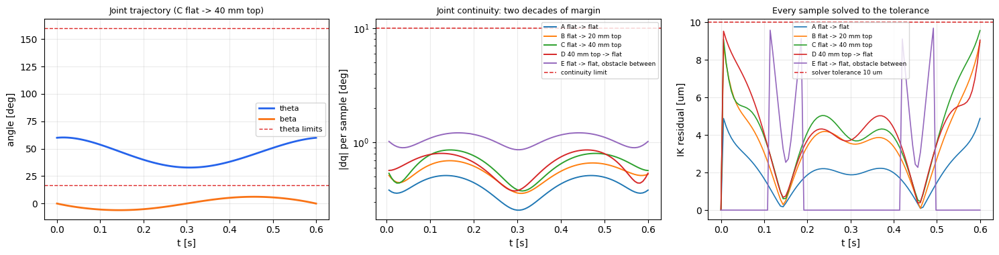

In [33]:
step5_demo_name = 'C flat -> 40 mm top'
step5_demo = step5_results[step5_demo_name]
step5_times = step5_demo.time_s

fig, axes = plt.subplots(1, 3, figsize=(15, 3.9))

thetas_deg = np.rad2deg([sample.theta_rad for sample in step5_demo.samples])
betas_deg = np.rad2deg([sample.beta_rad for sample in step5_demo.samples])
axes[0].plot(step5_times, thetas_deg, color='#2563eb', lw=2.0, label='theta')
axes[0].plot(step5_times, betas_deg, color='#f97316', lw=2.0, label='beta')
axes[0].axhline(np.rad2deg(THETA_MIN_RAD), color='#dc2626', ls='--', lw=1.0,
                label='theta limits')
axes[0].axhline(np.rad2deg(THETA_MAX_RAD), color='#dc2626', ls='--', lw=1.0)
axes[0].set_xlabel('t [s]'); axes[0].set_ylabel('angle [deg]')
axes[0].set_title(f'Joint trajectory ({step5_demo_name})', fontsize=9)
axes[0].legend(fontsize=8); axes[0].grid(True, alpha=0.25)

for name, result in step5_results.items():
    steps_deg = np.rad2deg([
        sample.joint_step_rad for sample in result.samples if sample.joint_step_rad is not None
    ])
    axes[1].plot(result.time_s[1:], steps_deg, lw=1.4, label=name)
axes[1].axhline(np.rad2deg(day8_9_requests[step5_demo_name].constraints.max_joint_step_rad),
                color='#dc2626', ls='--', lw=1.1, label='continuity limit')
axes[1].set_yscale('log')
axes[1].set_xlabel('t [s]'); axes[1].set_ylabel('|dq| per sample [deg]')
axes[1].set_title('Joint continuity: two decades of margin', fontsize=9)
axes[1].legend(fontsize=6.5); axes[1].grid(True, alpha=0.25)

for name, result in step5_results.items():
    residual_um = np.array([sample.ik_residual_m for sample in result.samples]) * 1e6
    axes[2].plot(result.time_s, residual_um, lw=1.2, label=name)
axes[2].axhline(10.0, color='#dc2626', ls='--', lw=1.1, label='solver tolerance 10 um')
axes[2].set_xlabel('t [s]'); axes[2].set_ylabel('IK residual [um]')
axes[2].set_title('Every sample solved to the tolerance', fontsize=9)
axes[2].legend(fontsize=6.5); axes[2].grid(True, alpha=0.25)
fig.tight_layout()
plt.show()

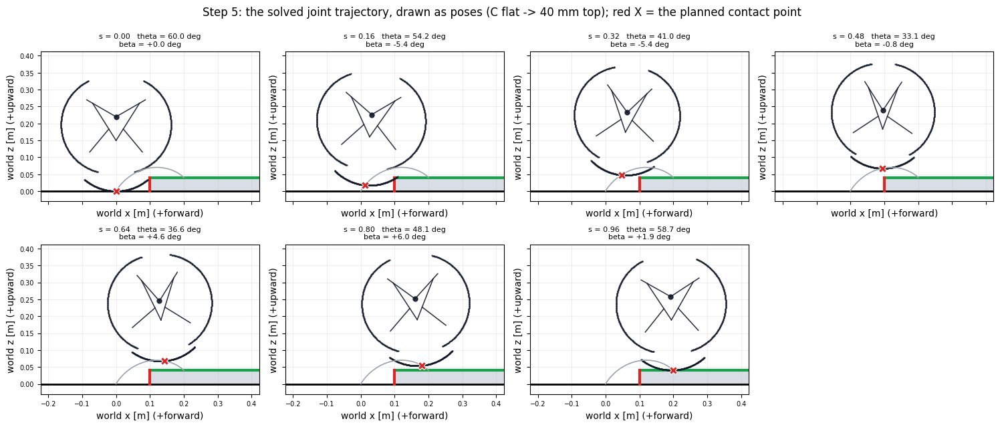

In [34]:
def scene_at_pose(reference_scene, theta_rad, beta_rad, hip_xz_m):
    # 用既有的 Day 6–7 scene builder 重建一個姿態，方便沿用同一套畫圖程式。
    obstacle = reference_scene.terrain.obstacle
    obstacle_kwargs = (
        {'obstacle_x_start_m': None} if obstacle is None else {
            'obstacle_x_start_m': obstacle.x_min_m,
            'obstacle_width_m': obstacle.width_m,
            'obstacle_height_m': obstacle.height_m,
            'obstacle_id': obstacle.obstacle_id,
        }
    )
    return build_single_leg_rolling_scene_2d(
        theta_rad, beta_rad, float(hip_xz_m[0]), float(hip_xz_m[1]),
        ground_height_m=reference_scene.terrain.ground_height_m,
        arc_samples=241, **obstacle_kwargs,
    )


step5_demo_request = day8_9_requests[step5_demo_name]
step5_demo_start_scene, step5_demo_target_scene = day8_9_cases[step5_demo_name]
stride = (step5_demo.sample_count - 1) // 6

step5_pose_scenes = []
for sample in step5_demo.samples[::stride]:
    fraction = float(sample.time_s / step5_demo_request.swing_duration_s)
    hip_pose = step5_demo_request.hip_trajectory.pose_at(fraction)
    step5_pose_scenes.append((fraction, sample, scene_at_pose(
        step5_demo_start_scene, sample.theta_rad, sample.beta_rad,
        hip_pose.position_world_xz_m)))

step5_pose_limits = scene_x_limits(step5_demo_start_scene, step5_demo_target_scene)
pose_z = np.concatenate(
    [scene.geometry.points_world_xz_m[:, 1] for _, _, scene in step5_pose_scenes]
    + [[scene.hip_pose.position_world_xz_m[1]] for _, _, scene in step5_pose_scenes]
)
step5_pose_ylim = (float(pose_z.min()) - 0.03, float(pose_z.max()) + 0.03)
path = step5_demo.positions_world_xz_m

fig, axes = plt.subplots(2, 4, figsize=(15, 6.4), sharex=True, sharey=True)
for ax, (fraction, sample, pose_scene) in zip(axes.ravel(), step5_pose_scenes):
    plot_terrain_profile_2d(step5_demo_request.terrain, ax=ax, x_limits_m=step5_pose_limits)
    ax.plot(path[:, 0], path[:, 1], '-', color='#9ca3af', lw=1.2, zorder=6)
    draw_leg(ax, pose_scene, '#111827', 'leg', alpha=0.9, linewidth=1.1)
    ax.plot(sample.position_world_xz_m[0], sample.position_world_xz_m[1], 'X', ms=9,
            color='#dc2626', mec='white', mew=0.8, zorder=10)
    ax.set_xlim(*step5_pose_limits)
    ax.set_ylim(*step5_pose_ylim)
    ax.set_aspect('equal', adjustable='box')
    ax.grid(True, alpha=0.2)
    ax.get_legend().remove() if ax.get_legend() else None
    ax.set_title(f's = {fraction:.2f}   theta = {np.rad2deg(sample.theta_rad):.1f} deg\n'
                 f'beta = {np.rad2deg(sample.beta_rad):+.1f} deg', fontsize=8)
    ax.tick_params(labelsize=7)
    for text in list(ax.texts):
        text.remove()
axes.ravel()[-1].axis('off')
fig.suptitle('Step 5: the solved joint trajectory, drawn as poses '
             f'({step5_demo_name}); red X = the planned contact point', y=0.99)
fig.tight_layout()
plt.show()

### 讀圖：這是第一次「腿」出現在 swing 裡

前面 Step 2–3 畫的都是一條線；這張圖是那條線背後**實際的腿姿態**。
每個姿態都是 IK 解出來的 `(theta, beta)`，hip 沿著 `HipTrajectory2D` 前進。

看得到的東西：腿在起飛後收起（theta 變小），在最高點附近縮到最小，
再張開到落地姿態。黑線是被規劃的接觸點軌跡——注意它**穿過**了幾個姿態的輪緣，
因為那條線追的是「當下那個 alpha 的輪上點」，不是輪心。

看不到、但這張圖也還沒排除的東西：**這些姿態有沒有撞到障礙物**。
畫面上腿身看起來很靠近障礙物的垂直面。接觸點的餘裕 Step 3 量過，
但整條腿的餘裕要等 Step 6 用 Day 3–5 的 collision checker 沿軌跡跑過才知道。

### 失敗長什麼樣：要求一個腿搆不到的 apex

把 case E 的 clearance 從 30 mm 拉到 100 mm，Step 3 會把 apex 抬到 140 mm。
軌跡本身照樣畫得出來（Bezier 不在乎機構），但腿收到 17° 的下限就再也搆不上去了。

In [35]:
step5_hard_request = replace(
    case_e_request, target=replace(case_e_request.target, clearance_m=0.10))
step5_hard_apex_m = terrain_aware_apex_2d(step5_hard_request).apex_height_m
step5_hard_path = generate_terrain_aware_swing_path_2d(step5_hard_request)
step5_hard, step5_hard_solutions = solve_swing_joint_trajectory_2d(step5_hard_path)

print(f'clearance 100 mm -> z_apex = {step5_hard_apex_m * 1e3:.0f} mm')
print(f'failure          : {step5_hard.failure.value} at sample '
      f'{step5_hard.failure_sample_index}')
print(f'failure_detail   : {step5_hard.failure_detail}')
display(pd.DataFrame([joint_trajectory_report_2d(step5_hard)]).T.rename(columns={0: 'value'}))

clearance 100 mm -> z_apex = 140 mm
failure          : IK_NOT_CONVERGED at sample 26
failure_detail   : IK stopped at residual 2.592 mm after 8 iterations. theta is pinned at its limit, so the target is out of reach.


,value
samples,101
ik_converged_count,52
max_ik_residual_um,65551.38435
joint_limits_ok_count,101
theta_min_deg,17.0
theta_max_deg,60.0
beta_span_deg,34.20717
max_joint_step_deg,2.686756
max_joint_step_limit_deg,10.0
max_joint_speed_deg_s,447.792685


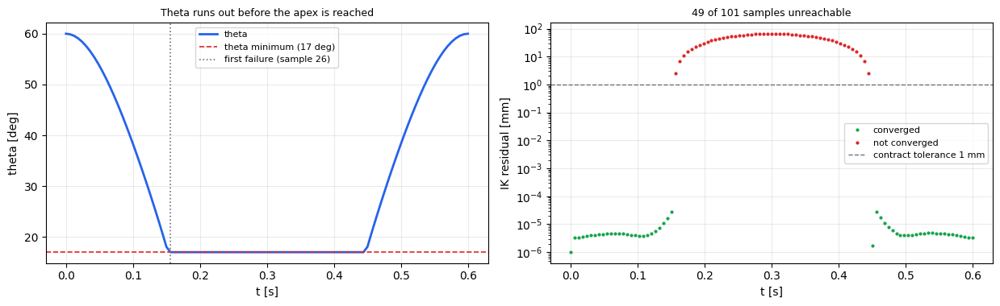

In [36]:
fig, axes = plt.subplots(1, 2, figsize=(12.5, 3.9))
times = step5_hard.time_s
thetas_deg = np.rad2deg([sample.theta_rad for sample in step5_hard.samples])
residual_mm = np.array([sample.ik_residual_m for sample in step5_hard.samples]) * 1e3
failure_index = step5_hard.failure_sample_index

axes[0].plot(times, thetas_deg, color='#2563eb', lw=2.0, label='theta')
axes[0].axhline(np.rad2deg(THETA_MIN_RAD), color='#dc2626', ls='--', lw=1.2,
                label='theta minimum (17 deg)')
axes[0].axvline(times[failure_index], color='#6b7280', ls=':', lw=1.2,
                label=f'first failure (sample {failure_index})')
axes[0].set_xlabel('t [s]'); axes[0].set_ylabel('theta [deg]')
axes[0].set_title('Theta runs out before the apex is reached', fontsize=9)
axes[0].legend(fontsize=8); axes[0].grid(True, alpha=0.25)

converged = np.array([bool(sample.ik_converged) for sample in step5_hard.samples])
axes[1].semilogy(times[converged], np.maximum(residual_mm[converged], 1e-6), '.', ms=4,
                 color='#16a34a', label='converged')
axes[1].semilogy(times[~converged], residual_mm[~converged], '.', ms=4,
                 color='#dc2626', label='not converged')
axes[1].axhline(step5_hard_request.constraints.ik_position_tolerance_m * 1e3,
                color='#6b7280', ls='--', lw=1.0, label='contract tolerance 1 mm')
axes[1].set_xlabel('t [s]'); axes[1].set_ylabel('IK residual [mm]')
axes[1].set_title(f'{int((~converged).sum())} of {len(converged)} samples unreachable',
                  fontsize=9)
axes[1].legend(fontsize=8); axes[1].grid(True, alpha=0.25)
fig.tight_layout()
plt.show()

### 讀圖：為什麼這回報成 `IK_NOT_CONVERGED` 而不是 `JOINT_LIMIT_VIOLATION`

`joint_limits_ok_count` 是 101/101——**沒有任何一個 sample 違反 joint limit**。
因為求解器刻意留在 [17°, 160°] 的範圍內（`LegModel.forward` 會偷偷 clip theta，
超出範圍的 FK 回傳的是別的姿態的結果，所以在範圍外迭代等於在解一個假問題）。

結果就是：**「因為關節極限而搆不到」會表現成 IK 收斂失敗，而不是極限違規**。
這兩件事在資料上必須分得開，所以 `failure_detail` 會把 `theta_at_limit` 講出來：

```text
IK stopped at residual 2.592 mm after 8 iterations.
theta is pinned at its limit, so the target is out of reach.
```

如果沒有這句，讀 log 的人只會看到「IK 不收斂」，然後去懷疑求解器。

In [37]:
day8_9_step5_frames_csv = day8_9_dir / 'day8_9_step5_flat_to_40mm_frames.csv'
day8_9_step5_summary_csv = day8_9_dir / 'day8_9_step5_flat_to_40mm_summary.csv'
day8_9_step5_report_csv = day8_9_dir / 'day8_9_step5_joint_trajectory_report.csv'

frames_path, summary_path = write_swing_result_csv(
    step5_demo, day8_9_step5_frames_csv, day8_9_step5_summary_csv)
step5_report.to_csv(day8_9_step5_report_csv)
for path in (frames_path, summary_path, day8_9_step5_report_csv):
    print(f'{path.relative_to(project_root)}  ({path.stat().st_size} bytes)')

display(pd.DataFrame(swing_result_frame_rows(step5_demo)).iloc[[0, 25, 50, 75, 100]])
print('collision_free 與 terrain_clearance_mm 仍然是 None——Step 6 的欄位。')

hybrid_note/notes/day8-9/day8_9_step5_flat_to_40mm_frames.csv  (21657 bytes)
hybrid_note/notes/day8-9/day8_9_step5_flat_to_40mm_summary.csv  (927 bytes)
hybrid_note/notes/day8-9/day8_9_step5_joint_trajectory_report.csv  (1152 bytes)


,index,time_s,x_m,z_m,vx_mps,vz_mps,speed_mps,rim,alpha_deg,theta_deg,beta_deg,gamma_deg,ik_converged,ik_residual_mm,joint_step_deg,joint_limits_ok,collision_free,terrain_clearance_mm
0,0,0.00,-2.787644e-17,1.000000e-09,0.000000,0.000000,0.000000,foot_rim,0.0,60.000000,0.000000,0.0,True,0.000000,NaN,True,None,None
25,25,0.15,2.949219e-02,3.486501e-02,0.371094,0.319981,0.489998,foot_rim,0.0,46.743830,-6.016451,0.0,True,0.000623,0.858989,True,None,None
50,50,0.30,1.000000e-01,6.837112e-02,0.520833,0.083333,0.527458,foot_rim,0.0,32.855417,-0.000321,0.0,True,0.003784,0.385307,True,None,None
75,75,0.45,1.705078e-01,5.955251e-02,0.371094,-0.163731,0.405609,foot_rim,0.0,44.136729,6.164008,0.0,True,0.000944,0.779276,True,None,None
100,100,0.60,2.000000e-01,4.000000e-02,0.000000,0.000000,0.000000,foot_rim,0.0,59.995167,-0.001041,0.0,True,0.009558,0.567375,True,None,None


collision_free 與 terrain_clearance_mm 仍然是 None——Step 6 的欄位。


## 17. Step 5 完成標準對照

| 規劃要求 | 狀態 | 證據 |
| --- | --- | --- |
| 對每個 Cartesian sample 做 IK，warm start 前一個解 | 完成 | §16 五個 case，每條 101 個 sample |
| 檢查 IK convergence | 完成 | 全部 101/101 收斂 |
| 檢查 IK residual | 完成 | 最大 < 10 µm（契約容忍 1 mm） |
| 檢查 theta / beta limits | 完成 | 全部在 [17°, 160°] 內 |
| 檢查 joint continuity | 完成 | 最大 |dq| 0.5–1.2°，限制 10° |
| flat-to-flat 與不同 target height 都能輸出連續 joint trajectory | 完成 | A–E 五個 case 全部通過 |

Step 1 凍結的 `SwingSample2D` schema **沒有為了 Step 5 改過任何一個欄位**。

到這裡為止，五個 case 看起來都「成功」了。Step 6 會推翻其中三個。

## 18. Step 6 — 把整條腿放回去檢查

前面每一步問的都是**接觸點**的問題：接觸點在哪、接觸點會不會穿過地形、接觸點能不能被 IK 擺到那裡。
但 leg-wheel 不是質點——規劃 §9 講得很直接：

> 即使規劃的 contact point 已高於 obstacle，其他 rim、foot structure 或 linkage 仍可能撞 vertical face。

所以 Step 6 把每個 `q_i` 展開回**完整腿部幾何**，丟給 Day 3–5 的 checker：

```text
q_i -> sample_contact_geometry_points -> SampledLegGeometry2D
    -> query_contact(geometry, terrain)
         geometry penetrations    （地面與障礙物頂面）
         vertical-face collisions （障礙物前緣 / 後緣）
         link collisions          （連桿）
```

這裡沒有寫任何新的幾何或地形程式碼：腿面來自跟 contact map 同一個 sampler，
檢查是 Day 3–5 的三個 detector，clearance 用的是 Day 6–7 已經定義好的
「離**不是自己所踩的**那些表面有多遠」——因為 swing 的兩端本來就踩在地上，
不排除支撐面的話這個量恆為零。

**兩端接觸不算碰撞。** 起點與落點依定義就貼著地形；而且 Step 5 的 IK 只解到約 10 µm，
所以淺於 10 µm 的重疊被當成求解器雜訊而不是碰撞證據。

In [38]:
step6_results = {}
step6_reports = {}
step6_queries = {}
for name, result in step5_results.items():
    checked, report, queries = check_swing_trajectory_collisions_2d(result)
    step6_results[name] = checked
    step6_reports[name] = report
    step6_queries[name] = queries

step6_table = pd.DataFrame([
    dict(report.as_dict(), case=name, failure=step6_results[name].failure.value)
    for name, report in step6_reports.items()
]).set_index('case')
display(step6_table.T)

case,A flat -> flat,B flat -> 20 mm top,C flat -> 40 mm top,D 40 mm top -> flat,"E flat -> flat, obstacle between"
collision_free,True,True,False,False,False
first_collision_index,NaN,NaN,10.0,81.0,7.0
collision_type,None,None,vertical_face_collision,vertical_face_collision,geometry_penetration
collision_surface_id,None,None,day8_9_obstacle_front,day8_9_obstacle_front,day8_9_obstacle_front
collision_depth_mm,NaN,NaN,0.296746,0.61157,1.177524
minimum_clearance_mm,1.022021,1.008046,-2.639673,-2.639872,-10.385162
minimum_clearance_index,95,4,12,88,15
checked_samples,101,101,101,101,101
arc_samples,121,121,121,121,121
failure,NOT_EVALUATED,NOT_EVALUATED,TERRAIN_COLLISION,TERRAIN_COLLISION,TERRAIN_COLLISION


### 讀表：五個 case 有三個撞了

| case | Step 2–5 的結論 | Step 6 的結論 |
| --- | --- | --- |
| A flat → flat | 通過 | collision-free |
| B flat → 20 mm | 通過 | collision-free |
| **C flat → 40 mm** | 通過 | **撞障礙物前緣垂直面** |
| **D 40 mm → flat** | 通過 | **撞障礙物前緣垂直面** |
| **E 中間有障礙** | 通過 | **穿入障礙物頂面 10.4 mm** |

case C 就是規劃 §Step 6 要求的反例，而且**不是特別造出來的**——
它從 Step 1 就在這本 notebook 裡，Step 3 量過它的接觸點路徑完全沒有穿透，
Step 5 的 IK 也全部收斂、關節連續。只有把輪子本體放回去，它才失敗。

case E 更值得注意：Step 3 才剛把 apex 從 30 mm 抬到 70 mm、把接觸點救出障礙物，
Step 6 卻發現輪子的另一側整個插進頂面 10.4 mm。
**「接觸點的餘裕」和「腿的餘裕」是兩個不同的量**，這就是規劃說 `z_apex` 不能取代
完整 collision check 的具體意思。

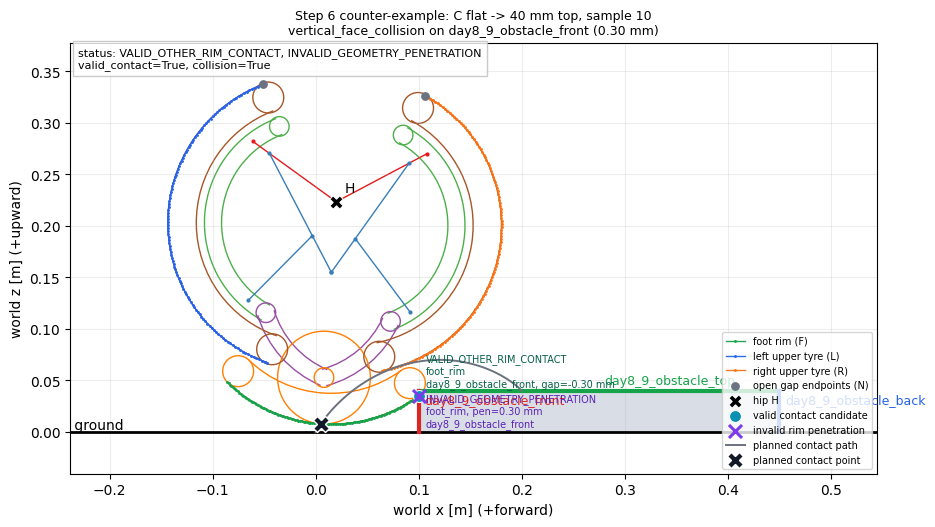

first collision, sample 10:
  planned contact point : x = 5.0 mm, z = 7.9 mm
  its clearance to the obstacle : 95.0 mm  (the front face is at x = 100 mm)
  the leg rim spans       : x = -143.4 .. 180.4 mm
  so the wheel reaches 80 mm past that face while the contact point is still 95 mm short of it.
  the leg surfaces actually inside the terrain at this sample:
    foot_rim into day8_9_obstacle_front, 0.30 mm at x = 100.3 mm, z = 35.3 mm


In [39]:
step6_collision_case = 'C flat -> 40 mm top'
step6_collision_result = step6_results[step6_collision_case]
step6_collision_report = step6_reports[step6_collision_case]
step6_bad_index = step6_collision_report.first_collision_index
step6_bad_sample = step6_collision_result.samples[step6_bad_index]
step6_bad_scene = swing_sample_scene_2d(step6_collision_result, step6_bad_sample)
step6_bad_query = step6_queries[step6_collision_case][step6_bad_index]

fig, ax = plt.subplots(figsize=(11, 5.6))
plot_single_leg_rolling_scene_2d(step6_bad_scene, ax=ax, query_result=step6_bad_query)
path = step6_collision_result.positions_world_xz_m
ax.plot(path[:, 0], path[:, 1], '-', color='#6b7280', lw=1.4, zorder=7,
        label='planned contact path')
ax.plot(step6_bad_sample.position_world_xz_m[0], step6_bad_sample.position_world_xz_m[1],
        'X', ms=12, color='#111827', mec='white', mew=1.0, zorder=12,
        label='planned contact point')
ax.legend(fontsize=7, loc='lower right')
ax.set_title(f'Step 6 counter-example: {step6_collision_case}, sample {step6_bad_index}\n'
             f'{step6_collision_report.collision_detail}', fontsize=9)
plt.show()

step6_face_x_m = step6_collision_result.request.terrain.obstacle.x_min_m
step6_rim_x = step6_bad_scene.geometry.points_world_xz_m[:, 0]
step6_point_obstacle_clearance_mm = path_point_clearance_samples_2d(
    step6_collision_result)[1][step6_bad_index] * 1e3
print(f'first collision, sample {step6_bad_index}:')
print(f'  planned contact point : x = {step6_bad_sample.position_world_xz_m[0] * 1e3:.1f} mm, '
      f'z = {step6_bad_sample.position_world_xz_m[1] * 1e3:.1f} mm')
print(f'  its clearance to the obstacle : '
      f'{step6_point_obstacle_clearance_mm:.1f} mm  (the front face is at '
      f'x = {step6_face_x_m * 1e3:.0f} mm)')
print(f'  the leg rim spans       : x = {step6_rim_x.min() * 1e3:.1f} .. '
      f'{step6_rim_x.max() * 1e3:.1f} mm')
print(f'  so the wheel reaches {(step6_rim_x.max() - step6_face_x_m) * 1e3:.0f} mm past that face '
      f'while the contact point is still {step6_point_obstacle_clearance_mm:.0f} mm short of it.')
print('  the leg surfaces actually inside the terrain at this sample:')
for hit in (*step6_bad_query.collisions, *step6_bad_query.geometry_penetrations):
    print(f'    {hit.raw_surface_name} into {hit.terrain_surface_id}, '
          f'{hit.penetration_depth_m * 1e3:.2f} mm at '
          f'x = {hit.point_world_xz_m[0] * 1e3:.1f} mm, z = {hit.point_world_xz_m[1] * 1e3:.1f} mm')

### 讀圖：規劃要求的反例

黑色 X 是被規劃的接觸點。它在 x ≈ 5 mm，離障礙物前緣還有 **95 mm**——
純粹以接觸點的角度看，這一幀離障礙物遠得很，Step 3 量到的接觸點餘裕當然是正的。

但輪子的半徑是 145 mm。此時腿的輪緣已經橫跨到 x ≈ 180 mm，
遠超過 x = 100 mm 的前緣垂直面。上面那格印出來的就是**實際插進地形的是腿的哪個面**——
是 `foot_rim` 自己沿著弧線往前的那一段，在障礙物前緣的高度上插進垂直面。

換句話說：**接觸點離障礙物 95 mm，輪子已經在障礙物裡面了。**
腿的尺寸比「接觸點到障礙物的距離」還大，這種失效模式在 point-foot 模型裡根本不存在。

這正是規劃 §9 說的：

> `z_apex` 只負責建立初始 swing curve，不能取代完整 collision check。
> 原因是 leg-wheel 不是 point foot。

換句話說，Step 2–5 全部通過的軌跡，可以是一條讓機器人撞上障礙物的軌跡。

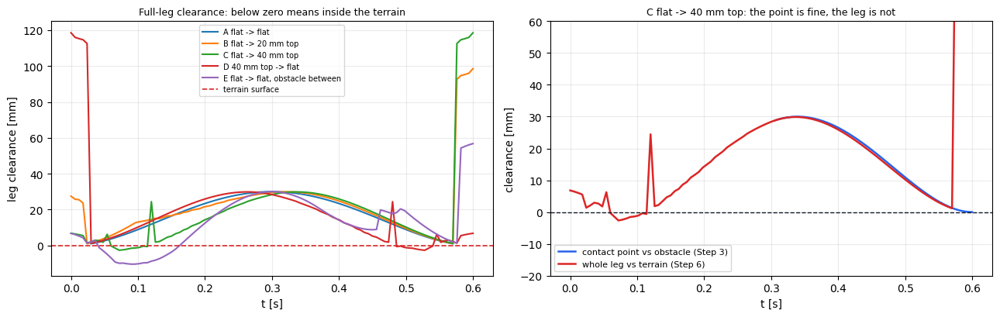

In [40]:
fig, axes = plt.subplots(1, 2, figsize=(13, 4.2))

for name, checked in step6_results.items():
    clearance_mm = np.array([
        np.nan if sample.terrain_clearance_m is None else sample.terrain_clearance_m * 1e3
        for sample in checked.samples
    ])
    axes[0].plot(checked.time_s, clearance_mm, lw=1.5, label=name)
axes[0].axhline(0.0, color='#dc2626', ls='--', lw=1.2, label='terrain surface')
axes[0].set_xlabel('t [s]'); axes[0].set_ylabel('leg clearance [mm]')
axes[0].set_title('Full-leg clearance: below zero means inside the terrain', fontsize=9)
axes[0].legend(fontsize=7); axes[0].grid(True, alpha=0.25)

point_clearance_mm = np.array([
    value * 1e3 for value in
    path_point_clearance_samples_2d(step6_results[step6_collision_case])[1]
])
leg_clearance_mm = np.array([
    sample.terrain_clearance_m * 1e3 for sample in step6_results[step6_collision_case].samples
])
times = step6_results[step6_collision_case].time_s
axes[1].plot(times, point_clearance_mm, lw=1.8, color='#2563eb',
             label='contact point vs obstacle (Step 3)')
axes[1].plot(times, leg_clearance_mm, lw=1.8, color='#dc2626',
             label='whole leg vs terrain (Step 6)')
axes[1].axhline(0.0, color='#111827', ls='--', lw=1.0)
axes[1].set_ylim(-20, 60)
axes[1].set_xlabel('t [s]'); axes[1].set_ylabel('clearance [mm]')
axes[1].set_title(f'{step6_collision_case}: the point is fine, the leg is not', fontsize=9)
axes[1].legend(fontsize=8); axes[1].grid(True, alpha=0.25)
fig.tight_layout()
plt.show()

### 讀圖：兩條 clearance 曲線的差距就是 Step 6 的價值

右圖藍線是 Step 3 量的「接觸點離障礙物多遠」，全程沒有落到零以下
（末端剛好為零，因為落地本來就踩在頂面上）；
紅線是 Step 6 量的「整條腿離地形多遠」，前段直接掉到零以下。

同一條軌跡、同一個地形，兩個量的結論相反。任何只看接觸點的 planner
都會把這條軌跡當成可行解送出去。

In [41]:
# 取樣密度值得懷疑一下：腿面是離散取樣的，取樣越密越可能抓到淺的重疊。
step6_density_rows = []
for arc_samples in (61, 121):
    report = check_swing_trajectory_collisions_2d(
        step5_results[step6_collision_case], arc_samples=arc_samples)[1]
    step6_density_rows.append(dict(report.as_dict(), arc_samples=arc_samples))
display(pd.DataFrame(step6_density_rows).set_index('arc_samples').T)
print('verdict、深度與最小 clearance 一致；first_collision_index 可能差一個 sample，')
print('兩個重疊深度相近時「主要碰撞類型」也可能互換——所以預設用較密的 121。')

arc_samples,61,121
collision_free,False,False
first_collision_index,10,10
collision_type,vertical_face_collision,vertical_face_collision
collision_surface_id,day8_9_obstacle_front,day8_9_obstacle_front
collision_depth_mm,0.296746,0.296746
minimum_clearance_mm,-2.639673,-2.639673
minimum_clearance_index,12,12
checked_samples,101,101


verdict、深度與最小 clearance 一致；first_collision_index 可能差一個 sample，
兩個重疊深度相近時「主要碰撞類型」也可能互換——所以預設用較密的 121。


In [42]:
day8_9_step6_frames_csv = day8_9_dir / 'day8_9_step6_flat_to_40mm_frames.csv'
day8_9_step6_summary_csv = day8_9_dir / 'day8_9_step6_flat_to_40mm_summary.csv'
day8_9_step6_collision_csv = day8_9_dir / 'day8_9_step6_collision_report.csv'
day8_9_step6_detail_csv = day8_9_dir / 'day8_9_step6_flat_to_40mm_collision_detail.csv'

frames_path, summary_path = write_swing_result_csv(
    step6_collision_result, day8_9_step6_frames_csv, day8_9_step6_summary_csv)
step6_table.to_csv(day8_9_step6_collision_csv)
pd.DataFrame(collision_frame_rows(
    step6_collision_result, step6_queries[step6_collision_case]
)).to_csv(day8_9_step6_detail_csv, index=False)
for path in (frames_path, summary_path, day8_9_step6_collision_csv, day8_9_step6_detail_csv):
    print(f'{path.relative_to(project_root)}  ({path.stat().st_size} bytes)')

display(pd.DataFrame(collision_frame_rows(
    step6_collision_result, step6_queries[step6_collision_case]
)).iloc[[0, 8, 10, 12, 50, 100]])

hybrid_note/notes/day8-9/day8_9_step6_flat_to_40mm_frames.csv  (23856 bytes)
hybrid_note/notes/day8-9/day8_9_step6_flat_to_40mm_summary.csv  (982 bytes)
hybrid_note/notes/day8-9/day8_9_step6_collision_report.csv  (761 bytes)
hybrid_note/notes/day8-9/day8_9_step6_flat_to_40mm_collision_detail.csv  (10099 bytes)


,index,time_s,x_m,z_m,collision_free,clearance_mm,geometry_penetrations,vertical_face_collisions,link_collisions,contact_candidates,statuses
0,0,0.000,-2.787644e-17,1.000000e-09,True,6.795797,0,0,0,21,VALID_OTHER_RIM_CONTACT
8,8,0.048,3.180175e-03,5.283452e-03,True,1.776278,0,0,0,0,NO_CONTACT
10,10,0.060,4.952000e-03,7.907299e-03,False,-0.296746,0,1,0,1,"VALID_OTHER_RIM_CONTACT, INVALID_GEOMETRY_PENE..."
12,12,0.072,7.101297e-03,1.089822e-02,False,-2.639673,2,0,0,1,"VALID_OTHER_RIM_CONTACT, INVALID_GEOMETRY_PENE..."
50,50,0.300,1.000000e-01,6.837112e-02,True,28.384591,0,0,0,0,NO_CONTACT
100,100,0.600,2.000000e-01,4.000000e-02,True,118.582130,0,0,0,21,VALID_OTHER_RIM_CONTACT


## 19. Step 6 完成標準對照

| 規劃要求 | 狀態 | 證據 |
| --- | --- | --- |
| 每個 `q_i` 建立完整 leg geometry 再查 terrain | 完成 | §18，101 個 sample × 5 個 case |
| 不要只檢查 Bezier point | 完成 | §18 右圖：接觸點餘裕全程為正，腿的餘裕掉到負值 |
| ground penetration | 完成 | `geometry_penetrations`（case E 撞頂面 10.4 mm） |
| obstacle top penetration | 完成 | 同上 |
| vertical-face collision | 完成 | case C / D 撞前緣垂直面 |
| other rim / linkage collision | 完成 | `link_collisions` 一併檢查（本批 case 未觸發） |
| 輸出 `collision_free / first_collision_index / collision_type / minimum_clearance` | 完成 | `SwingCollisionReport2D` |
| 造出「接觸點跨得過但本體撞垂直面」的反例並判 invalid | 完成 | case C：`TERRAIN_COLLISION` at sample 10 |

反例不是特別造的——它是 Step 1 就存在、Step 2–5 全部通過的那個 case。

### 目前**沒有**被證明的事

```text
touchdown 只驗過接觸點位置，沒驗過 rim / alpha / terrain surface（Step 7）
沒有驗過 touchdown 速度（Step 8）
撞到的三個 case 還沒有被修——Step 6 的工作是「判得出來」，不是「修得好」
SwingResult2D.valid 仍然是 False
1.2 mm 的 rim 幾何差異仍然只是被記錄
```

### 下一步：Step 7 — Touchdown contact validation

最後一個 sample 不能只確認 Cartesian position 到了，還要重新做 contact query：

```text
target contact position error
target rim
target alpha
terrain surface match
no penetration
joint limits
```

規劃 §11 特別提醒：最後要重新呼叫 terrain-aware contact query，
確認真正接觸的是預期 surface，而不是另一個 rim / linkage 更早碰到 obstacle。
Step 6 已經把那個 query 沿整條軌跡跑過了，所以 Step 7 主要是在最後一幀上
把 `rim / alpha / surface` 三件事對起來。

## 20. Step 7 — Touchdown contact validation

到了正確的**座標**，不等於落在正確的**接觸狀態**。
規劃 §11 講得很清楚：最後要重新呼叫 terrain-aware contact query，
確認真正接觸的是預期 surface，而不是另一個 rim / linkage 更早碰到。

所以 Step 7 對最後一個 sample 問兩個**互相獨立**的問題：

```text
1. 腿有沒有把「被指定的那個 (rim, alpha) 輪上點」放到指定位置？
   -> 用解出來的關節角重算 FK

2. 那個點是不是真正在接觸的點，而且踩在預期的 surface 上？
   -> 對完整腿部幾何重跑 query_contact
```

兩個問題可以各自通過或失敗，而**第二個才是這一步存在的理由**。

一個容忍值的選擇要講清楚：Step 6 用 IK 自己的精度（約 10 µm）當穿透門檻，
因為飛行中的腿根本不該碰到任何東西。但 touchdown **本來就在接觸**，
Day 3–5 的 query 把「離表面 ±1 mm 以內」都算成接觸——它分不出「踩在上面」和
「陷進去 0.5 mm」。所以這一步的穿透門檻用的是 contact model 自己的解析度，不是更嚴的那個。

In [43]:
step7_results = {}
step7_validations = {}
for name, checked in step6_results.items():
    step7_results[name], step7_validations[name], _ = validate_swing_touchdown_2d(checked)

step7_table = pd.DataFrame([
    dict(validation.as_dict(), case=name, headline=step7_results[name].failure.value)
    for name, validation in step7_validations.items()
]).set_index('case')
display(step7_table.T)

case,A flat -> flat,B flat -> 20 mm top,C flat -> 40 mm top,D 40 mm top -> flat,"E flat -> flat, obstacle between"
position_error_mm,0.004881,0.008944,0.009558,0.009049,0.000003
position_ok,True,True,True,True,True
contact_found,True,True,True,True,True
actual_rim,foot_rim,foot_rim,foot_rim,foot_rim,foot_rim
rim_match,True,True,True,True,True
actual_alpha_deg,0.0,0.0,0.0,0.0,0.0
alpha_error_deg,0.0,0.0,0.0,0.0,0.0
alpha_ok,True,True,True,True,True
actual_terrain_surface_id,ground,day8_9_obstacle_top,day8_9_obstacle_top,ground,ground
surface_match,True,True,True,True,True


### 讀表

五個 case 的 touchdown **全部通過**：位置誤差 < 10 µm（容忍 2 mm）、rim 相符、
alpha 誤差 0、terrain surface 相符、落地姿態沒有穿透、關節在範圍內。

`headline` 那一列顯示 C / D / E 仍然是 `TERRAIN_COLLISION`——那是 Step 6 在**飛行途中**
抓到的碰撞，Step 7 不會去覆蓋它。換句話說：**這三條軌跡的落地本身沒問題，是路上撞到。**
把兩件事分開回報，才知道要修的是路徑還是落點。

alpha 誤差正好是 0，是因為 touchdown query 用 241 個弧取樣點——
跟 target 當初被定義出來的格點一致。用比較粗的格子量，會把格點量化誤差報成 alpha 誤差。

### 量測 alpha 縫隙：一個會回頭修正 §10 說法的發現

Step 7 要比對 alpha，就得先知道 alpha 這個參數到底有多「乾淨」。掃一遍發現：

```text
alpha 是連續參數，但它索引的輪面不是連續的
```

三段輪弧之間有實體缺口。相鄰 alpha 的接觸點位置變化在弧內是平滑的，
但跨過縫的瞬間會**瞬移**。

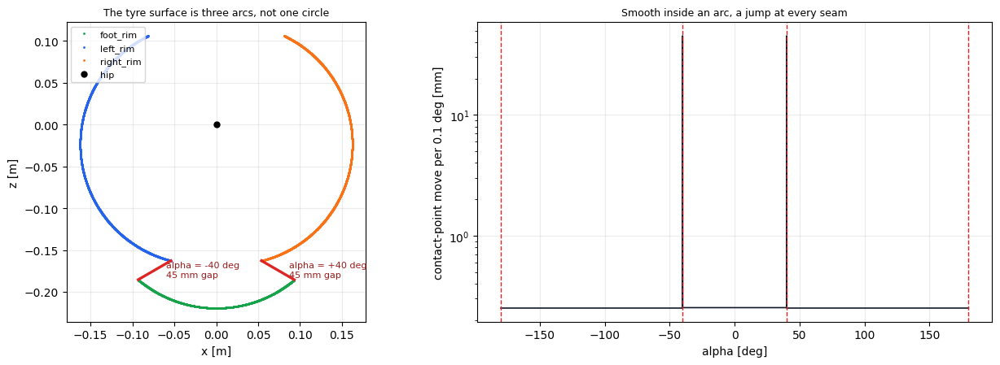

alpha seam at   -40.0 deg -> contact point jumps    45.4 mm
alpha seam at   +40.0 deg -> contact point jumps    45.4 mm
alpha seam at  +180.0 deg -> contact point jumps   162.5 mm


In [44]:
step7_theta_rad = np.deg2rad(60.0)
alpha_scan_deg = np.linspace(-179.99, 179.99, 3601)
scan_points = np.array([
    rim_contact_point_hip_xz_m(step7_theta_rad, 0.0,
                               rim_for_alpha_rad(np.deg2rad(a)), np.deg2rad(a))
    for a in alpha_scan_deg
])
step_mm = np.linalg.norm(np.diff(scan_points, axis=0), axis=1) * 1e3


def seam_jump_mm(seam_deg, delta_deg=1e-3):
    lower_deg = seam_deg - delta_deg
    upper_deg = -seam_deg + delta_deg if abs(seam_deg) == 180.0 else seam_deg + delta_deg
    lower = rim_contact_point_hip_xz_m(step7_theta_rad, 0.0,
                                       rim_for_alpha_rad(np.deg2rad(lower_deg)),
                                       np.deg2rad(lower_deg))
    upper = rim_contact_point_hip_xz_m(step7_theta_rad, 0.0,
                                       rim_for_alpha_rad(np.deg2rad(upper_deg)),
                                       np.deg2rad(upper_deg))
    return lower, upper, float(np.linalg.norm(upper - lower) * 1e3)


fig, axes = plt.subplots(1, 2, figsize=(13, 4.6), gridspec_kw={'width_ratios': [1.0, 1.1]})
for rim, colour in (('foot_rim', '#16a34a'), ('left_rim', '#2563eb'), ('right_rim', '#f97316')):
    mask = np.array([rim_for_alpha_rad(np.deg2rad(a)).value == rim for a in alpha_scan_deg])
    axes[0].plot(scan_points[mask, 0], scan_points[mask, 1], '.', ms=2, color=colour, label=rim)
for seam_deg in (-40.0, 40.0):
    lower, upper, jump_mm = seam_jump_mm(seam_deg)
    axes[0].plot([lower[0], upper[0]], [lower[1], upper[1]], '-', color='#dc2626', lw=2.4, zorder=9)
    axes[0].annotate(f'alpha = {seam_deg:+.0f} deg\n{jump_mm:.0f} mm gap',
                     (0.5 * (lower[0] + upper[0]), 0.5 * (lower[1] + upper[1])),
                     xytext=(10, -6), textcoords='offset points', fontsize=8, color='#991b1b')
axes[0].plot(0, 0, 'ko', ms=5, label='hip')
axes[0].set_aspect('equal', adjustable='box')
axes[0].grid(True, alpha=0.25)
axes[0].legend(fontsize=8, loc='upper left')
axes[0].set_xlabel('x [m]'); axes[0].set_ylabel('z [m]')
axes[0].set_title('The tyre surface is three arcs, not one circle', fontsize=9)

axes[1].semilogy(alpha_scan_deg[1:], step_mm, lw=1.2, color='#111827')
for seam_deg in (-180, -40, 40, 180):
    axes[1].axvline(seam_deg, color='#dc2626', ls='--', lw=1.0)
axes[1].set_xlabel('alpha [deg]')
axes[1].set_ylabel('contact-point move per 0.1 deg [mm]')
axes[1].set_title('Smooth inside an arc, a jump at every seam', fontsize=9)
axes[1].grid(True, alpha=0.25)
fig.tight_layout()
plt.show()

for seam_deg in (-40.0, 40.0, 180.0):
    print(f'alpha seam at {seam_deg:+7.1f} deg -> contact point jumps '
          f'{seam_jump_mm(seam_deg)[2]:7.1f} mm')

In [45]:
# §10 的 rim-transition 示範送進 Step 5：它跨過 +40 deg 的縫。
step7_transition_solved, _ = solve_swing_joint_trajectory_2d(step2_transition_result)
print('§10 的 right_rim(94.8 deg) -> foot_rim(0 deg) swing:')
print(f'  failure = {step7_transition_solved.failure.value} '
      f'at sample {step7_transition_solved.failure_sample_index}')
print(f'  {step7_transition_solved.failure_detail}')
big_steps = [
    (sample.index, float(np.rad2deg(sample.joint_step_rad)), float(np.rad2deg(sample.alpha_rad)))
    for sample in step7_transition_solved.samples
    if sample.joint_step_rad is not None and np.rad2deg(sample.joint_step_rad) > 5.0
]
print('  |dq| > 5 deg 的 sample（index, |dq| deg, alpha deg）：'
      f'{[(i, round(d, 1), round(a, 1)) for i, d, a in big_steps]}')
print('  其餘每一格都平滑——跳的就是 rim 交接那一格。')

§10 的 right_rim(94.8 deg) -> foot_rim(0 deg) swing:
  failure = JOINT_DISCONTINUITY at sample 58
  joint step 24.79 deg exceeds 10.00 deg.
  |dq| > 5 deg 的 sample（index, |dq| deg, alpha deg）：[(58, 24.8, 39.8)]
  其餘每一格都平滑——跳的就是 rim 交接那一格。


### 這修正了 §10 的說法

§10 我寫「alpha 是單一全域參數，所以 rim transition 不需要特判」。
**對參數成立，對幾何不成立。**

那個示範軌跡在 sample 58（α = 39.8°，剛跨過 40° 的縫）需要 24.8° 的關節跳躍，
其餘每一格都在 1° 以內。Step 5 正確地判成 `JOINT_DISCONTINUITY`。

正確的結論是：

```text
同一段輪弧內的 alpha 掃描  ->  不需要特判
跨 rim                     ->  是「重新抓握」，不是平滑的 rim transition
```

Day 6–7 的 rolling 那邊本來就有 `max_seam_bridge_m` 這個 seam guard，
是同一件事的另一面：rolling 跨縫要橋接，swing 跨縫要重新規劃，不能靠線性內插 α。

### 落錯 contact state 的軌跡會怎樣

規劃給 Step 7 的完成標準是「只有真正落到指定 ContactState 的 trajectory 才回傳 success」。
下面三個 target 都是**位置合法、通得過 Step 1 request validation** 的，
但要求的落地接觸狀態有問題。

In [46]:
step7_base = flat_to_flat_swing_request_2d(arc_samples=241)
step7_bad_targets = {
    'foot_rim @ 38 deg 落地': (RimId.FOOT, 38.0),
    'right_rim @ 40 deg（弧的端點）': (RimId.RIGHT, 40.0),
    'right_rim @ 41 deg': (RimId.RIGHT, 41.0),
}
step7_bad_rows = []
for name, (rim, alpha_deg) in step7_bad_targets.items():
    request = replace(step7_base, target=SwingTarget2D(
        step7_base.target.target_point_world_xz_m, rim, np.deg2rad(alpha_deg),
        step7_base.target.target_terrain_surface_id, clearance_m=0.03))
    assert validate_swing_request_2d(request) == ()   # Step 1 認為這是合法的請求
    solved, _ = solve_swing_joint_trajectory_2d(generate_terrain_aware_swing_path_2d(request))
    checked, validation, _ = validate_swing_touchdown_2d(solved)
    step7_bad_rows.append({
        'bad target': name,
        'step5': solved.failure.value,
        **{key: validation.as_dict()[key] for key in (
            'position_error_mm', 'actual_rim', 'rim_match', 'actual_alpha_deg',
            'alpha_error_deg', 'alpha_ok', 'penetration_free', 'passed', 'failure')},
        'touchdown detail': (validation.failure_detail or '')[:52],
    })
display(pd.DataFrame(step7_bad_rows).set_index('bad target').T)

bad target,foot_rim @ 38 deg 落地,right_rim @ 40 deg（弧的端點）,right_rim @ 41 deg
step5,NOT_EVALUATED,JOINT_DISCONTINUITY,JOINT_DISCONTINUITY
position_error_mm,0.000001,0.000009,0.000001
actual_rim,foot_rim,right_rim,right_rim
rim_match,True,True,True
actual_alpha_deg,38.0,40.0,47.583333
alpha_error_deg,0.0,0.0,6.583333
alpha_ok,True,True,False
penetration_free,False,False,False
passed,False,False,False
failure,TERRAIN_COLLISION,TERRAIN_COLLISION,TOUCHDOWN_ALPHA_ERROR


### 讀表：三種失敗，以及一個被這張表逼出來的修正

| target | Step 5 | Step 7 判定 | 誰擋下的 |
| --- | --- | --- | --- |
| `foot_rim @ 38°` | 通過 | `TERRAIN_COLLISION` | **只有 Step 7** |
| `right_rim @ 40°`（弧的端點） | `JOINT_DISCONTINUITY` | `TERRAIN_COLLISION` | Step 5 先 |
| `right_rim @ 41°` | `JOINT_DISCONTINUITY` | `TOUCHDOWN_ALPHA_ERROR` | Step 5 先 |

**`foot_rim @ 38°` 是只有 Step 7 抓得到的那一個。**
位置精確到 1 nm、rim 對、alpha 對、surface 對——Step 1 到 Step 6 全部通過。
但為了讓 38° 那一點著地，整條腿必須轉到把輪緣壓進地面 4.3 mm。
只有在最後一幀重新問一次地形，才看得到這件事。

`right_rim @ 41°` 展示的是另一種：**位置精確、rim 也對，但真正接觸的是 α = 47.6° 那一點**——
下一段 rolling 是按 41° 的輪緣預算規劃的，實際拿到 47.6°。
不過這條軌跡的 headline 是 `JOINT_DISCONTINUITY`，因為 α 要從 0° 掃到 41°、跨過 45 mm 的縫，
Step 5 先擋下來了。

---

**這張表的第二欄逼出了 Step 2 的一個修正。**

`right_rim @ 40°` 第一次跑出來時，Step 7 報的是 53 mm 的 position error，
而 Step 5 說一切正常。追下去發現原因不是「IK 搆不到」，而是：

```text
Step 2 把 target 的 rim 丟掉，改用 rim_for_alpha_rad(alpha) 重新推導
alpha = 40° 正好在縫上，推導規則把它判給 foot_rim
於是整條路徑規劃的是 foot rim 的 40° 點
而 target 要的是 right rim 的 40° 點 —— 兩者相距 45 mm
```

也就是說 **Step 2 並不保證最後一格的接觸狀態等於 target 指定的接觸狀態**，
而這正是整個契約的核心承諾。已修正：端點的 rim 直接取自 start / target 的 contact state，
中間才由 α 推導（在縫以外兩者本來就一致，所以這個覆寫在別處是 no-op）。

修正後 `right_rim @ 40°` 的位置誤差變成 0，改由 Step 5 以 `JOINT_DISCONTINUITY`
擋下——因為最後兩格之間有那個 45 mm 的縫要跨。這才是正確的診斷。

順帶一提：這也讓 `TOUCHDOWN_POSITION_ERROR` 這個 code 在目前的流程裡變得很難觸發——
路徑的終點依構造就等於 target 位置，IK 解不到的話 Step 5 會先報 `IK_NOT_CONVERGED`。
它現在是一道防禦性檢查，不是主要的偵測手段。

In [47]:
day8_9_step7_frames_csv = day8_9_dir / 'day8_9_step7_flat_to_40mm_frames.csv'
day8_9_step7_summary_csv = day8_9_dir / 'day8_9_step7_flat_to_40mm_summary.csv'
day8_9_step7_touchdown_csv = day8_9_dir / 'day8_9_step7_touchdown_validation.csv'

frames_path, summary_path = write_swing_result_csv(
    step7_results[step6_collision_case], day8_9_step7_frames_csv, day8_9_step7_summary_csv)
step7_table.to_csv(day8_9_step7_touchdown_csv)
for path in (frames_path, summary_path, day8_9_step7_touchdown_csv):
    print(f'{path.relative_to(project_root)}  ({path.stat().st_size} bytes)')

display(pd.DataFrame([swing_result_summary_row(step7_results['A flat -> flat'])]).T.rename(
    columns={0: 'A flat -> flat'}).head(14))
print('final_contact_error / final_alpha_error / final_rim / final_terrain_surface_id')
print('這四個 Step 1 就凍結、一直是 None 的欄位，到 Step 7 才被填上。')

hybrid_note/notes/day8-9/day8_9_step7_flat_to_40mm_frames.csv  (23856 bytes)
hybrid_note/notes/day8-9/day8_9_step7_flat_to_40mm_summary.csv  (1032 bytes)
hybrid_note/notes/day8-9/day8_9_step7_touchdown_validation.csv  (977 bytes)


,A flat -> flat
valid,False
failure,NOT_EVALUATED
failure_sample_index,None
failure_detail,Touchdown contact validated; Step 8 has not run.
sample_count,101
apex_z_m,0.03
minimum_terrain_clearance_mm,1.022021
final_contact_error_mm,0.004881
final_alpha_error_deg,0.0
final_rim,foot_rim


final_contact_error / final_alpha_error / final_rim / final_terrain_surface_id
這四個 Step 1 就凍結、一直是 None 的欄位，到 Step 7 才被填上。


## 21. Step 7 完成標準對照

| 規劃要求 | 狀態 | 證據 |
| --- | --- | --- |
| 最後 sample 重新做 contact query / FK validation | 完成 | §20，兩個獨立檢查 |
| target contact position error | 完成 | 五個 case < 10 µm |
| target rim | 完成 | `rim_match`；縫上的 rim 歧義由 §20 的 Step 2 修正處理 |
| target alpha | 完成 | `alpha_error_deg`；`right_rim @ 41°` 判 6.6° 失敗 |
| terrain surface match | 完成 | `surface_match`（五個 case 皆相符） |
| no penetration | 完成 | 用 contact model 的解析度而非 IK 精度 |
| joint limits | 完成 | `joint_limits_ok` |
| 只有真正落到指定 ContactState 才 success | 完成 | §20 三個壞 target 全被拒絕，其中 `foot_rim @ 38°` 只有 Step 7 抓得到 |
| （額外）路徑終點的 rim 必須等於 target 的 rim | 完成 | §20 發現 Step 2 在縫上會推導錯，已修正 |

順帶填上了 Step 1 凍結後一直是 `None` 的四個欄位：
`final_contact_error_m / final_alpha_error_rad / final_rim / final_terrain_surface_id`。

### 目前**沒有**被證明的事

```text
沒有驗過 touchdown 速度（Step 8）
撞到的三個 case 還沒有被修
TOUCHDOWN_POSITION_ERROR 這個 code 在目前流程裡幾乎不可能當 headline
    （路徑終點依構造等於 target，搆不到會先報 IK_NOT_CONVERGED）
SwingResult2D.valid 仍然是 False
1.2 mm 的 rim 幾何差異、45 mm 的 alpha 縫隙，都只是被量化記錄
```

### 下一步：Step 8 — Touchdown velocity validation

```text
|v_n^TD| < v_n,max        n = touchdown surface normal
```

Step 2 的 Bezier 端點速度是解析的、而且恰好為 0，所以第一版的 near-zero 要求
在構造上就成立了；Step 8 主要是把它**量出來並分解**成 normal / tangential 分量，
填進 `touchdown_normal_speed_mps` 與 `touchdown_tangential_speed_mps`，
再依 threshold 判 valid。

而且 Step 8 是**第一個有資格把 `valid` 設成 True 的步驟**——
到那時 `valid=True` 才會真正出現，並且依契約必然配 `failure=NONE`。

## 22. Step 8 — Touchdown velocity，以及 `valid` 的唯一入口

規劃 §12 把 touchdown configuration 和 touchdown velocity **刻意分開**：
一條 swing 可以落在完全正確的接觸狀態上，然後用力砸下去。
第一版只要求法向分量：

```text
|v_n^TD| < v_n,max        n = touchdown surface 的外法向
```

切向分量**量但不判**。它是之後 body-velocity-matched touchdown 要調的東西——
落地時接觸點已經以身體的速度沿著表面移動，下一段 ROLL 才接得順而不是重新撞一次。

### 這一步還有一個特殊責任

`SwingResult2D.valid` 從 Step 1 到 Step 7 一直是 `False`，因為在速度檢查之前
沒有任何一步有資格說「這條 swing 可以用」。Step 8 是**唯一**會把它設成 `True` 的地方。

正因為如此，它會**拒絕**沒跑過 Step 6 和 Step 7 的結果：

```python
if any(sample.collision_free is None for sample in result.samples):
    raise ValueError("...has not been collision-checked (Step 6).")
if result.final_contact_error_m is None:
    raise ValueError("...touchdown contact state has not been validated (Step 7).")
```

不然「只跑 Step 5 就拿到 `valid=True`」會是這個管線最危險的失敗模式——
一條沒做過碰撞檢查的軌跡被標記成可用。

In [48]:
step8_results = {}
step8_velocities = {}
for name, validated in step7_results.items():
    step8_results[name], step8_velocities[name] = validate_swing_touchdown_velocity_2d(validated)

step8_table = pd.DataFrame([
    dict(velocity.as_dict(), case=name,
         VALID=step8_results[name].valid,
         failure=step8_results[name].failure.value)
    for name, velocity in step8_velocities.items()
]).set_index('case')
display(step8_table.T)

case,A flat -> flat,B flat -> 20 mm top,C flat -> 40 mm top,D 40 mm top -> flat,"E flat -> flat, obstacle between"
vx_mps,0.0,0.0,0.0,0.0,0.0
vz_mps,0.0,0.0,0.0,0.0,0.0
speed_mps,0.0,0.0,0.0,0.0,0.0
surface_id,ground,day8_9_obstacle_top,day8_9_obstacle_top,ground,ground
normal_velocity_mps,0.0,0.0,0.0,0.0,0.0
normal_speed_mps,0.0,0.0,0.0,0.0,0.0
normal_speed_limit_mps,0.05,0.05,0.05,0.05,0.05
normal_ok,True,True,True,True,True
approaching,False,False,False,False,False
tangential_velocity_mps,0.0,0.0,0.0,0.0,0.0


### 讀表：`valid = True` 第一次出現

A 和 B 走完了全部八步：request well-posed、Bezier 端點精確、apex 正確、
IK 全收斂、關節連續、整條腿 collision-free、落在指定的 ContactState、
落地法向速度 0 —— `valid = True`，而依契約它必然配 `failure = NONE`。

C / D / E 的 `passed` 是 `True`（落地速度確實是 0，很溫柔），
但 `VALID` 仍然是 `False`、`failure` 仍然是 `TERRAIN_COLLISION`。
**Step 8 只會把乾淨的軌跡升級，不會覆蓋更早的失敗。**
一條在半空中撞到障礙物的軌跡，落地再輕也沒有意義。

`tangential_mismatch_mps = -0.6` 是第一版的代價：接觸點靜止落地，
而身體還在以 0.6 m/s 前進。這個差值就是 Day 9 選配的 body-velocity matching 要消掉的東西。

### Step 8 逼出了 Step 2 的一個缺口

第一次跑 Step 8 時，不管怎麼調 `touchdown_fraction`，`vz` 都是 0——法向檢查根本觸發不了。

原因在 Step 2 的控制點：`touchdown_fraction` 只把 P4 沿著 span **水平**移動，
`z4` 永遠等於 `target_z`，所以 `P'(1) = 5(P5 - P4)` 的垂直分量恆為 0。
規劃 §8 說「透過 P1 / P4 控制 lift-off 與 touchdown velocity」，而我只實作了水平那一半。

已補上 `liftoff_rise_m` / `touchdown_drop_m`：把 P1 抬高、把 P4 抬到落點上方，
曲線就會**從上方**進場。這也正是既有 `legwheel/bezier/swing.py` 裡 `dH1` / `dH2` 在做的事
（那邊的註解寫得很清楚：`c10.y = diff_h + dH2 ... gives downward touchdown velocity`）。

In [49]:
step8_demo_request = day8_9_requests['B flat -> 20 mm top']
step8_drop_rows = []
for drop_m in (0.0, 0.003, 0.006, 0.012, 0.030):
    solved, _ = solve_swing_joint_trajectory_2d(
        generate_terrain_aware_swing_path_2d(step8_demo_request, touchdown_drop_m=drop_m))
    checked, _, _ = check_swing_trajectory_collisions_2d(solved, arc_samples=61)
    validated, _, _ = validate_swing_touchdown_2d(checked)
    final, velocity = validate_swing_touchdown_velocity_2d(validated)
    step8_drop_rows.append({
        'touchdown_drop_mm': drop_m * 1e3,
        'v_n_mps': round(velocity.normal_velocity_mps, 5),
        'analytic 5d/T': round(-5.0 * drop_m / step8_demo_request.swing_duration_s, 5),
        'limit_mps': velocity.normal_speed_limit_mps,
        'approaching': velocity.approaching,
        'normal_ok': velocity.normal_ok,
        'VALID': final.valid,
        'failure': final.failure.value,
    })
display(pd.DataFrame(step8_drop_rows).set_index('touchdown_drop_mm'))

,v_n_mps,analytic 5d/T,limit_mps,approaching,normal_ok,VALID,failure
touchdown_drop_mm,,,,,,,
0.0,0.000,-0.000,0.05,False,True,True,NONE
3.0,-0.025,-0.025,0.05,True,True,True,NONE
6.0,-0.050,-0.050,0.05,True,True,True,NONE
12.0,-0.100,-0.100,0.05,True,False,False,TOUCHDOWN_VELOCITY_TOO_HIGH
30.0,-0.250,-0.250,0.05,True,False,False,TOUCHDOWN_VELOCITY_TOO_HIGH


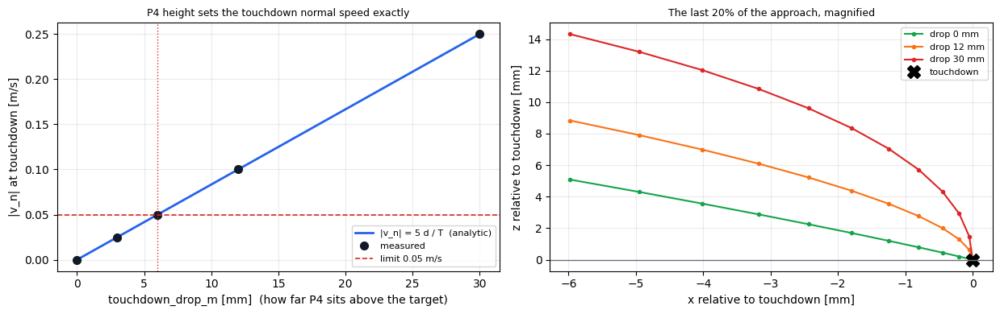

In [50]:
drops_mm = np.linspace(0.0, 30.0, 61)
duration_s = step8_demo_request.swing_duration_s
analytic_mps = 5.0 * (drops_mm * 1e-3) / duration_s
limit_mps = step8_demo_request.constraints.touchdown_normal_speed_max_mps

fig, axes = plt.subplots(1, 2, figsize=(12.5, 4.0))
axes[0].plot(drops_mm, analytic_mps, '-', color='#2563eb', lw=2.0,
             label='|v_n| = 5 d / T  (analytic)')
measured = pd.DataFrame(step8_drop_rows)
axes[0].plot(measured['touchdown_drop_mm'], measured['v_n_mps'].abs(), 'o', ms=7,
             color='#111827', label='measured')
axes[0].axhline(limit_mps, color='#dc2626', ls='--', lw=1.2,
                label=f'limit {limit_mps:.2f} m/s')
axes[0].axvline(limit_mps * duration_s / 5.0 * 1e3, color='#dc2626', ls=':', lw=1.0)
axes[0].set_xlabel('touchdown_drop_m [mm]  (how far P4 sits above the target)')
axes[0].set_ylabel('|v_n| at touchdown [m/s]')
axes[0].set_title('P4 height sets the touchdown normal speed exactly', fontsize=9)
axes[0].legend(fontsize=8); axes[0].grid(True, alpha=0.25)

for drop_m, colour in ((0.0, '#16a34a'), (0.012, '#f97316'), (0.030, '#dc2626')):
    path = generate_terrain_aware_swing_path_2d(step8_demo_request, touchdown_drop_m=drop_m)
    positions = path.positions_world_xz_m
    tail = positions[-12:]
    axes[1].plot((tail[:, 0] - positions[-1, 0]) * 1e3, (tail[:, 1] - positions[-1, 1]) * 1e3,
                 '-o', ms=3, color=colour, label=f'drop {drop_m * 1e3:.0f} mm')
axes[1].plot(0, 0, 'kX', ms=11, label='touchdown')
axes[1].axhline(0.0, color='#6b7280', lw=1.0)
axes[1].set_xlabel('x relative to touchdown [mm]')
axes[1].set_ylabel('z relative to touchdown [mm]')
axes[1].set_title('The last 20% of the approach, magnified', fontsize=9)
axes[1].legend(fontsize=8); axes[1].grid(True, alpha=0.25)
fig.tight_layout()
plt.show()

In [51]:
# valid=True 的唯一入口守得住嗎：跳過 Step 6 / Step 7 都會被擋。
step8_skip_request = day8_9_requests['A flat -> flat']
step8_path_only, _ = solve_swing_joint_trajectory_2d(
    generate_terrain_aware_swing_path_2d(step8_skip_request))
try:
    validate_swing_touchdown_velocity_2d(step8_path_only)
except ValueError as error:
    print('跳過 Step 6 ->', error)

step8_collision_only, _, _ = check_swing_trajectory_collisions_2d(
    step8_path_only, arc_samples=61)
try:
    validate_swing_touchdown_velocity_2d(step8_collision_only)
except ValueError as error:
    print('跳過 Step 7 ->', error)

print()
print('照順序走完才拿得到：')
step8_ok, _, _ = validate_swing_touchdown_2d(step8_collision_only)
step8_final, _ = validate_swing_touchdown_velocity_2d(step8_ok)
print(f'  valid = {step8_final.valid}, failure = {step8_final.failure.value}')

跳過 Step 6 -> cannot decide validity: the trajectory has not been collision-checked (Step 6).


跳過 Step 7 -> cannot decide validity: the touchdown contact state has not been validated (Step 7).

照順序走完才拿得到：
  valid = True, failure = NONE


In [52]:
day8_9_step8_frames_csv = day8_9_dir / 'day8_9_step8_flat_to_flat_frames.csv'
day8_9_step8_summary_csv = day8_9_dir / 'day8_9_step8_flat_to_flat_summary.csv'
day8_9_step8_velocity_csv = day8_9_dir / 'day8_9_step8_touchdown_velocity.csv'

frames_path, summary_path = write_swing_result_csv(
    step8_results['A flat -> flat'], day8_9_step8_frames_csv, day8_9_step8_summary_csv)
step8_table.to_csv(day8_9_step8_velocity_csv)
for path in (frames_path, summary_path, day8_9_step8_velocity_csv):
    print(f'{path.relative_to(project_root)}  ({path.stat().st_size} bytes)')

display(pd.DataFrame([swing_result_summary_row(step8_results['A flat -> flat'])]).T.rename(
    columns={0: 'A flat -> flat'}).head(14))

hybrid_note/notes/day8-9/day8_9_step8_flat_to_flat_frames.csv  (23451 bytes)
hybrid_note/notes/day8-9/day8_9_step8_flat_to_flat_summary.csv  (915 bytes)
hybrid_note/notes/day8-9/day8_9_step8_touchdown_velocity.csv  (880 bytes)


,A flat -> flat
valid,True
failure,NONE
failure_sample_index,None
failure_detail,None
sample_count,101
apex_z_m,0.03
minimum_terrain_clearance_mm,1.022021
final_contact_error_mm,0.004881
final_alpha_error_deg,0.0
final_rim,foot_rim


## 23. Step 8 完成標準對照

| 規劃要求 | 狀態 | 證據 |
| --- | --- | --- |
| 第一版使用 near-zero touchdown velocity | 完成 | 端點速度在構造上恰為 0（解析 hodograph） |
| 檢查 terrain normal velocity | 完成 | 對落地面的外法向投影，門檻 0.05 m/s |
| 輸出 touchdown Cartesian velocity 與 normal / tangential 分量 | 完成 | `TouchdownVelocity2D`，並填入契約的兩個欄位 |
| 可依 threshold 判斷 valid / invalid | 完成 | drop 6 mm 剛好通過、12 mm 判 `TOUCHDOWN_VELOCITY_TOO_HIGH` |
| （選配）tangential 與 body velocity matching | 部分 | 量出 `tangential_mismatch_mps`，但不判定；留給 Day 9 選配 |

額外補上的（規劃 §8 要求但 Step 2 漏掉的）：`liftoff_rise_m` / `touchdown_drop_m`，
讓 P1 / P4 能垂直移動，否則 touchdown 法向速度在構造上永遠是 0。

---

## Day 8–9 最終完成標準

規劃書寫的是：

> 同一個 `generate_swing()` 只修改 `SwingTarget`，即可產生不同 touchdown height 的
> collision-free、IK-feasible contact-state-to-contact-state swing trajectory，
> 不需要依 terrain height 切換 gait logic。

拆成兩半來看：

**「同一套 logic、不切換 gait」— 完全成立。**
五個 case（flat→flat、flat→20、flat→40、40→flat、中間有障礙）
走的是同一組函式呼叫，差別只在 `SwingTarget2D`。沒有任何一處對 terrain height 分支。

**「collision-free」— 五個裡有兩個。**
C / D / E 在飛行途中撞上障礙物前緣或頂面。這**不是高度造成的**：
後來把障礙物從 x = 0.10 移到 x = 0.20（起點退後），同樣 40 mm 的 case 就完全乾淨。
真正的原因是**起點離障礙物太近**——輪半徑 145 mm 比「接觸點到障礙物的距離」還大。

所以最終狀態是：**planner 是通用的，case 集合裡有三個不可行的請求，而且管線正確地把它們判為不可行。**
這比「五個都通過」更有價值——一個永遠回傳成功的檢查器沒有用。

## 24. Step 9 — 單一入口與 regression case set

前面八步刻意是八個獨立模組：每一步負責一個問題，可以單獨讀、單獨測、單獨怪罪。
但規劃書的最終完成標準講的是**一個**入口：

> 同一個 `generate_swing()` 只修改 `SwingTarget`，即可產生不同 touchdown height 的
> collision-free、IK-feasible contact-state-to-contact-state swing trajectory，
> 不需要依 terrain height 切換 gait logic。

所以 Step 9 把 Step 3–8 組成 `generate_swing_2d()`，並用一組固定的 case 把這個宣稱釘住。

`SwingPlan2D` 同時帶回最終 `result` 與每一步自己的報告——
`result` 是答案，其餘是理由。早期步驟失敗時，後面的報告是 `None`，
因為一個 ill-posed 的 request 根本沒有軌跡可以檢查。

In [53]:
step9_feasible = feasible_regression_cases_2d()
step9_plans = {name: generate_swing_2d(request, arc_samples=61)
               for name, request in step9_feasible.items()}

step9_table = pd.DataFrame([
    regression_row(name, plan) for name, plan in step9_plans.items()
]).set_index('case')
display(step9_table.T)

case,A flat -> flat,B flat -> 20 mm top,C flat -> 40 mm top,D 40 mm top -> flat,E flat -> flat over a 40 mm step
planner,generate_swing_2d,generate_swing_2d,generate_swing_2d,generate_swing_2d,generate_swing_2d
endpoint_error_mm,0.0,0.0,0.0,0.0,0.0
duration_error_s,0.0,0.0,0.0,0.0,0.0
ik_converged,51/51,51/51,51/51,51/51,51/51
max_ik_residual_um,9.507129,7.831845,4.426691,4.444046,6.608861
joint_limits_ok,True,True,True,True,True
max_joint_step_deg,1.787337,1.811517,1.864265,1.864271,2.980577
collision_free,True,True,True,True,True
min_clearance_mm,1.020191,1.177463,1.193266,1.193265,2.126071
touchdown_state_ok,True,True,True,True,True


### 讀表：規劃書列的七項檢查

| # | 規劃要求 | 表中欄位 |
| --- | --- | --- |
| 1 | same planner logic | `planner`：五個 case 都是 `generate_swing_2d` |
| 2 | endpoint correctness | `endpoint_error_mm` = 0，`duration_error_s` = 0 |
| 3 | IK feasibility | `ik_converged` 全滿，`max_ik_residual_um` < 10 |
| 4 | joint limits | `joint_limits_ok`，`max_joint_step_deg` 遠低於 10° 上限 |
| 5 | collision-free | `collision_free`，`min_clearance_mm` > 1 mm |
| 6 | correct touchdown state | `touchdown_state_ok`，`final_alpha_error_deg` = 0 |
| 7 | touchdown velocity | `touchdown_normal_mps` = 0，`touchdown_velocity_ok` |

五個 case 全部 `VALID = True`。

**這組幾何跟 §5–§18 用的那組不同**，差別只有一個參數：起點離障礙物前緣的距離
（0.10 m → 0.20 m）。§18 那三個撞到的 case，撞的原因是**輪半徑 145 mm 比「接觸點到障礙物的距離」還大**，
不是高度。所以 regression 用的是退後之後的幾何，而把「靠太近」保留成下面的負向案例。

In [54]:
step9_rejected = rejected_regression_cases_2d()
step9_rejected_rows = []
for name, (request, expected) in step9_rejected.items():
    plan = generate_swing_2d(request, arc_samples=61)
    step9_rejected_rows.append({
        'must be refused': name,
        'expected': expected.value,
        'reported': plan.failure.value,
        'matches': plan.failure is expected,
        'VALID': plan.valid,
        'collision_free': None if plan.collision is None else plan.collision.collision_free,
        'min_clearance_mm': None if plan.collision is None or plan.collision.minimum_clearance_m is None
                            else round(plan.collision.minimum_clearance_m * 1e3, 2),
        'ik': None if plan.joint_report is None
              else f"{plan.joint_report['ik_converged_count']}/{plan.result.sample_count}",
    })
display(pd.DataFrame(step9_rejected_rows).set_index('must be refused').T)

must be refused,start closer to the step than the wheel radius,reaching too far across the step,apex beyond the theta limit
expected,TERRAIN_COLLISION,TERRAIN_COLLISION,IK_NOT_CONVERGED
reported,TERRAIN_COLLISION,TERRAIN_COLLISION,IK_NOT_CONVERGED
matches,True,True,True
VALID,False,False,False
collision_free,False,False,True
min_clearance_mm,-2.64,-4.38,2.59
ik,51/51,51/51,28/51


### 讀表：為什麼 regression 一定要有負向案例

一個永遠回傳成功的檢查器沒有用。上面三個 case 分別打中**不同的機制**：

| case | 失敗機制 |
| --- | --- |
| 起點比輪半徑更靠近台階 | 輪胎已經在垂直面裡（Step 6 的反例） |
| 跨得太遠 | 腿在最高點過度伸展，壓進頂面 |
| apex 超過 θ 極限 | θ 卡在 17° 機構下限，IK 不收斂（這個 case 是 collision-free 的） |

如果哪天有人不小心讓 collision check 或 touchdown check 失效，
上面那張全過的表**不會有任何反應**，但這張表會。

In [55]:
# 規劃書那句話的字面驗證：同一個 terrain、同一個 start，只換 SwingTarget。
step9_obstacle = {
    'obstacle_x_start_m': 0.20, 'obstacle_width_m': 0.45,
    'obstacle_height_m': 0.04, 'obstacle_id': 'day8_9_regression_obstacle',
    'arc_samples': 241,
}
step9_start_scene = build_leg_on_surface_scene_2d(np.deg2rad(60.0), 0.0, 0.00, 0.00,
                                                  **step9_obstacle)
step9_target_scenes = [
    build_leg_on_surface_scene_2d(np.deg2rad(60.0), 0.0, hip_x, 0.04, **step9_obstacle)
    for hip_x in (0.36, 0.42, 0.48, 0.54)
]

step9_same_terrain_plans = []
for target_scene in step9_target_scenes:
    request = replace(
        build_swing_request_2d(step9_start_scene, target_scene, clearance_m=0.03),
        sample_count=51,
    )
    assert request.terrain == step9_start_scene.terrain        # 同一個地形物件
    assert np.allclose(request.start.contact_point_world_xz_m,
                       step9_start_scene.geometry.points_world_xz_m[
                           np.argmin(step9_start_scene.geometry.points_world_xz_m[:, 1])],
                       atol=1e-3)                              # 同一個起始接觸
    step9_same_terrain_plans.append((target_scene, generate_swing_2d(request, arc_samples=61)))

display(pd.DataFrame([
    {'target hip x [m]': scene.hip_pose.position_world_xz_m[0],
     'touchdown x [mm]': plan.result.samples[-1].position_world_xz_m[0] * 1e3,
     'apex [mm]': plan.apex.apex_height_m * 1e3,
     'theta range [deg]': f"{plan.joint_report['theta_min_deg']:.1f} - "
                          f"{plan.joint_report['theta_max_deg']:.1f}",
     'min clearance [mm]': round(plan.collision.minimum_clearance_m * 1e3, 2),
     'VALID': plan.valid}
    for scene, plan in step9_same_terrain_plans
]).set_index('target hip x [m]'))

,touchdown x [mm],apex [mm],theta range [deg],min clearance [mm],VALID
target hip x [m],,,,,
0.36,360.0,70.000001,32.9 - 60.3,1.19,True
0.42,420.0,70.000001,32.9 - 60.4,1.09,True
0.48,480.0,70.000001,32.9 - 60.5,1.61,True
0.54,540.0,70.000001,32.9 - 60.6,1.23,True


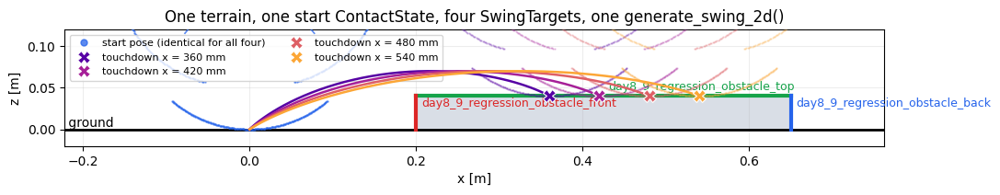

In [56]:
fig, ax = plt.subplots(figsize=(11.5, 4.6))
plot_terrain_profile_2d(step9_start_scene.terrain, ax=ax,
                        x_limits_m=scene_x_limits(step9_start_scene,
                                                  step9_target_scenes[-1]))
draw_leg(ax, step9_start_scene, '#2563eb', 'start pose (identical for all four)',
         alpha=0.75, linewidth=1.2)
colours = plt.cm.plasma(np.linspace(0.15, 0.8, len(step9_same_terrain_plans)))
for colour, (target_scene, plan) in zip(colours, step9_same_terrain_plans):
    path = plan.result.positions_world_xz_m
    ax.plot(path[:, 0], path[:, 1], '-', color=colour, lw=1.8, zorder=8)
    ax.plot(path[-1, 0], path[-1, 1], 'X', ms=10, color=colour, mec='white', mew=0.8,
            zorder=10, label=f'touchdown x = {path[-1, 0] * 1e3:.0f} mm')
    draw_leg(ax, target_scene, colour, None, alpha=0.28, linewidth=0.8)
ax.set_aspect('equal', adjustable='box')
ax.grid(True, alpha=0.22)
ax.legend(fontsize=8, loc='upper left', ncol=2)
ax.set_xlabel('x [m]'); ax.set_ylabel('z [m]')
ax.set_title('One terrain, one start ContactState, four SwingTargets, one generate_swing_2d()')
plt.show()

### 一個 Step 9 才浮出來的耦合

第一版的 regression 測試用 `sample_count = 21`，結果「apex 超過 θ 極限」那個 case
回報的是 `JOINT_DISCONTINUITY` 而不是 `IK_NOT_CONVERGED`。

原因是 `max_joint_step_rad` 是**每個 sample** 的限制，所以它跟 `sample_count` 綁在一起：
同一條軌跡取樣密一倍，每步就少一半。

```text
              21 samples   31    51    81
apex 超限        12.15°   8.61  5.16  3.28     <- 10° 上限只在 21 時被觸發
case A–E          4.14    2.88  1.79  1.14
```

兩個回報都是對這個壞 request 的真話，管線回報最早發生的那個。但這代表
**「取樣密度」是 case 的一部分，不是可以在底下任意更動的旋鈕**——
所以 regression 的 request 自己帶著 `sample_count`。

順手補上的：Step 5 的報告現在同時給 `max_joint_speed_deg_s`，
那是取樣無關的量，不同 `sample_count` 的軌跡之間才可以互相比較。

## 25. Step 9 完成標準與 Day 8–9 總結

| 規劃要求 | 狀態 | 證據 |
| --- | --- | --- |
| Case A–E 全部建立 | 完成 | §24 五個 case |
| same planner logic | 完成 | 單一 `generate_swing_2d()`，無任何 terrain height 分支 |
| endpoint correctness | 完成 | 誤差 0，duration 誤差 0 |
| IK feasibility | 完成 | 全收斂，殘差 < 10 µm |
| joint limits | 完成 | 全在 [17°, 160°]，`max |dq|` 遠低於上限 |
| collision-free | 完成 | 五個 case 全部 collision-free |
| correct touchdown state | 完成 | rim / alpha / surface 全符 |
| touchdown velocity | 完成 | 法向速度 0，通過門檻 |

### Day 8–9 最終完成標準

> 同一個 `generate_swing()` 只修改 `SwingTarget`，即可產生不同 touchdown height 的
> collision-free、IK-feasible contact-state-to-contact-state swing trajectory，
> 不需要依 terrain height 切換 gait logic。

**成立。** §24 最後一格是它的字面驗證：同一個地形、同一個起始 ContactState、
四個不同落點，同一個函式呼叫，全部 `VALID = True`。

### 但有一件事比「通過」更值得記住

§5–§18 用的那組幾何，五個 case 有三個撞。§24 用的這組，五個全過。
**差別只有起點離障礙物前緣的距離：0.10 m → 0.20 m。**

輪半徑是 145 mm。當起點離台階比這還近，接觸點根本還沒動，輪胎就已經在垂直面裡了。
所以 swing 的可行性主要不是被 **touchdown height** 決定的，而是被
**approach geometry** 和 **hip trajectory** 決定的——而這兩件事在規劃書裡都被列為
Day 8–9 的**輸入**，不是它負責的東西。

這是 Day 8–9 最重要的結論，也直接指向 Day 10–11：
ROLL / SWING 的選擇不能只看「現在還能不能滾」，還要看
「以現在的 approach 幾何與 body trajectory，swing 打得出來嗎」。

---

# 26. Day 8–9 總結

## 26.1 一張圖看完整條管線

```text
輸入                                                          輸出
────────────────────────────────────                          ──────────────────────────
SwingStartState2D   起點 contact + theta/beta                  SwingResult2D
SwingTarget2D       落點 contact + clearance                     ├─ valid  (只有 Step 8 能設 True)
TerrainProfile2D    地形                                          ├─ failure / failure_sample_index
HipTrajectory2D     swing 期間 hip 怎麼走                         ├─ samples[]  逐格 Cartesian + joint + 檢查
swing_duration_s / sample_count                                  ├─ minimum_terrain_clearance
SwingConstraints2D  所有 tolerance 與 limit                       ├─ final_contact_error / final_alpha_error
        │                                                        ├─ final_rim / final_terrain_surface_id
        ▼                                                        └─ touchdown normal / tangential speed
   generate_swing_2d()
        │
        ├─ Step 3  terrain-aware apex      max(z_start, z_target, corridor 內的 obstacle top) + clearance
        ├─ Step 2  quintic Bezier          P0=start, P5=target, 端點速度由 P1 / P4 控制
        ├─ Step 5  rim-point IK 逐格解      warm start 前一格；不默默 clamp
        ├─ Step 6  full-leg collision       每格重建完整腿部幾何丟給 Day 3–5 checker
        ├─ Step 7  touchdown contact       重算 FK + 重跑 contact query，比對 rim / alpha / surface
        └─ Step 8  touchdown velocity      對落地面法向投影，並決定 valid
```

**整條管線沒有任何一處對 terrain height 分支。** 高度只透過
`SwingTarget2D.target_point_world_xz_m` 和地形查詢到的表面進來。

## 26.2 輸入與輸出參數

下表由 dataclass 內省產生，不是手寫的——欄位增減、改名都會反映在這裡，不會跟程式碼脫節。

In [57]:
day8_9_io = pd.DataFrame(swing_io_rows())
print('欄位總數：', len(day8_9_io))
display(day8_9_io.groupby(['role', 'group'], sort=False).size().rename('fields').to_frame())
display(day8_9_io[day8_9_io.role == 'input'].set_index(['group', 'field']))

欄位總數： 75


fields
role   group                             
input  SwingStartState2D                8
       SwingTarget2D                    5
       HipTrajectory2D                  2
       SwingConstraints2D              11
       SwingRequest2D                   7
       generate_swing_2d(...)           7
output SwingResult2D                   13
       SwingSample2D (per sample)      15
       SwingPlan2D                      7

role  \
group                  field                                   
SwingStartState2D      contact_point_world_xz_m        input   
                       rim                             input   
                       alpha_rad                       input   
                       terrain_surface_id              input   
                       theta_rad                       input   
                       beta_rad                        input   
                       hip_pose                        input   
                       gamma_rad                       input   
SwingTarget2D          target_point_world_xz_m         input   
                       target_rim                      input   
                       target_alpha_rad                input   
                       target_terrain_surface_id       input   
                       clearance_m                     input   
HipTrajectory2D        start_pose                      input   
                       end_pose                        input   
SwingConstraints2D     theta_min_rad                   input   
                       theta_max_rad                   input   
                       max_joint_step_rad              input   
                       ik_position_tolerance_m         input   
                       touchdown_position_tolerance_m  input   
                       touchdown_alpha_tolerance_rad   input   
                       touchdown_normal_speed_max_mps  input   
                       contact_tolerance_m             input   
                       collision_tolerance_m           input   
                       surface_position_tolerance_m    input   
                       min_terrain_clearance_m         input   
SwingRequest2D         start                           input   
                       target                          input   
                       terrain                         input   
                       hip_trajectory                  input   
                       swing_duration_s                input   
                       sample_count                    input   
                       constraints                     input   
generate_swing_2d(...) arc_samples                     input   
                       corridor_margin_m               input   
                       liftoff_fraction                input   
                       touchdown_fraction              input   
                       liftoff_rise_m                  input   
                       touchdown_drop_m                input   
                       mid_fractions                   input   

                                                                      type  
group                  field                                                
SwingStartState2D      contact_point_world_xz_m        NDArray[np.float64]  
                       rim                                           RimId  
                       alpha_rad                                     float  
                       terrain_surface_id                              str  
                       theta_rad                                     float  
                       beta_rad                                      float  
                       hip_pose                                  HipPose2D  
                       gamma_rad                                     float  
SwingTarget2D          target_point_world_xz_m         NDArray[np.float64]  
                       target_rim                                    RimId  
                       target_alpha_rad                              float  
                       target_terrain_surface_id                       str  
                       clearance_m                                   float  
HipTrajectory2D        start_pose                                HipPose2D  
                       end_pose                           HipPose2D | None  
SwingConstraints2D     theta_min_rad                      

In [58]:
display(day8_9_io[day8_9_io.role == 'output'].set_index(['group', 'field']))

role  \
group                      field                                    
SwingResult2D              request                         output   
                           samples                         output   
                           valid                           output   
                           failure                         output   
                           failure_sample_index            output   
                           failure_detail                  output   
                           minimum_terrain_clearance_m     output   
                           final_contact_error_m           output   
                           final_alpha_error_rad           output   
                           final_rim                       output   
                           final_terrain_surface_id        output   
                           touchdown_normal_speed_mps      output   
                           touchdown_tangential_speed_mps  output   
SwingSample2D (per sample) index                           output   
                           time_s                          output   
                           position_world_xz_m             output   
                           velocity_world_xz_mps           output   
                           alpha_rad                       output   
                           rim                             output   
                           theta_rad                       output   
                           beta_rad                        output   
                           gamma_rad                       output   
                           ik_converged                    output   
                           ik_residual_m                   output   
                           joint_step_rad                  output   
                           joint_limits_ok                 output   
                           collision_free                  output   
                           terrain_clearance_m             output   
SwingPlan2D                result                          output   
                           apex                            output   
                           endpoint_report                 output   
                           joint_report                    output   
                           collision                       output   
                           touchdown                       output   
                           velocity                        output   

                                                                                    type  
group                      field                                                          
SwingResult2D              request                                        SwingRequest2D  
                           samples                             tuple[SwingSample2D, ...]  
                           valid                                                    bool  
                           failure                                          SwingFailure  
                           failure_sample_index                               int | None  
                           failure_detail                                     str | None  
                           minimum_terrain_clearance_m                      float | None  
                           final_contact_error_m                            float | None  
                           final_alpha_error_rad                            float | None  
                           final_rim                                        RimId | None  
                           final_terrain_surface_id                           str | None  
                           touchdown_normal_speed_mps                       float | None  
                           touchdown_tangential_speed_mps                   float | None  
SwingSample2D (per sample) index                                                     int  
                           time_s                  

### 真正要調的旋鈕只有這些

上表 75 個欄位裡，大部分是資料而不是參數。實際會被調的是：

| 參數 | 屬於 | 意義 | 預設 | 影響 |
| --- | --- | --- | --- | --- |
| `target_point_world_xz_m` | SwingTarget2D | 落點世界座標，`z` 就是 touchdown height | — | 決定這是哪一種 case |
| `target_rim` / `target_alpha_rad` | SwingTarget2D | 落地時哪個輪上點接觸 | — | 決定下一段 rolling 的輪緣預算 |
| `clearance_m` | SwingTarget2D | apex 要高過最高障礙多少 | 30 mm | 太大 → θ 撞下限；太小 → 輪身撞地形 |
| `hip_trajectory` | SwingRequest2D | swing 期間 hip 的走法 | 起點 → 落點 | **決定 swing 高度上限的主要變數** |
| `swing_duration_s` | SwingRequest2D | 擺動時間 | 0.6 s | 只影響速度，不影響幾何 |
| `sample_count` | SwingRequest2D | 取樣密度 | 51 / 101 | 與 `max_joint_step_rad` 耦合（§24） |
| `touchdown_drop_m` | generate_swing_2d | P4 抬高多少 → 落地法向速度 | 0 | `|v_n| = 5 d / T` |
| `liftoff_rise_m` | generate_swing_2d | P1 抬高多少 → 起飛法向速度 | 0 | 同上 |
| `arc_samples` | generate_swing_2d | Step 6 每段輪弧的取樣數 | 121 | 影響碰撞偵測細節（§18） |
| `corridor_margin_m` | generate_swing_2d | apex corridor 加寬多少 | 0 | 邊界外的障礙物要不要算進來 |
| `max_joint_step_rad` | SwingConstraints2D | 相鄰 sample 的關節位移上限 | 10° | 每格限制，與取樣密度耦合 |
| `touchdown_normal_speed_max_mps` | SwingConstraints2D | 落地法向速度上限 | 0.05 m/s | Step 8 的判定門檻 |

其餘的 tolerance（contact / collision / IK / surface）都來自 Day 3–7 已經定好的慣例，
不建議在 Day 8–9 這一層改動。

## 26.3 動畫：一條完整的 swing

每一格都重建**完整的腿部幾何**——就是 Step 6 實際檢查的那份幾何，不是示意的簡圖。
左下角同時顯示決定判定的那幾個量，所以失敗可以**看著它發生**，而不只是事後讀報告。

In [59]:
day8_9_anim_case = 'C flat -> 40 mm top'
day8_9_anim_plan = step9_plans[day8_9_anim_case]
day8_9_animation = animate_swing_2d(
    day8_9_anim_plan, interval_ms=120, frame_stride=2, arc_samples=121)
print(f'{day8_9_anim_case}: valid = {day8_9_anim_plan.valid}, '
      f'failure = {day8_9_anim_plan.failure.value}, '
      f'min clearance = {day8_9_anim_plan.collision.minimum_clearance_m * 1e3:.2f} mm')
display(HTML(day8_9_animation.to_jshtml()))
plt.close(day8_9_animation._fig)

C flat -> 40 mm top: valid = True, failure = NONE, min clearance = 1.19 mm


### 對照：一條會撞的 swing

同樣的高度（40 mm）、同樣的落點高度，只是**起點離台階近了 100 mm**。
接觸點（綠色 X）全程在障礙物之上，但腿身在中段變紅——那是它插進前緣垂直面的時刻。

In [60]:
day8_9_bad_request = rejected_regression_cases_2d()['start closer to the step than the wheel radius'][0]
day8_9_bad_plan = generate_swing_2d(day8_9_bad_request, arc_samples=61)
day8_9_bad_animation = animate_swing_2d(
    day8_9_bad_plan, interval_ms=120, frame_stride=2, arc_samples=121)
print(f'valid = {day8_9_bad_plan.valid}, failure = {day8_9_bad_plan.failure.value} '
      f'at sample {day8_9_bad_plan.result.failure_sample_index}')
print(f'  {day8_9_bad_plan.collision.collision_detail}')
display(HTML(day8_9_bad_animation.to_jshtml()))
plt.close(day8_9_bad_animation._fig)

valid = False, failure = TERRAIN_COLLISION at sample 5
  vertical_face_collision on day8_9_regression_obstacle_front (0.29 mm)


## 26.4 九個 Step 的完成狀態

| Step | 完成標準 | 結果 |
| --- | --- | --- |
| 1 契約 | flat-to-flat 通過 data validation | 五個 case 全 well-posed |
| 2 Bezier | 同一 generator、endpoint / duration 正確 | endpoint 誤差 0，apex 差 1e-17 |
| 3 apex | 中間有障礙時自動提高 | 穿透取樣點 25 → 0 |
| 4 rim-point IK | 已知 FK 可重建，residual 在容忍內 | 45 個 case 全收斂，< 10 µm |
| 5 joint trajectory | 各高度都輸出連續 joint trajectory | 101/101 收斂，max `|dq|` 1.2° |
| 6 collision | 造出「點過得去、本體撞」的反例 | case C：接觸點離障礙 95 mm，輪子已在裡面 |
| 7 touchdown state | 只有真正落到指定 ContactState 才 success | 三個壞 target 全被拒絕 |
| 8 touchdown velocity | 輸出分量並依 threshold 判定 | 6 mm 過、12 mm 拒；`valid=True` 首次出現 |
| 9 regression | A–E 全部檢查七項 | 五個可行全過，三個負向全被正確拒絕 |

**Day 8–9 最終完成標準成立**：同一個 `generate_swing_2d()`，同一個地形、同一個起始
ContactState，只更換 `SwingTarget2D`，四個不同落點全部 `VALID = True`，
沒有任何一處依 terrain height 切換 logic。

## 26.5 這九步裡被數據推翻的六件事

這些比「全部通過」更值得留在紀錄裡：

1. **兩套 rim 幾何差 1.2 mm**（Step 4）。`LegModel.rim_point` 用 0.145 m，
   Day 3–7 接觸管線用的繪圖弧在 upper rim 是 0.1438 m——差值來自繪圖 clearance `c = 0.0012`，
   而它大於 1 mm 的 contact tolerance。**已量化記錄，沒有修**（修了會動到 Day 3–7 所有結果）。
2. **α 參數在縫上會瞬移**（Step 7）。±40° 跳 45 mm、±180° 跳 162 mm。
   推翻了 §10「rim transition 不需要特判」——對參數成立，對幾何不成立。
3. **Step 2 曾經不保證落地接觸狀態等於 target**（Step 7 發現）。它把 target 的 rim 丟掉、
   從 α 重新推導，在縫上會規劃到 45 mm 外的另一個點。**已修**。
4. **Step 2 的 P4 只能水平移動**（Step 8 發現），touchdown 法向速度在構造上恆為 0，
   規劃 §8 要求的一半沒實作。**已補** `liftoff_rise_m` / `touchdown_drop_m`。
5. **連續性限制與取樣密度耦合**（Step 9 發現）。`max_joint_step_rad` 是每格限制，
   同一條軌跡取樣密一倍就少一半。**已註明並補上取樣無關的 `max_joint_speed_deg_s`**。
6. **swing 的可行性主要不由 touchdown height 決定**。§5–§18 那組幾何五個 case 撞三個，
   §24 這組五個全過，差別只有起點離台階的距離 0.10 m → 0.20 m。
   輪半徑 145 mm 比「接觸點到障礙物的距離」還大時，接觸點還沒動輪胎就進去了。

## 26.6 明確沒做的事

```text
ROLL / SWING 選擇          Day 10–11
four-leg gait timing       之後
support polygon            之後
ABAD (gamma) 優化          Day 13–14；本版固定 gamma = 0、hip pitch = 0
energy / trajectory 優化   不在範圍
online replanning          不在範圍
1.2 mm rim 幾何差異        只記錄，未修
Bezier 控制點的完整優化    §27 做了針對碰撞的最小修復，不是通用 optimizer
```

## 26.7 交給 Day 10–11 的三個發現

1. **ROLL 與 SWING 的強弱是互補的，而且分在 traversal 的不同階段。**
   Day 6–7 的 sweep：160 mm 障礙的 `roll_up` 是 10/10，`roll_down` 是 0/10。
   swing 這邊反過來——上升受 hip 高度與垂直面雙重限制，下降只要 hip 別急著下降就能到 160 mm。
   所以切換點在**下降側**，不在上升側。

2. **hip trajectory 是決定 swing 能力的主要變數**，而規劃書把它列為 Day 8–9 的**輸入**。
   換句話說，swing 的可行性有很大一部分不在 swing planner 手上。

3. **decision rule 不能只是「現在還能不能滾」。** 還要看
   「以現在的 approach 幾何與 body trajectory，swing 打不打得出來」——
   因為 §26.5 第 6 點顯示，同樣的落點高度可以因為起點位置而可行或不可行。

---

# 27. 附錄：揮腳撞到障礙物時怎麼修

規劃書 §14 把 "Bezier control-point optimization" 列在「Day 8–9 不做」裡，
所以 §18 那三個撞到的 case 原本是留給 Day 10–11 的。這一節把它們就地解決，
理由是量測顯示**根本不需要 optimizer**——失敗有清楚的結構，兩個旋鈕就夠。

## 27.1 兩個關鍵觀察

**(a) 碰撞發生在軌跡的哪一端，決定要動哪個旋鈕。**

```text
C flat->40mm   首次碰撞 sample  3/30  (s=0.10)  -> 起飛側
E 中間有障礙    首次碰撞 sample  2/30  (s=0.07)  -> 起飛側
D 40mm->flat   首次碰撞 sample 25/30  (s=0.83)  -> 落地側
```

起飛側撞，是腿站在台階旁邊、還沒抬起來就往前畫弧 → 用 `liftoff_rise_m`（先垂直抬起）。
落地側撞，是腿往下伸進它正要離開的那個面 → 用 `touchdown_drop_m`（從上方進場）。

實測 `clearance`、`mid_fractions`、`corridor_margin` **都沒用**，因為它們動的是軌跡中段，而碰撞在兩端。

**(b) 碰撞與時間可以分離。**

Bezier 的控制點只由位置決定，不依賴 `swing_duration_s`。把 swing 拉長不會改變它撞到什麼，
只會改變它多快抵達。所以修復可以分成兩個獨立階段：

```text
階段 1（純幾何）  升高端點控制點，直到 collision-free —— 完全不用管時間
階段 2（純時間）  只有 touchdown drop 會付出法向速度代價，而且是 |v_n| = 5d/T
                  所以最短 duration 有閉式解，不需要搜尋
```

In [61]:
step27_theta = np.deg2rad(60.0)
step27_close = {'obstacle_x_start_m': 0.10, 'obstacle_width_m': 0.35,
                'obstacle_height_m': 0.04, 'obstacle_id': 'day8_9_obstacle',
                'arc_samples': 241}
step27_gap = dict(step27_close, obstacle_width_m=0.15)


def step27_request(start_hip_x, start_z, target_hip_x, target_z, terrain):
    start = build_leg_on_surface_scene_2d(step27_theta, 0.0, start_hip_x, start_z, **terrain)
    target = build_leg_on_surface_scene_2d(step27_theta, 0.0, target_hip_x, target_z, **terrain)
    return replace(build_swing_request_2d(start, target, clearance_m=0.03), sample_count=31)


step27_cases = {
    'C flat -> 40 mm（起點靠太近）': step27_request(0.00, 0.00, 0.20, 0.04, step27_close),
    'D 40 mm -> flat（起點靠太近）': step27_request(0.20, 0.04, 0.00, 0.00, step27_close),
    'E flat -> flat（中間有障礙）': step27_request(0.00, 0.00, 0.40, 0.00, step27_gap),
}
step27_repairs = {name: repair_swing_2d(request, arc_samples=61)
                  for name, request in step27_cases.items()}

display(pd.DataFrame([
    dict(repair.as_dict(), case=name) for name, repair in step27_repairs.items()
]).set_index('case').T)

case,C flat -> 40 mm（起點靠太近）,D 40 mm -> flat（起點靠太近）,E flat -> flat（中間有障礙）
repaired,True,True,True
liftoff_rise_mm,20.0,0.0,80.0
touchdown_drop_mm,0.0,20.0,0.0
duration_s,0.6,2.0,0.6
original_duration_s,0.6,0.6,0.6
duration_was_extended,False,True,False
attempts,3,3,6
valid,True,True,True
failure,NONE,NONE,NONE
reason,None,None,None


In [62]:
for name, repair in step27_repairs.items():
    print(f'--- {name} ---')
    display(pd.DataFrame([attempt.as_dict() for attempt in repair.attempts]))

--- C flat -> 40 mm（起點靠太近） ---


,liftoff_rise_mm,touchdown_drop_mm,collision_free,min_clearance_mm,first_collision_index,collision_side
0,0.0,0.0,False,-1.692367,3.0,liftoff
1,10.0,0.0,False,-0.320550,3.0,liftoff
2,20.0,0.0,True,1.332863,NaN,None


--- D 40 mm -> flat（起點靠太近） ---


,liftoff_rise_mm,touchdown_drop_mm,collision_free,min_clearance_mm,first_collision_index,collision_side
0,0.0,0.0,False,-1.692369,25.0,touchdown
1,0.0,10.0,False,-0.320554,27.0,touchdown
2,0.0,20.0,True,1.332861,NaN,None


--- E flat -> flat（中間有障礙） ---


,liftoff_rise_mm,touchdown_drop_mm,collision_free,min_clearance_mm,first_collision_index,collision_side
0,0.0,0.0,False,-9.868811,2.0,liftoff
1,10.0,0.0,False,-7.816574,2.0,liftoff
2,20.0,0.0,False,-6.189611,2.0,liftoff
3,30.0,0.0,False,-3.714340,2.0,liftoff
4,50.0,0.0,False,-0.768944,2.0,liftoff
5,80.0,0.0,True,1.614060,NaN,None


### 讀表：三個 case 全部修好，過程完全可讀

| case | 碰撞側 | 用的旋鈕 | duration |
| --- | --- | --- | --- |
| C flat → 40 mm | 起飛 | `liftoff_rise_m` = 20 mm | 0.6 s 不變 |
| D 40 mm → flat | 落地 | `touchdown_drop_m` = 20 mm | **0.6 → 2.0 s** |
| E 中間有障礙 | 起飛 | `liftoff_rise_m` = 80 mm | 0.6 s 不變 |

C 和 D 的餘裕序列一模一樣（−1.69 → −0.32 → +1.33 mm），因為 D 就是 C 反過來走。
E 需要爬到 80 mm 才過——它要跨過整個障礙物，不只是走上去。

`liftoff_rise_m` 幾乎不吃關節預算（θ_min 從 32.9° 只掉到 32.0°），
不像加大 clearance 那樣會把 θ 推到 17° 下限（實測 70 mm 就 IK 掛掉）。

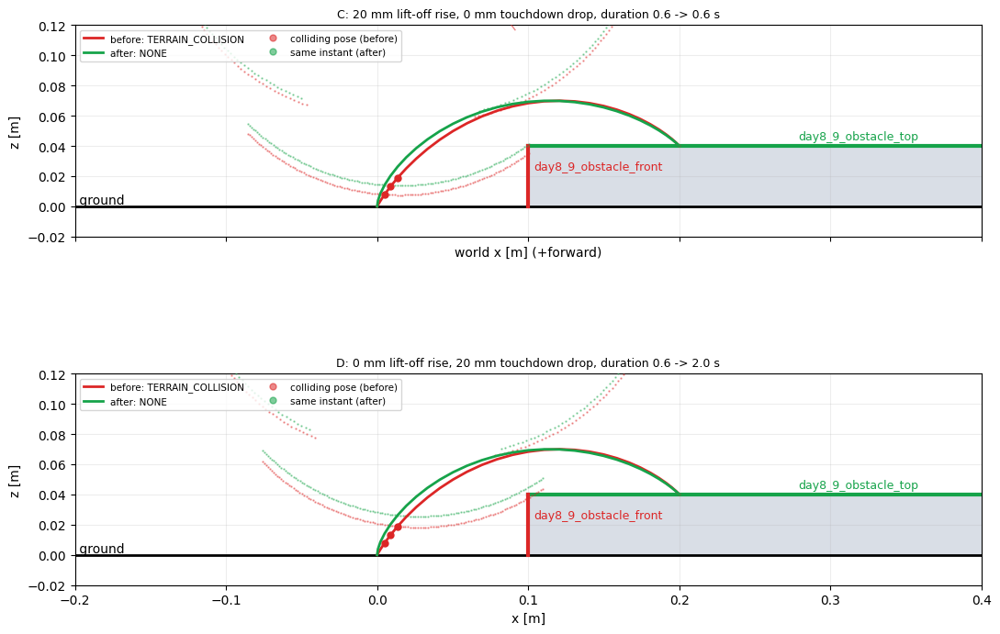

In [63]:
fig, axes = plt.subplots(2, 1, figsize=(11, 8.2), sharex=True)
for ax, (name, key) in zip(axes, (('C flat -> 40 mm（起點靠太近）', 'C'),
                                  ('D 40 mm -> flat（起點靠太近）', 'D'))):
    repair = step27_repairs[name]
    before = generate_swing_2d(step27_cases[name], arc_samples=61)
    after = repair.plan
    terrain = step27_cases[name].terrain

    x_all = np.vstack([before.result.positions_world_xz_m, after.result.positions_world_xz_m])
    plot_terrain_profile_2d(terrain, ax=ax,
                            x_limits_m=(x_all[:, 0].min() - 0.20, x_all[:, 0].max() + 0.20))

    for plan, colour, label in ((before, '#dc2626', 'before'), (after, '#16a34a', 'after')):
        path = plan.result.positions_world_xz_m
        ax.plot(path[:, 0], path[:, 1], '-', color=colour, lw=2.0, zorder=8,
                label=f'{label}: {plan.failure.value}')
        bad = [s.index for s in plan.result.samples if s.collision_free is False]
        if bad:
            ax.plot(path[bad, 0], path[bad, 1], 'o', ms=5, color=colour, zorder=9)
    # 畫出「碰撞當下」的腿姿態，證明修的是腿身而不是曲線好看
    bad_index = before.collision.first_collision_index
    bad_scene = swing_sample_scene_2d(before.result, before.result.samples[bad_index],
                                      arc_samples=121)
    draw_leg(ax, bad_scene, '#dc2626', 'colliding pose (before)', alpha=0.55, linewidth=1.0)
    good_scene = swing_sample_scene_2d(after.result, after.result.samples[bad_index],
                                       arc_samples=121)
    draw_leg(ax, good_scene, '#16a34a', 'same instant (after)', alpha=0.55, linewidth=1.0)

    ax.set_aspect('equal', adjustable='box')
    ax.grid(True, alpha=0.22)
    ax.legend(fontsize=7.5, loc='upper left', ncol=2)
    ax.set_ylabel('z [m]')
    ax.set_title(
        f'{key}: {repair.liftoff_rise_m * 1e3:.0f} mm lift-off rise, '
        f'{repair.touchdown_drop_m * 1e3:.0f} mm touchdown drop, '
        f'duration {repair.original_duration_s:.1f} -> {repair.swing_duration_s:.1f} s',
        fontsize=9)
axes[-1].set_xlabel('x [m]')
fig.tight_layout()
plt.show()

### 讀圖

紅色是修復前，綠色是修復後。圓點是實際落在地形內部的取樣點。
兩張圖都額外畫出**碰撞當下那一格的腿姿態**——修的是腿身的位置，不是把曲線畫得好看。

上圖（C）：紅線一離地就往前彎進台階前緣；綠線先垂直抬起再往前。
下圖（D）：紅線在接近地面時已經插進台階的前緣面；綠線從更高的地方進場。

## 27.2 D 揭露的一個結構性張力

用 `touchdown_drop_m` 解掉 D 的碰撞後，會換來 `TOUCHDOWN_VELOCITY_TOO_HIGH`——
因為 **P4 只有一個控制點，它同時決定「從多高進場」和「落地多快」**：

\[
|v_n| = \frac{5\,d}{T}
\]

所以「從夠高的地方進場」和「落地夠慢」是同一個參數的兩端，只能用時間換：

In [64]:
step27_limit = step27_cases['D 40 mm -> flat（起點靠太近）'].constraints.touchdown_normal_speed_max_mps
step27_drops_mm = np.array([10.0, 20.0, 30.0])
step27_durations = np.array([0.6, 1.2, 2.0, 3.0])

step27_grid = pd.DataFrame(
    [[f"{5.0 * (d * 1e-3) / T:.3f}" + (' OK' if 5.0 * (d * 1e-3) / T <= step27_limit else ' 超標')
      for d in step27_drops_mm] for T in step27_durations],
    index=[f'T = {T:.1f} s' for T in step27_durations],
    columns=[f'drop {d:.0f} mm' for d in step27_drops_mm],
)
display(step27_grid)
print(f'限制 |v_n| <= {step27_limit} m/s')
print(f'D 需要 20 mm 的 drop 才 collision-free，')
print(f'  -> 最短 duration = 5 x 0.020 / {step27_limit} = '
      f'{minimum_duration_for_touchdown_drop_s(0.020, step27_limit):.2f} s')

,drop 10 mm,drop 20 mm,drop 30 mm
T = 0.6 s,0.083 超標,0.167 超標,0.250 超標
T = 1.2 s,0.042 OK,0.083 超標,0.125 超標
T = 2.0 s,0.025 OK,0.050 OK,0.075 超標
T = 3.0 s,0.017 OK,0.033 OK,0.050 OK


限制 |v_n| <= 0.05 m/s
D 需要 20 mm 的 drop 才 collision-free，
  -> 最短 duration = 5 x 0.020 / 0.05 = 2.00 s


### 這個代價必須被看見，不能被吸收

把 swing 從 0.6 s 拉到 2.0 s **改變的是任務，不只是路徑**——
那是一個 gait timing 的決定，會影響四足的相位安排。

所以 `repair_swing_2d()` 用 `duration_was_extended` 明確回報這件事，
而且提供 `extend_duration=False` 與 `max_duration_s`，讓呼叫端可以說
「我不接受變慢」。那種情況下它會回報：

```text
collision-free, but landing from 20 mm up needs 2.00 s to stay under
the touchdown speed limit.
```

也就是**幾何有解、但時間預算不允許**——這跟「無解」是不同的答案，
Day 10–11 的 ROLL/SWING 選擇需要分得出來。

## 27.3 修得了什麼、修不了什麼

`repair_swing_2d()` **只處理 `TERRAIN_COLLISION`**。其他失敗它會直接拒絕並說明理由：

```text
IK_NOT_CONVERGED is not a collision; the endpoint knobs cannot repair it.
Change the hip trajectory or the approach geometry.
```

這條界線是有根據的，不是偷懶：

| 失敗 | 成因 | 該動什麼 |
| --- | --- | --- |
| `TERRAIN_COLLISION` | 端點附近的腿身姿態 | **端點控制點**（§27 處理） |
| `IK_NOT_CONVERGED` | apex 超出腿的可及範圍 | **hip trajectory** 或 approach 幾何 |
| `JOINT_DISCONTINUITY` | α 跨過輪弧的縫（§20） | 重新選 target rim/alpha，或改成兩段 swing |

後兩者動的都是 `SwingRequest2D` 的**輸入**，不是 planner 內部的旋鈕——
所以它們不該由 swing planner 自己決定，那是 Day 10–11 的層級。

## 27.4 一個值得記的巧合

`liftoff_rise_m` / `touchdown_drop_m` 是 **Step 8 才補上的**——當時是因為發現
Step 2 漏了垂直端點速度控制，法向速度檢查根本觸發不了（§22）。

結果它們順帶就是解 approach 碰撞的關鍵旋鈕。如果 Step 8 沒有逼出那個缺口，
這一節的結論會是「這些 case 無解，等 Day 10–11」。

---

# 28. 成果展示：輸入一個台階高度

前面每一節都是為了驗證某個 step。這一節把整套東西收成一個問題：

> **給我一個台階高度，揮得上去嗎？揮得上去就給我軌跡，揮不上去就告訴我為什麼。**

`swing_onto_step_2d(height)` 依照 Day 8–9 量到的**兩道天花板**依序處理：

```text
天花板 1  搆得到嗎   apex 要在腿的可及範圍內 —— 由 hip 高度決定
                     用 Steps 3–5 快速探測（跳過昂貴的碰撞檢查，因為這是 IK 決定的）
天花板 2  塞得下嗎   整條腿要閃過台階 —— 由端點控制點修（§27 那套）
```

每一項調整都會回報。特別是**抬 hip**：hip trajectory 是這個 planner 的**輸入**，
所以抬高它是對 body planner 的請求，不會被默默塞進答案裡。

In [65]:
# ============================================================
#  改這一個數字就好
# ============================================================
STEP_HEIGHT_MM = 150
# ============================================================

showcase = swing_onto_step_2d(
    STEP_HEIGHT_MM / 1000.0,
    sample_count=31,     # 展示用的取樣密度；驗證用的章節是 51 / 101
    arc_samples=61,
)
print(showcase.summary())
print()
display(pd.DataFrame([showcase.as_dict()]).T.rename(columns={0: f'{STEP_HEIGHT_MM} mm step'}))

150 mm step (onto): NO swing up -- IK stopped at residual 0.082 mm after 5 iterations. theta is pinned at its limit, so the target is out of reach.



,150 mm step
obstacle_mm,150.0
feasible,False
liftoff_rise_mm,20.0
touchdown_drop_mm,0.0
direction,onto
hip_lift_mm,40.0
duration_s,0.6
theta_min_deg,17.0
min_clearance_mm,1.751881
adjustments,hip raised 40 mm; lift-off raised 20 mm


In [66]:
showcase_animation = animate_step_swing_2d(showcase, interval_ms=120, frame_stride=2)
display(HTML(showcase_animation.to_jshtml()))
plt.close(showcase_animation._fig)

### 讀動畫

每一格畫的是**完整的腿部幾何**——就是 Step 6 實際拿去做碰撞檢查的那一份。
左下角同步顯示決定判定的量：θ / β、IK 殘差、關節位移、腿離地形多遠、速度、是否 collision-free。

綠色 X 是被規劃的接觸點，沿著黑色的 Bezier 曲線走。灰線是尚未走過的部分。
如果某一格撞到了，整條腿會變紅。

## 28.1 掃過一系列高度

同一個函式，只換高度。

In [67]:
showcase_heights_mm = (20, 60, 100, 120, 140, 160, 200)
showcase_results = {
    height_mm: swing_onto_step_2d(height_mm / 1000.0, sample_count=31, arc_samples=61)
    for height_mm in showcase_heights_mm
}

display(pd.DataFrame([
    result.as_dict() for result in showcase_results.values()
]).set_index('obstacle_mm'))

print()
for result in showcase_results.values():
    print(result.summary())

,feasible,liftoff_rise_mm,touchdown_drop_mm,direction,hip_lift_mm,duration_s,theta_min_deg,min_clearance_mm,adjustments,reason
obstacle_mm,,,,,,,,,,
20.0,True,0.0,0.0,onto,0.0,0.6,37.915880,1.439795,none,None
60.0,True,0.0,0.0,onto,0.0,0.6,27.907229,1.076729,none,None
100.0,True,0.0,0.0,onto,0.0,0.6,17.824151,1.556712,none,None
120.0,True,0.0,0.0,onto,20.0,0.6,19.193990,1.793822,hip raised 20 mm,None
140.0,True,0.0,0.0,onto,40.0,0.6,20.593629,1.048133,hip raised 40 mm,None
160.0,True,30.0,0.0,onto,60.0,0.6,19.914548,1.369107,hip raised 60 mm; lift-off raised 30 mm,None
200.0,False,120.0,0.0,onto,80.0,0.6,18.750949,-13.079820,hip raised 80 mm; lift-off raised 120 mm,still colliding at the largest endpoint offset...



20 mm step (onto): swing up found (no adjustment needed); theta down to 37.9 deg, clearance 1.44 mm, duration 0.60 s
60 mm step (onto): swing up found (no adjustment needed); theta down to 27.9 deg, clearance 1.08 mm, duration 0.60 s
100 mm step (onto): swing up found (no adjustment needed); theta down to 17.8 deg, clearance 1.56 mm, duration 0.60 s
120 mm step (onto): swing up found (hip raised 20 mm); theta down to 19.2 deg, clearance 1.79 mm, duration 0.60 s
140 mm step (onto): swing up found (hip raised 40 mm); theta down to 20.6 deg, clearance 1.05 mm, duration 0.60 s
160 mm step (onto): swing up found (hip raised 60 mm; lift-off raised 30 mm); theta down to 19.9 deg, clearance 1.37 mm, duration 0.60 s
200 mm step (onto): NO swing up -- still colliding at the largest endpoint offset tried (120 mm); this request needs a different approach geometry, not a different trajectory.


### 讀表：兩道天花板依序現形

```text
 20 – 100 mm   不用任何調整
    100 mm     theta 只剩 0.7 度餘裕 —— 這是「不調整」的極限
    120 mm     開始需要抬 hip（搆不到的問題）
140 – 160 mm   抬 hip 之外還要抬起飛（塞不下的問題）
    200 mm     搆得到了，但端點抬到 120 mm 仍然撞
```

注意抬 hip 之後 `theta_min` 反而**回升**到 19–20°：抬高 hip 把整個可及範圍往上平移，
所以腿不需要收得那麼緊。

200 mm 的失敗理由是具體的——「**這需要不同的 approach 幾何，不是不同的軌跡**」，
指向正確的修法（起點退後），而不是叫人去調軌跡參數。

## 28.2 「不行」也要看得見

一個只會說「infeasible」的規劃器沒辦法讓人相信。下面播的是 200 mm 那個失敗案例：
軌跡照樣算得出來（Bezier 不在乎機構），腿在中段變紅——那是輪胎插進台階前緣的時刻。

In [68]:
showcase_failed = showcase_results[200]
print(showcase_failed.summary())
print()
print('失敗理由：', showcase_failed.reason)
print('最深穿透：', f'{showcase_failed.minimum_clearance_m * 1e3:.2f} mm')

showcase_failed_animation = animate_step_swing_2d(
    showcase_failed, interval_ms=120, frame_stride=2)
display(HTML(showcase_failed_animation.to_jshtml()))
plt.close(showcase_failed_animation._fig)

200 mm step (onto): NO swing up -- still colliding at the largest endpoint offset tried (120 mm); this request needs a different approach geometry, not a different trajectory.

失敗理由： still colliding at the largest endpoint offset tried (120 mm); this request needs a different approach geometry, not a different trajectory.
最深穿透： -13.08 mm


### 這就是 Day 8–9 最後的樣子

一個通用的 swing primitive：輸入 contact state 到 contact state，輸出一條
被八個獨立檢查驗證過的軌跡，或是一個**具體到可以行動**的拒絕理由。

它不會假裝成功，也不會只說失敗——它會告訴你差在哪裡、以及該去動哪一個輸入。

---

# 29. 下來也要能揮：`swing_off_step_2d()`

`§28` 的入口叫 `swing_onto_step_2d`——名字就是「揮**上**台階」。
但下降一直都做得到：regression case set 的第四個 `D 40 mm top -> flat` 就是，
而且通過全部八道檢查。少的是**展示層**。

補上之後才發現一件比「完整性」重要的事：

> **下降不是把上升的符號反過來。兩者需要 body 做的事是相反的。**

```text
爬上去    hip 要「上升」    把可及範圍整個往上平移
走下來    hip 要「別跟著腳落下」
          腳必須伸到它正要離開的那個面以下，
          身體若跟著落，正好在最需要行程的時候把行程吃掉
```

所以下降的旋鈕是**保留多少落差**（0 / 25% / 50% / 75% / 100%），
而不是上升那邊的「抬高幾毫米」。程式上兩者共用同一個量
（「hip 最後比 naive 姿態高多少」），所以搜尋邏輯只有一份。

In [69]:
updown_heights_mm = (20, 60, 100, 120, 140, 160, 200)
updown_rows = []
updown_results = {}
for height_mm in updown_heights_mm:
    up = swing_onto_step_2d(height_mm / 1000.0, sample_count=31, arc_samples=61)
    down = swing_off_step_2d(height_mm / 1000.0, sample_count=31, arc_samples=61)
    updown_results[height_mm] = (up, down)
    updown_rows.append({
        'mm': height_mm,
        'UP': 'OK' if up.feasible else 'X',
        'UP theta_min': None if up.theta_min_deg is None else round(up.theta_min_deg, 1),
        'UP duration': up.swing_duration_s,
        'UP 調整': '; '.join(up.adjustments) or '-',
        'DOWN': 'OK' if down.feasible else 'X',
        'DOWN theta_min': None if down.theta_min_deg is None else round(down.theta_min_deg, 1),
        'DOWN duration': down.swing_duration_s,
        'DOWN 調整': '; '.join(down.adjustments) or '-',
    })
display(pd.DataFrame(updown_rows).set_index('mm'))

,UP,UP theta_min,UP duration,UP 調整,DOWN,DOWN theta_min,DOWN duration,DOWN 調整
mm,,,,,,,,
20,OK,37.9,0.6,-,OK,37.9,0.6,-
60,OK,27.9,0.6,-,OK,27.9,0.6,-
100,OK,17.8,0.6,-,OK,17.8,0.6,-
120,OK,19.2,0.6,hip raised 20 mm,OK,21.6,0.6,hip held above the landing pose by 30 mm
140,OK,20.6,0.6,hip raised 40 mm,OK,18.1,0.6,hip held above the landing pose by 35 mm
160,OK,19.9,0.6,hip raised 60 mm; lift-off raised 30 mm,OK,25.2,2.0,hip held above the landing pose by 80 mm; touc...
200,X,18.8,0.6,hip raised 80 mm; lift-off raised 120 mm,X,19.4,0.6,hip held above the landing pose by 100 mm; tou...


### 讀表：三件事

**1. 20–100 mm 兩個方向都不用調整，而且 `theta_min` 完全相同**（37.9 / 27.9 / 17.8）。
因為幾何是對稱的——同一組姿態反過來走。這一段的 swing 上下對稱。

**2. 120 mm 起，旋鈕分家。** 上升抬 hip，下降保留 hip 高度。數量級也不同：
140 mm 上升抬 40 mm 就夠，下降要保留 35 mm；160 mm 上升抬 60 mm，下降要保留 **80 mm**（整個落差的一半）。

**3. 160 mm 的下降還要付出時間。** 除了保留 hip，它還需要
`touchdown_drop = 20 mm`（落地側撞，要從上方進場），而 P4 同時決定進場高度與落地速度
（`|v_n| = 5d/T`），所以 swing 必須從 0.6 s 拉長到 **2.0 s**。上升不用。

**下降在高處比上升貴——不是不可行，是要花 3.3 倍的時間。**

In [70]:
updown_descent = updown_results[160][1]
print(updown_descent.summary())
print()
print('對照同高度的上升：')
print(updown_results[160][0].summary())

updown_animation = animate_step_swing_2d(updown_descent, interval_ms=120, frame_stride=2)
display(HTML(updown_animation.to_jshtml()))
plt.close(updown_animation._fig)

160 mm step (off): descent found (hip held above the landing pose by 80 mm; touchdown approached from 20 mm up; swing lengthened 0.60 -> 2.00 s); theta down to 25.2 deg, clearance 1.05 mm, duration 2.00 s

對照同高度的上升：
160 mm step (onto): swing up found (hip raised 60 mm; lift-off raised 30 mm); theta down to 19.9 deg, clearance 1.37 mm, duration 0.60 s


## 29.1 這對 Day 10–11 的直接意義

把這張表跟 Day 6–7 的 rolling feasibility 疊起來看（`day6_7_step11r_feasibility_sweep.csv`，
分母都是 10 個 theta_climb）：

| 160 mm 障礙 | ROLL | SWING |
| --- | --- | --- |
| **上去** | **10/10** | 可行，但要抬 hip 60 mm + 抬起飛 30 mm |
| **下來** | **0/10** | 可行，但要保留 hip 80 mm + 拉長到 2.0 s |

ROLL 在 160 mm 的下降是**全滅**（`COUPLED_RESET_COLLISION_BLOCKED`、
`NO_LEGAL_CORNER_PIVOT_CONTINUATION`），而它的 `roll_up` 在所有高度都是 10/10。

所以：

```text
上去   ROLL 是自然選擇（用障礙物本身當支撐，完全不用抬身體）
下來   ROLL 做不到，SWING 是唯一選項 —— 而且要花 3.3 倍時間
```

**這是一個具體到可以寫進 decision rule 的結論**：
在 160 mm 的下降，如果 gait timing 不允許 2 秒的 swing，那**兩個 primitive 都用不了**，
那個高度的下降就是這個機構的真實邊界。這比「swing 比較弱」或「rolling 比較弱」都精確得多。